# AERA Steam Optimization and Other Oddities Challenge 

#### (Supervised Regression - Statistical Methods)
#### Date: August, 2022
#### Authors: Anuola Osinaike

## Citation
The dataset used in this notebook was made publicly available by Xeek for the AERA Steam Optimization and Other Oddities Challenge. You can find more information about the challenge and download the dataset here https://xeek.ai/challenges/steam-optimization-and-other-oddities/overview

## Challenge Description

### Background

Aera’s method of hydrocarbon extraction is similar to methods developed elsewhere in the world with high viscosity oil.  For a good overview about the physical processes happening to produce the data please check out Zerkalove (2015).  If you have access to journal articles from the Society of Petroleum Engineers you can also review SPE 11219 and SPE 13348.

![](SteamInjection.png)


At a high level, in the subsurface where Aera operates, there are hundreds of sands saturated with high viscosity oil.  A complex of injector and production wells are drilled into different sand intervals. Some of these wells inject steam while others have pumps to extract the oil.  As the steam moves through the sand from injector wells, it mobilizes the heavy oil and pushes it towards the production wells.
The data given for this challenge has been collected from producing wells over decades of operations.  The data records the changes to steam injection and oil production over time for each sand in a well.  A well can penetrate numerous sands.  Also included in this data are properties of the sand (i.e. Dip) and the relative location of the producing well to injector wells. 


### Description of the Dataset

Contestants will be supplied a data table with all the necessary inputs to build a model.

![](Aera_column_descriptions.png)


Some other considerations regarding this data:
- A “sand” is an individual layer.  A “reservoir” is a family of sands that are adjacent and have similar properties.
- Some sands may end before reaching an injector well which is why there are several NaN values for some of the columns. An NaN value means sand is not present.
- The distance from producing well to injectors is an important factor but instead of providing map locations, the dataset has relative distances between the nearest three injector wells.

![](Producer_Injector_Distance.png)


### Target Output

The target variable for this competition is the PCT_DESAT_TO_ORIG. Models should predict this variable. Additionally, creative visualizations or other analyses as detailed in the Evaluation Criteria are welcome.

## Contents

__1. Data Loading__

__2. Data Exploration__
> 2.1 Data Inspection
>> 2.1.1 Profiling Report<br>
>> 2.1.2 Missing Values<br>
>> 2.1.3 Data Count

> 2.2 Data Visualization
>> 2.2.1 Pie Chart<br>
>> 2.2.2 Bar Chart

> 2.3 Data Distribution
>> 2.3.1 Violin Plot<br>
>> 2.3.2 Histogram Plot<br>
>> 2.3.3 Scatter Plot<br>
>> 2.3.4 Production Plot

__3. Data Preprocessing__
> 3.1 Split Data<br>
> 3.2 Missing Data
>> 3.2.1 Missing Indicator<br>
>> 3.2.2 Data Imputation

__4. Feature Engineering__
> 4.1 Feature Transformation
>> 4.1.1 Quantile Transformation
>>> 4.1.1.1 Best-matching Distribution<br>
>>> 4.1.1.2 Gaussian Mapping

>> 4.1.2 Categorical Encoding
>>> 4.1.2.1 Set Theory<br>
>>> 4.1.2.2 One Hot Encoding

> 4.2 Covariance Estimation<br>
> 4.3 Feature Generation
>> 4.3.1 Statistical Features<br>
>> 4.3.2 Datetime Features

__5. Dimensionality Reduction__
> 5.1 Feature Selection
>> 5.1.1 Select From Model<br>
>> 5.1.2 Recursive Feature Elimination

> 5.2 Feature Extraction<br>
>> 5.2.1 Principal Component Analysis<br>
>> 5.2.2 Independent Component Analysis

> 5.3 Feature Testing

__6. Time Series Regression__
> 6.1 Model Selection and Evaluation
>> 6.1.1 Cross-Validation and Hyper-Parameterization
>>> 6.1.1.1 Model Training<br>
>>> 6.1.1.2 Model Prediction

>> 6.1.2 Metrics and Scoring
>>> 6.1.2.1 Cross-Validation Score<br>
>>> 6.1.2.2 Metric Score

>> 6.1.3 Validation Curves
>>> 6.1.3.1 Learning Curve<br>
>>> 6.1.3.2 Convergence Plot<br>
>>> 6.1.3.3 Partial Dependence Plot

>> 6.1.4 Ensemble Learning
>>> 6.1.4.1 Voting Ensemble<br>
>>> 6.1.4.2 Stacking Ensemble

> 6.2 Model Inspection and Visualization
>> 6.2.1 Inspection Plots
>>> 6.2.1.1 Density Plot<br>
>>> 6.2.1.2 Correlation Plot<br>
>>> 6.2.1.3 Residual Plot<br>
>>> 6.2.1.4 Gap Plot<br>

>> 6.2.2 Feature Importance
>>> 6.2.2.1 Permutation Feature Importance (PFI)

__7. Test Submission__
> 7.1 Model Prediction<br>
> 7.2 Inpection Plots
>> 7.2.1 Production Plot

## 1. Data Loading

```python
# install dependencies
pip install pandas==1.2.4
pip install numpy==1.22.4
pip install seaborn==0.11.1
pip install matplotlib==3.5.2
pip install MarkupSafe==2.0.1
pip install ydata-profiling==4.3.1
pip install distfit==1.4.1
pip install scikit-learn==1.1.2
pip install xgboost==1.5.0
pip install lightgbm==3.3.1
pip install catboost==1.0.3
pip install scikit-optimize==0.9.0
```

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import datetime
import time
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import BayesianRidge
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import HistGradientBoostingRegressor as HGBRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor

In [3]:
# import the train and validation data to a dataframe
steam = pd.read_csv('AERA_train.csv')
steam.head()

,CMPL_FAC_ID,SAND,SURV_DTE,DIP,AVG_ORIG_OIL_SAT,ORIG_OIL_H,RMNG_OIL_H,GAS_H,TOTAL_INJ,TOTAL_GNTL_INJ,Lin_Dist_Inj_Factor,SGMT_CUM_STM_INJ_1,FT_DIST_PAT_1,SGMT_CUM_STM_INJ_2,FT_DIST_PAT_2,SGMT_CUM_STM_INJ_3,FT_DIST_PAT_3,TOTAL_PROD,Lin_Dist_Prod_Factor,PCT_DESAT_TO_ORIG
0,435,TULS_D1,10/25/2012,0.05,0.7,21.06,0.00,21.06,1.246190e+08,3164720,0.269,NaN,NaN,551231.0,372.0,942465.0,465.0,8904160,0.410639,1.00
1,435,TULS_D1,9/2/2016,0.05,0.7,21.06,0.00,21.06,1.791845e+08,4085829,0.302,NaN,NaN,963379.0,372.0,994686.0,465.0,18796208,0.380935,1.00
2,435,TULS_D2,1/1/1990,0.06,0.7,14.58,14.58,0.00,0.000000e+00,0,0.218,0.0,NaN,0.0,NaN,0.0,465.0,0,0.410639,0.00
3,435,TULS_D2,10/25/2012,0.06,0.7,14.58,3.00,11.58,1.246190e+08,511013,0.218,NaN,NaN,NaN,NaN,232391.0,465.0,8904160,0.410639,0.79
4,435,TULS_D2,9/2/2016,0.06,0.7,14.58,0.00,14.58,1.791845e+08,880407,0.229,NaN,NaN,NaN,NaN,416613.0,465.0,18796208,0.380935,1.00


In [4]:
steam.shape

(8004, 20)

In [5]:
# import the test data to a dataframe
steam_test = pd.read_csv('AERA_test.csv')
steam_test.head()

,CMPL_FAC_ID,SAND,SURV_DTE,DIP,AVG_ORIG_OIL_SAT,ORIG_OIL_H,TOTAL_INJ,TOTAL_GNTL_INJ,Lin_Dist_Inj_Factor,SGMT_CUM_STM_INJ_1,FT_DIST_PAT_1,SGMT_CUM_STM_INJ_2,FT_DIST_PAT_2,SGMT_CUM_STM_INJ_3,FT_DIST_PAT_3,TOTAL_PROD,Lin_Dist_Prod_Factor
0,142131,TULS_C5,9/1/1994,0.06,0.28,16.48,4.621972e+07,100110,0.365,4332.0,132.0,72394.0,371.0,30845.0,378.0,8613485,0.302896
1,142131,TULS_C5,5/13/1997,0.06,0.28,16.48,2.065249e+08,608220,0.222,35436.0,132.0,150128.0,371.0,75621.0,378.0,31179531,0.290344
2,142131,TULS_C5,1/1/2003,0.06,0.28,16.48,4.632885e+08,1755633,0.282,124909.0,132.0,293592.0,371.0,152776.0,378.0,56754489,0.278934
3,142131,TULS_C5,1/1/2005,0.06,0.28,16.48,5.123142e+08,2065625,0.287,182158.0,132.0,314830.0,371.0,162038.0,378.0,61188993,0.278476
4,142131,TULS_C5,1/1/2007,0.06,0.28,16.48,5.538173e+08,2605582,0.290,196708.0,132.0,314830.0,371.0,191234.0,378.0,64416725,0.280150


In [6]:
steam_test.shape

(1504, 17)

In [7]:
# convert well columns to object dtype
steam[['CMPL_FAC_ID']] = steam[['CMPL_FAC_ID']].astype('object')
steam_test[['CMPL_FAC_ID']] = steam_test[['CMPL_FAC_ID']].astype('object')

In [8]:
# convert date columns to datetime format
steam[['SURV_DTE']] = steam[['SURV_DTE']].astype('datetime64')
steam_test[['SURV_DTE']] = steam_test[['SURV_DTE']].astype('datetime64')

In [9]:
# sort columns by well, sand and survey date, and index the datasets by the survey date
steam = steam.sort_values(by=['CMPL_FAC_ID', 'SAND', 'SURV_DTE']).set_index('SURV_DTE')
steam_test = steam_test.sort_values(by=['CMPL_FAC_ID', 'SAND', 'SURV_DTE']).set_index('SURV_DTE')

In [10]:
steam.head()

,CMPL_FAC_ID,SAND,DIP,AVG_ORIG_OIL_SAT,ORIG_OIL_H,RMNG_OIL_H,GAS_H,TOTAL_INJ,TOTAL_GNTL_INJ,Lin_Dist_Inj_Factor,SGMT_CUM_STM_INJ_1,FT_DIST_PAT_1,SGMT_CUM_STM_INJ_2,FT_DIST_PAT_2,SGMT_CUM_STM_INJ_3,FT_DIST_PAT_3,TOTAL_PROD,Lin_Dist_Prod_Factor,PCT_DESAT_TO_ORIG
SURV_DTE,,,,,,,,,,,,,,,,,,,
2012-10-25,435,TULS_D1,0.05,0.7,21.06,0.00,21.06,1.246190e+08,3164720,0.269,NaN,NaN,551231.0,372.0,942465.0,465.0,8904160,0.410639,1.00
2016-09-02,435,TULS_D1,0.05,0.7,21.06,0.00,21.06,1.791845e+08,4085829,0.302,NaN,NaN,963379.0,372.0,994686.0,465.0,18796208,0.380935,1.00
1990-01-01,435,TULS_D2,0.06,0.7,14.58,14.58,0.00,0.000000e+00,0,0.218,0.0,NaN,0.0,NaN,0.0,465.0,0,0.410639,0.00
2012-10-25,435,TULS_D2,0.06,0.7,14.58,3.00,11.58,1.246190e+08,511013,0.218,NaN,NaN,NaN,NaN,232391.0,465.0,8904160,0.410639,0.79
2016-09-02,435,TULS_D2,0.06,0.7,14.58,0.00,14.58,1.791845e+08,880407,0.229,NaN,NaN,NaN,NaN,416613.0,465.0,18796208,0.380935,1.00


In [11]:
steam_test.head()

,CMPL_FAC_ID,SAND,DIP,AVG_ORIG_OIL_SAT,ORIG_OIL_H,TOTAL_INJ,TOTAL_GNTL_INJ,Lin_Dist_Inj_Factor,SGMT_CUM_STM_INJ_1,FT_DIST_PAT_1,SGMT_CUM_STM_INJ_2,FT_DIST_PAT_2,SGMT_CUM_STM_INJ_3,FT_DIST_PAT_3,TOTAL_PROD,Lin_Dist_Prod_Factor
SURV_DTE,,,,,,,,,,,,,,,,
1990-01-01,142131,TULS_B1,0.05,0.48,10.0,0.000000e+00,0,0.352,0.0,132.0,0.0,371.0,0.0,NaN,0,0.302896
1994-09-01,142131,TULS_B1,0.05,0.48,10.0,4.621972e+07,466718,0.352,6498.0,132.0,234766.0,371.0,NaN,NaN,8613485,0.302896
1997-05-13,142131,TULS_B1,0.05,0.48,10.0,2.065249e+08,1440485,0.386,124938.0,132.0,506806.0,371.0,NaN,NaN,31179531,0.290344
1999-01-01,142131,TULS_B1,0.05,0.48,10.0,3.031738e+08,1908585,0.357,177179.0,132.0,563308.0,371.0,NaN,NaN,40669166,0.282007
2003-01-01,142131,TULS_B1,0.05,0.48,10.0,4.632885e+08,2652090,0.330,268264.0,132.0,659691.0,371.0,NaN,NaN,56754489,0.278934


In [12]:
# create a function for dropping unused columns
def drop_col(data):
    # data: dataframe to be filtered
    
    for col in  ['RMNG_OIL_H', 'GAS_H']:
        if col in data.columns:
            data = data.drop([col], axis=1)
    
    return data

In [13]:
# ensure unused columns are dropped
steam = drop_col(data=steam)
steam_test = drop_col(data=steam_test)

In [14]:
steam.head()

,CMPL_FAC_ID,SAND,DIP,AVG_ORIG_OIL_SAT,ORIG_OIL_H,TOTAL_INJ,TOTAL_GNTL_INJ,Lin_Dist_Inj_Factor,SGMT_CUM_STM_INJ_1,FT_DIST_PAT_1,SGMT_CUM_STM_INJ_2,FT_DIST_PAT_2,SGMT_CUM_STM_INJ_3,FT_DIST_PAT_3,TOTAL_PROD,Lin_Dist_Prod_Factor,PCT_DESAT_TO_ORIG
SURV_DTE,,,,,,,,,,,,,,,,,
2012-10-25,435,TULS_D1,0.05,0.7,21.06,1.246190e+08,3164720,0.269,NaN,NaN,551231.0,372.0,942465.0,465.0,8904160,0.410639,1.00
2016-09-02,435,TULS_D1,0.05,0.7,21.06,1.791845e+08,4085829,0.302,NaN,NaN,963379.0,372.0,994686.0,465.0,18796208,0.380935,1.00
1990-01-01,435,TULS_D2,0.06,0.7,14.58,0.000000e+00,0,0.218,0.0,NaN,0.0,NaN,0.0,465.0,0,0.410639,0.00
2012-10-25,435,TULS_D2,0.06,0.7,14.58,1.246190e+08,511013,0.218,NaN,NaN,NaN,NaN,232391.0,465.0,8904160,0.410639,0.79
2016-09-02,435,TULS_D2,0.06,0.7,14.58,1.791845e+08,880407,0.229,NaN,NaN,NaN,NaN,416613.0,465.0,18796208,0.380935,1.00


In [15]:
steam.shape

(8004, 17)

In [16]:
steam_test.head()

,CMPL_FAC_ID,SAND,DIP,AVG_ORIG_OIL_SAT,ORIG_OIL_H,TOTAL_INJ,TOTAL_GNTL_INJ,Lin_Dist_Inj_Factor,SGMT_CUM_STM_INJ_1,FT_DIST_PAT_1,SGMT_CUM_STM_INJ_2,FT_DIST_PAT_2,SGMT_CUM_STM_INJ_3,FT_DIST_PAT_3,TOTAL_PROD,Lin_Dist_Prod_Factor
SURV_DTE,,,,,,,,,,,,,,,,
1990-01-01,142131,TULS_B1,0.05,0.48,10.0,0.000000e+00,0,0.352,0.0,132.0,0.0,371.0,0.0,NaN,0,0.302896
1994-09-01,142131,TULS_B1,0.05,0.48,10.0,4.621972e+07,466718,0.352,6498.0,132.0,234766.0,371.0,NaN,NaN,8613485,0.302896
1997-05-13,142131,TULS_B1,0.05,0.48,10.0,2.065249e+08,1440485,0.386,124938.0,132.0,506806.0,371.0,NaN,NaN,31179531,0.290344
1999-01-01,142131,TULS_B1,0.05,0.48,10.0,3.031738e+08,1908585,0.357,177179.0,132.0,563308.0,371.0,NaN,NaN,40669166,0.282007
2003-01-01,142131,TULS_B1,0.05,0.48,10.0,4.632885e+08,2652090,0.330,268264.0,132.0,659691.0,371.0,NaN,NaN,56754489,0.278934


In [17]:
steam_test.shape

(1504, 16)

In [18]:
# check if columns match on the datasets
print('Same Columns: {}'.format(steam.columns[:-1].intersection(steam_test.columns).size==steam_test.columns.size))

Same Columns: True


## 2. Data Exploration

### 2.1 Data Inspection

In [19]:
from ydata_profiling import ProfileReport
from matplotlib.colors import ListedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable

#### 2.1.1 Profiling Report

In [20]:
# view profiling report
profile = ProfileReport(steam, title='Pandas Profiling Report', explorative=True)
profile.to_widgets()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

#### 2.1.2 Missing Values

In [21]:
# create a function for checking the presence of nan values on the variables
def nan_bool(data):
    # data: dataframe to inspect

    fig, ax = plt.subplots(figsize=(2, 7))

    nan_bool = pd.DataFrame(data.isna().any(), columns=['NaN'])
    cmap = ListedColormap(['red', 'lime'])

    hm = sns.heatmap(nan_bool, cmap=cmap, linewidths=0.005, linecolor='k', cbar=False)
    cax = make_axes_locatable(ax).append_axes('right', size='50%', pad=0.1)
    vals = [0, 1]
    bounds = [-0.25, 0.5, 1.25]
    im = plt.imshow(nan_bool, cmap=cmap)
    cbar = fig.colorbar(im, ticks=vals, boundaries=bounds, values=vals, ax=ax, cax=cax)
    cbar.ax.set_yticklabels([False, True])
    plt.suptitle(y=0.93, t='NaN Presence', size=18)
    plt.show()

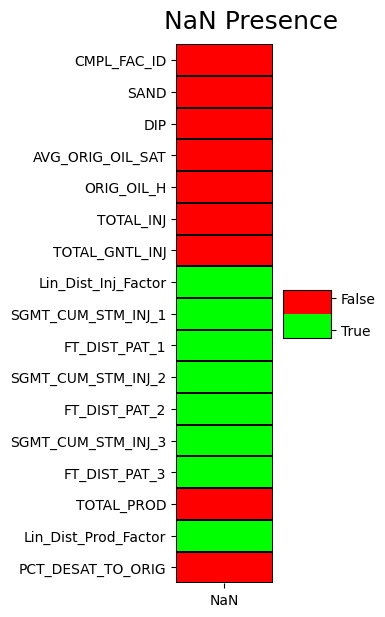

In [22]:
# check the presence of nan values on the variables for the train and validation sets
nan_bool(data=steam)

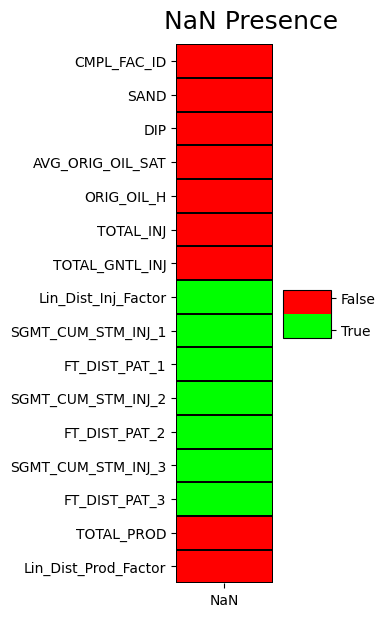

In [23]:
# check the presence of nan values on the variables for the test set
nan_bool(data=steam_test)

In [24]:
# create a function for checking the count of nan values on the variables
def nan_sum(data):
    # data: dataframe to inspect
    
    fig, ax = plt.subplots(figsize=(2, 7))

    nan_sum = pd.DataFrame(data.isna().sum(), columns=['NaN Count'])
    cmap = 'Reds'

    hm = sns.heatmap(nan_sum, cmap=cmap, linewidths=0.005, linecolor='k', annot=True, fmt='g', cbar=True)
    plt.suptitle(y=0.93, t='NaN Count', size=18)
    plt.show()

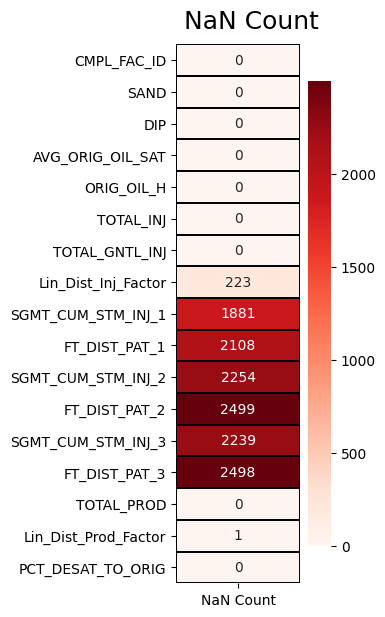

In [25]:
# check the count of nan values on the variables for the train and validation sets
nan_sum(data=steam)

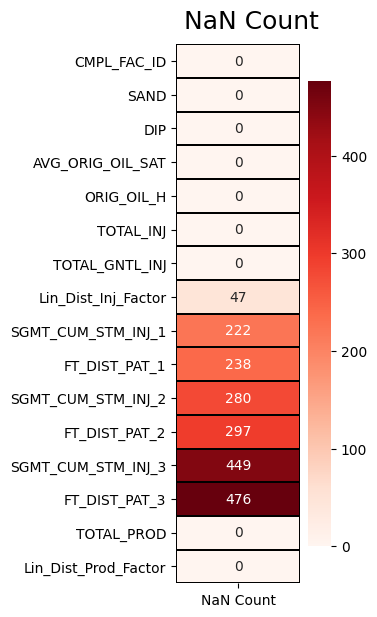

In [26]:
# check the count of nan values on the variables for the test set
nan_sum(data=steam_test)

#### 2.1.3 Data Count

In [27]:
# create a function for obtaining categorical counts
def cat_count(data, variables, categories, label):
    # data: dataframe containing categories
    # variables: names of variables in the dataset
    # categories: categorical data to be counted (i.e. wells or sands)
    # label: label of the count (i.e. 'Well_Count' or 'Sand_Count')
    
    data_count = [[] for i in range(len(variables))]
    for i, var in enumerate(variables):
        for cat in np.unique(categories):
            if data[[var]][data[categories.name]==cat].notnull().any().values == True:
                data_count[i].append(cat)

    data_count_df = pd.DataFrame(([len(i) for i in data_count]), index=variables, columns=[label])
    data_count_df = data_count_df.sort_values(by=label, ascending=False)
    
    return data_count_df

In [28]:
# create a function for plotting categorical counts
def cat_plot(data, figsize, title, label):
    # data: dataframe to plot
    # figsize: size of the figure (tuple)
    # title: title of the figure
    # label: label of the bars
    
    fig, ax = plt.subplots(figsize=figsize)
    data.plot(kind='bar', ax=ax, 
              align='center', fontsize=12, 
              width=0.8, legend=False)

    for j, k in enumerate(np.array([int(data.values[n]) for n in range(len(data.values))])):
        ax.text(j, k+data.max()*0.025, k, ha='center', size=9)
    ax.set_ylim([0, data.max().values+data.max().values*0.25])
    ax.set_xticks(ax.get_xticks())
    ax.set_xticklabels(ax.get_xticklabels(), rotation='30', ha='right', size=10)
    ax.set_xlabel(label, size=12)
    ax.set_ylabel('Count', size=12)
    ax.grid(alpha=0.2)
    plt.suptitle(y=0.93, t=title, size=18)
    plt.tight_layout()

In [29]:
# obtain the well count for each variable
well_count_df = cat_count(data=steam, 
                          variables=steam.columns, 
                          categories=steam.CMPL_FAC_ID, 
                          label='Well_Count')
well_count_df.head()

,Well_Count
CMPL_FAC_ID,400
TOTAL_GNTL_INJ,400
TOTAL_PROD,400
SAND,400
Lin_Dist_Inj_Factor,400


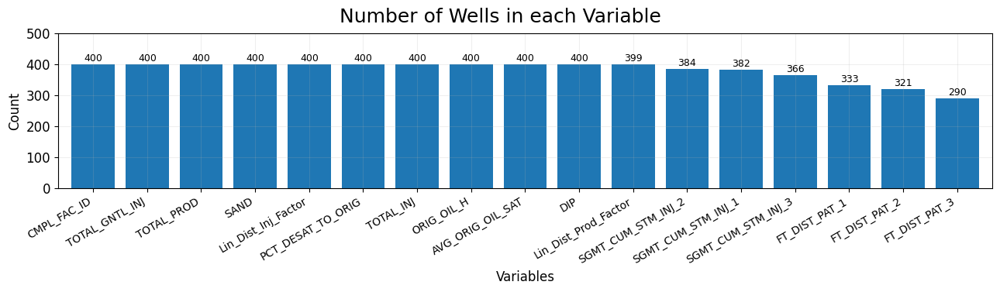

In [30]:
# plot the count of wells per variable
cat_plot(data=well_count_df, 
         figsize=(13, 4), 
         title='Number of Wells in each Variable', 
         label='Variables')

In [31]:
# obtain the sand count for each variable
sand_count_df = cat_count(data=steam, 
                          variables=steam.columns, 
                          categories=steam.SAND, 
                          label='Sand_Count')
sand_count_df.head()

,Sand_Count
CMPL_FAC_ID,20
FT_DIST_PAT_1,20
Lin_Dist_Prod_Factor,20
TOTAL_PROD,20
FT_DIST_PAT_3,20


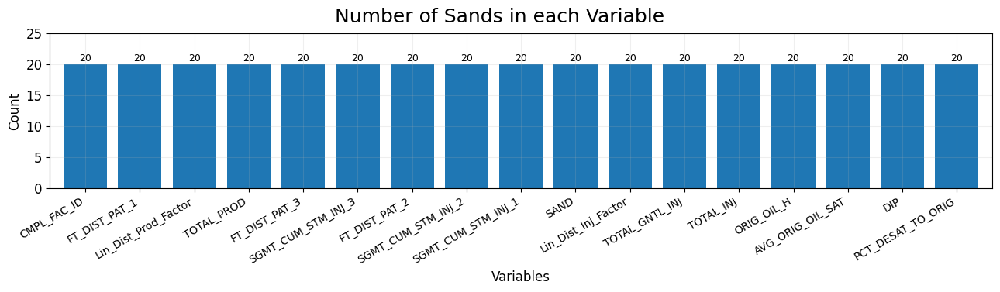

In [32]:
# plot the count of sands per variable
cat_plot(data=sand_count_df, 
         figsize=(13, 4), 
         title='Number of Sands in each Variable', 
         label='Variables')

### 2.2 Data Visualization

In [33]:
# obtain the sum of cummulative volumes of all wells in a sand
# method 1
# specify the volume variables to cummulate
cum_cols = ['TOTAL_INJ', 'TOTAL_GNTL_INJ', 'TOTAL_PROD', 
            'SGMT_CUM_STM_INJ_1', 'SGMT_CUM_STM_INJ_2', 'SGMT_CUM_STM_INJ_3']

# group the data by sand and well
sand_well_groups = steam.groupby(['SAND', 'CMPL_FAC_ID'])

# obtain the cummulatives of the volume variables for each well in a sand
sand_well_groups_max = sand_well_groups.agg({cum_cols[i]: 'max' for i in range(len(cum_cols))})

# regroup the aggregated cummulatives by sand
sand_groups = sand_well_groups_max.groupby('SAND')

# obtain the unique cummulatives of the volume variables for each sand
sand_groups_unique = sand_groups.agg({cum_cols[i]: 'unique' for i in range(len(cum_cols))})

# obtain the sum of unique cummulatives of the volume variables for each sand
cum_df = sand_groups_unique.applymap(np.nan_to_num).applymap(np.sum)

```python
# method 2
# specify the volume variables to cummulate
cum_cols = ['TOTAL_INJ', 'TOTAL_GNTL_INJ', 'TOTAL_PROD', 
            'SGMT_CUM_STM_INJ_1', 'SGMT_CUM_STM_INJ_2', 'SGMT_CUM_STM_INJ_3']

# create a list of lists for gathering the per sand cummulatives of all wells
all_cum = [[] for i in range(len(np.unique(steam.SAND)))]

# create a dictionary for storing the per sand sum of cummulatives of all uniquely valued wells
cum_dn = dict.fromkeys(np.unique(steam.SAND), ())

# slice the data to a particular sand
for i, sand in enumerate(np.unique(steam.SAND)):
    sand_df = steam[steam.SAND==sand]
    
    # slice the data to a particular well in the sand
    for j, well in enumerate(np.unique(sand_df.CMPL_FAC_ID)):
        well_df = sand_df[sand_df.CMPL_FAC_ID==well]
        
        # slice the data to the volume variables
        well_df = well_df[cum_cols]
        
        # obtain the cummulatives of the volume variables 
        well_cum = well_df.max().values
        
        # gather the cummulatives of all wells in the sand
        all_cum[i].append(np.nan_to_num(well_cum))
        
    # convert the list of cummulatives for the sand to a dataframe
    all_cum[i] = pd.DataFrame(np.array(all_cum[i]), columns=cum_cols)
    
    # update the dictionary of cummulatives for the sand with the sum of unique values per variable
    cum_dn[sand] = [all_cum[i][col].unique().sum() for col in cum_cols]

# convert the dictionary of per sand cummulatives to a dataframe
cum_df = pd.DataFrame(cum_dn, index=cum_cols)
cum_df = cum_df.T
```

In [34]:
cum_df.head()

,TOTAL_INJ,TOTAL_GNTL_INJ,TOTAL_PROD,SGMT_CUM_STM_INJ_1,SGMT_CUM_STM_INJ_2,SGMT_CUM_STM_INJ_3
SAND,,,,,,
TULS_B1,4.823742e+10,462200634,2827033817,41917703.0,39325650.0,43360225.0
TULS_B2,3.675035e+10,161929580,1868677095,14353020.0,12375399.0,11329780.0
TULS_B3,3.284041e+10,131037215,2138055297,15853755.0,11891669.0,11566895.0
TULS_B4,2.679640e+10,94878731,1556016841,7167342.0,5386246.0,9162303.0
TULS_B5,3.452222e+10,259252004,1791145400,23252950.0,17338212.0,13785375.0


#### 2.2.1 Pie Chart

In [35]:
# create a function for plotting the pie chart of the relative sum of 
# cummulative volumes of steam injected from each segment in a sand
def pie_plot(data, sands):
    # data: dataframe to be plotted
    # sands: choice of sands to inspect

    nrows = (len(sands)+2)//3
    fig = plt.figure(figsize=(10.5, (10.5/3)*nrows))
    fig.subplots(ncols=3, nrows=nrows)
    
    data_slice = data.loc[np.ravel(sands)]
    
    def text_fmt(pct, data):
        val = pct/100*np.sum(data)
        val = val/1e6
        return '{:.0f}%\n{:.1f} MMbbls'.format(pct, val)

    for i, ax in enumerate(fig.axes):
        if i >= len(sands):
            ax.set_axis_off()
        else:
            ax.pie(x=data_slice.iloc[i, -3:], 
                   labels=None, 
                   autopct=lambda pct: text_fmt(pct, data_slice.iloc[i, -3:]), 
                   textprops=dict(color='w', 
                                  weight='bold', 
                                  size=9))
            ax.set_title(sands[i], size=12)
            
    fig.legend(labels=data_slice.columns[-3:], 
               loc='center left', 
               bbox_to_anchor=(1.01, 0.5), 
               frameon=False, 
               title='SEGMENT', 
               fontsize='large', 
               title_fontsize='x-large')
    plt.suptitle(y=1.005, t='Relative Volume of Steam Injected from each Segment in a Sand', size=18)
    plt.tight_layout(h_pad=1.5)

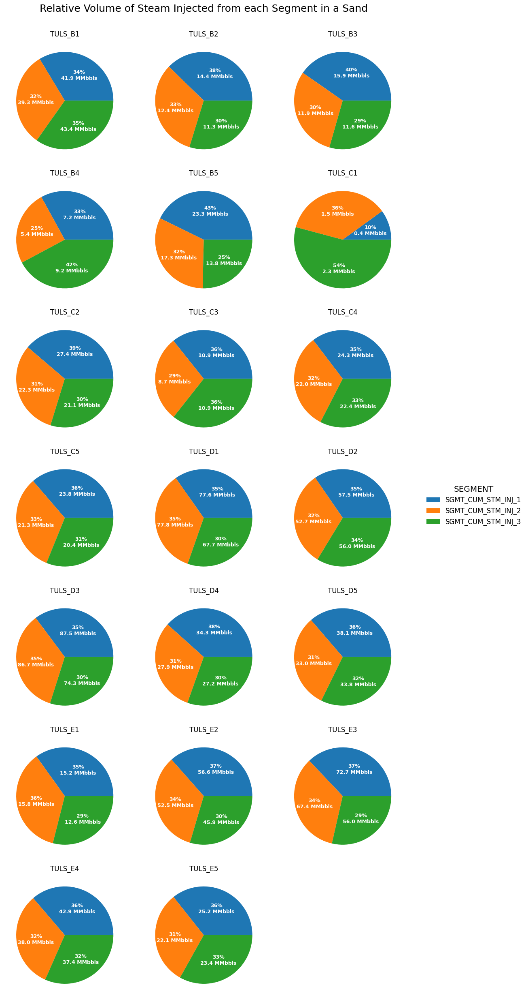

In [36]:
# plot the pie chart
pie_plot(data=cum_df, sands=np.unique(steam.SAND)[:])

#### 2.2.2 Bar Chart

In [37]:
# create a function for plotting the bar chart of sand properties
def bar_plot(data, title):
    # data: dataframe to be plotted
    # title: title of the figure
    
    fig = plt.figure(figsize=(13, 4))
    fig.subplots()

    ax = fig.gca()

    max_count = data.max().values[0]

    data.plot(kind='bar', ax=ax, color=sns.color_palette('tab10')[0])

    ax.set_ylim(0, max_count+max_count/10)
    ax.set_xticklabels(ax.get_xticklabels(), rotation='30', ha='right')
    for i in range(len(data)):   
        ax.text(x=i, y=data.values[i][0]+(max_count/100), s=data.values[i][0], fontsize=9, ha='center')

    plt.grid(alpha=0.2)
    plt.legend(loc='lower right')
    plt.suptitle(y=0.95, t=title, size=18)
    plt.tight_layout()

In [38]:
# obtain the count of wells per sand
sand_well_count = []
for sand in np.unique(steam.SAND):
    sand_well_count.append(steam[steam.SAND==sand]['CMPL_FAC_ID'].unique().size)
sand_well_count_df = pd.DataFrame(sand_well_count, columns=['Sand_Well_Count'], index=np.unique(steam.SAND))
sand_well_count_df.head()

,Sand_Well_Count
TULS_B1,117
TULS_B2,105
TULS_B3,74
TULS_B4,65
TULS_B5,90


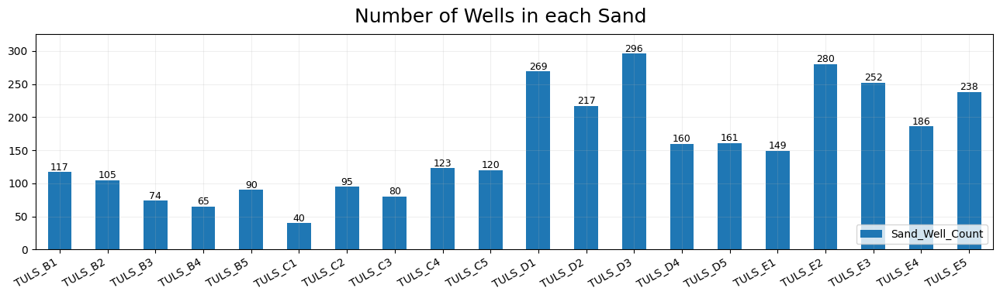

In [39]:
# plot the count of wells per sand
bar_plot(data=sand_well_count_df, title='Number of Wells in each Sand')

In [40]:
# obtain the count of on stream days per sand
sand_day_count = []
for sand in np.unique(steam.SAND):
    sand_day_count.append((steam[steam.SAND==sand].index.max()-steam[steam.SAND==sand].index.min()).days)
sand_day_count_df = pd.DataFrame(sand_day_count, columns=['Sand_Day_Count'], index=np.unique(steam.SAND))
sand_day_count_df.head()

,Sand_Day_Count
TULS_B1,11023
TULS_B2,11002
TULS_B3,11023
TULS_B4,11023
TULS_B5,11023


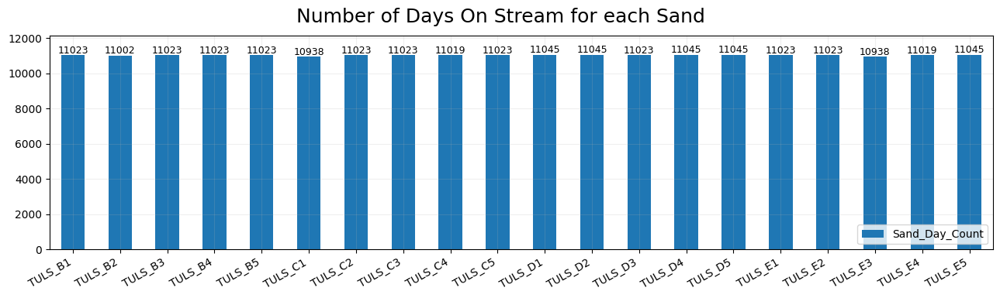

In [41]:
# plot the count of on stream days per sand
bar_plot(data=sand_day_count_df, title='Number of Days On Stream for each Sand')

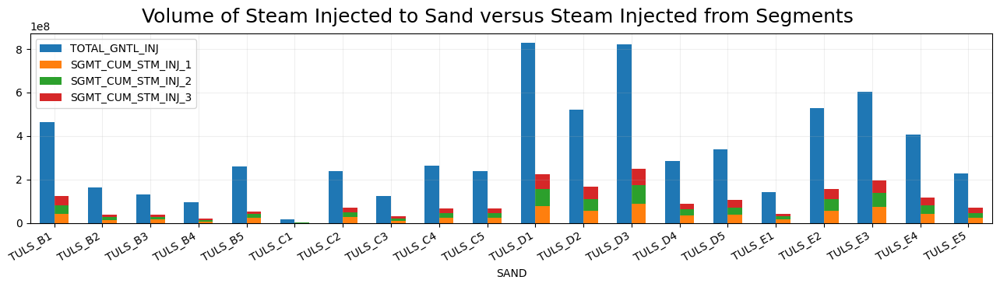

In [42]:
# plot the bar chart of the sum of cummulative steam injection to sand versus injection from segments
fig = plt.figure(figsize=(13, 4))
fig.subplots()

ax = fig.gca()

cum_df.iloc[:, [1]].plot(kind='bar', width=0.3, position=1.0, ax=ax, 
                         stacked=False, color=sns.color_palette('tab10')[0])
cum_df.iloc[:, -3:].plot(kind='bar', width=0.3, position=0.0, ax=ax, 
                         stacked=True, color=sns.color_palette('tab10')[1:])

ax.set_xlim([-0.5, len(cum_df.index)-0.5])
ax.set_xticklabels(ax.get_xticklabels(), rotation='30', ha='right')

plt.grid(alpha=0.2)
plt.suptitle(y=0.91, t='Volume of Steam Injected to Sand versus Steam Injected from Segments', size=18)
plt.tight_layout()

### 2.3 Data Distribution

In [43]:
from matplotlib import cm
from matplotlib import colors
import matplotlib.dates as mdates

In [44]:
# slice the data to numeric columns
steam_slice = steam.drop(['CMPL_FAC_ID', 'SAND'], axis=1)
steam_slice.head()

,DIP,AVG_ORIG_OIL_SAT,ORIG_OIL_H,TOTAL_INJ,TOTAL_GNTL_INJ,Lin_Dist_Inj_Factor,SGMT_CUM_STM_INJ_1,FT_DIST_PAT_1,SGMT_CUM_STM_INJ_2,FT_DIST_PAT_2,SGMT_CUM_STM_INJ_3,FT_DIST_PAT_3,TOTAL_PROD,Lin_Dist_Prod_Factor,PCT_DESAT_TO_ORIG
SURV_DTE,,,,,,,,,,,,,,,
2012-10-25,0.05,0.7,21.06,1.246190e+08,3164720,0.269,NaN,NaN,551231.0,372.0,942465.0,465.0,8904160,0.410639,1.00
2016-09-02,0.05,0.7,21.06,1.791845e+08,4085829,0.302,NaN,NaN,963379.0,372.0,994686.0,465.0,18796208,0.380935,1.00
1990-01-01,0.06,0.7,14.58,0.000000e+00,0,0.218,0.0,NaN,0.0,NaN,0.0,465.0,0,0.410639,0.00
2012-10-25,0.06,0.7,14.58,1.246190e+08,511013,0.218,NaN,NaN,NaN,NaN,232391.0,465.0,8904160,0.410639,0.79
2016-09-02,0.06,0.7,14.58,1.791845e+08,880407,0.229,NaN,NaN,NaN,NaN,416613.0,465.0,18796208,0.380935,1.00


#### 2.3.1 Violin Plot

In [45]:
# create a function for plotting the violin plot to inspect the data spread and centers
def violin_plot(data, categories, sands):
    # data: dataframe to be plotted
    # categories: categorical data to be visualized
    # sands: choice of sands to inspect
    
    data_wide = pd.concat([data, categories], axis=1)
    data_wide = data_wide.set_index(categories.name).loc[np.ravel(sands)]
    data_long = data_wide.reset_index().melt(id_vars=categories.name, value_vars=data.columns)
    
    colors = cm.get_cmap('tab10').colors + cm.get_cmap('Dark2').colors
    
    fg = sns.catplot(kind='violin', data=data_long, 
                     x='variable', y='value', 
                     row=categories.name, scale='count', 
                     height=3, aspect=4.25, 
                     sharex=False, sharey=True, 
                     palette=colors)
    
    for i, ax in enumerate(fg.fig.axes):
        ax.set_xticks(ax.get_xticks())
        ax.set_xticklabels(ax.get_xticklabels(), rotation='40', ha='right')
        ax.set_xlabel('Variable', size=12)
        ax.set_ylabel('Value', size=12)
        ax.set_title(ax.get_title(), size=14)
        ax.spines['right'].set_visible(True)
        ax.spines['top'].set_visible(True)
        ax.spines['left'].set_visible(True)
        ax.spines['bottom'].set_visible(True)
        ax.grid(alpha=0.2)

    #for text in fg.legend.get_texts():
        #text.set_fontsize(12)
    #fg.legend.get_title().set_fontsize(14)
    #plt.setp(fg.legend.get_texts(), fontsize=12)
    #plt.setp(fg.legend.get_title(), fontsize=14)
    fg.fig.text(0.5, 1.01, 'Violin Plot', ha='center', va='center', size=18)
    fg.tight_layout(h_pad=1.5)

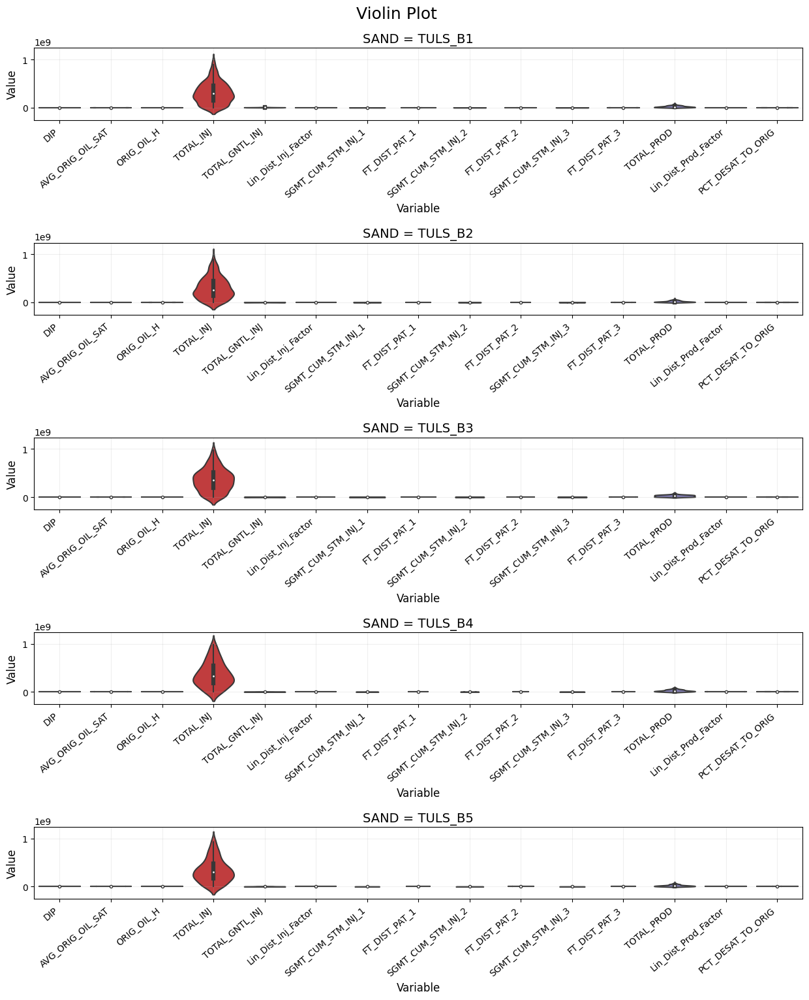

In [46]:
# plot the violin plot of the B sands on the train and validation sets
violin_plot(data=steam_slice, 
            categories=steam.SAND, 
            sands=np.unique(steam.SAND)[:5])

From observation of the violin plot of features for the B sands, the feature scale is dominated by TOTAL_INJ which has a wider spread of values than all other features. 

The scale imbalance must be resolved to enable scale sensitive ML algorithms, such as K-Nearest Neigbors (KNN) to perform well on the dataset. 

On the other hand, ensembles such as Random Forest are capable of handling such scale imbalance without the need for transformation.

#### 2.3.2 Histogram Plot

In [47]:
# create a function for plotting the histogram plot to inspect the frequency distribution and trend
def histogram_plot(data, categories, sands, scale):
    # data: dataframe to be plotted
    # categories: categorical data to be visualized
    # sands: choice of sands to inspect
    # scale: type of scale to use on the x-axis (one of 'log' or 'linear')
    
    data_wide = pd.concat([data, categories], axis=1)
    data_wide = data_wide.set_index(categories.name).loc[np.ravel(sands)]
    data_long = data_wide.reset_index().melt(id_vars=categories.name, value_vars=data.columns)
    
    colors = cm.get_cmap('tab10').colors + cm.get_cmap('Dark2').colors

    #min_value = np.floor(data.min().min())
    #max_value = np.ceil(data.max().max())

    if scale == 'log':
        fg = sns.displot(kind='hist', data=data_long, 
                         x='value', hue=categories.name, 
                         col='variable', col_wrap=4, 
                         kde=False, bins=25, 
                         height=3, aspect=1, 
                         log_scale=True, facet_kws={'sharex': False}, 
                         palette=colors)
    elif scale == 'linear':
        fg = sns.displot(kind='hist', data=data_long, 
                         x='value', hue=categories.name, 
                         col='variable', col_wrap=4, 
                         kde=False, bins=25, 
                         height=3, aspect=1, 
                         log_scale=None, facet_kws={'sharex': False}, 
                         palette=colors)

    for (i, ax), col in zip(enumerate(fg.fig.axes), data.columns):
        if scale == 'log':
            ax.set_xlabel('Value (Log)', size=12)
        elif scale == 'linear':
            ax.set_xlabel('Value', size=12)
        ax.set_ylabel(ax.get_ylabel(), size=12)
        ax.set_title(col, size=14)
        ax.spines['right'].set_visible(True)
        ax.spines['top'].set_visible(True)
        ax.spines['left'].set_visible(True)
        ax.spines['bottom'].set_visible(True)
        ax.grid(alpha=0.2)

    #for text in fg.legend.get_texts():
        #text.set_fontsize(12)
    #fg.legend.get_title().set_fontsize(14)
    plt.setp(fg.legend.get_texts(), fontsize=12)
    plt.setp(fg.legend.get_title(), fontsize=14)
    fg.fig.text(0.5, 1.02, 'Histogram Plot', ha='center', va='center', size=18)
    fg.tight_layout(h_pad=1.5)

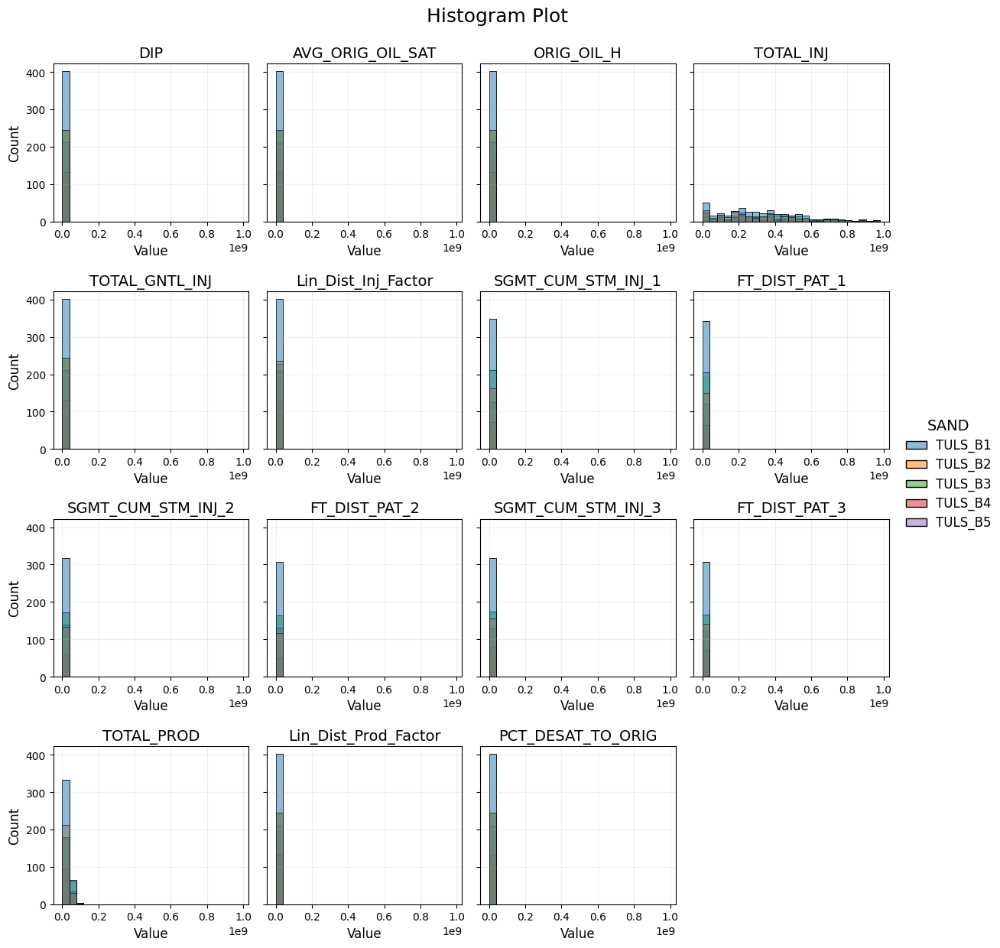

In [48]:
# plot the histogram plot of the B sands on the train and validation sets
histogram_plot(data=steam_slice, 
               categories=steam.SAND, 
               sands=np.unique(steam.SAND)[:5], 
               scale='linear')

The scale imbalance is once again observable on the histogram plot of features for the B sands.

The wider range of values on the TOTAL_INJ feature obscures the frequency distribution of other features when they are all fixed at the same range.

#### 2.3.3 Scatter Plot

In [49]:
# create a function for plotting the scatter plot to inspect the variables relationship and correlation
def scatter_plot(data, categories, sands):
    # data: dataframe to be plotted
    # categories: categorical data to be visualized
    # sands: choice of sands to inspect
    
    data_wide = pd.concat([data, categories], axis=1)
    data_wide = data_wide.set_index(categories.name).loc[np.ravel(sands)]
    data_wide = data_wide.reset_index()
    
    colors = cm.get_cmap('tab10').colors + cm.get_cmap('Dark2').colors

    markers = ['o', 'p', 'v', 'h', '^']
    
    min_value = data_wide.drop([categories.name], axis=1).min().min()
    max_value = data_wide.drop([categories.name], axis=1).max().max()

    pg = sns.pairplot(kind='scatter', data=data_wide, 
                      hue=categories.name, vars=data_wide.drop([categories.name], axis=1).columns, 
                      markers=markers, plot_kws={'s': 20}, 
                      corner=True, 
                      height=11.5/len(data.columns), aspect=1, 
                      palette=colors)

    for i, ax in enumerate(pg.fig.axes):
        #ax.set_xlim(min_value, max_value)
        #ax.set_ylim(min_value, max_value)
        ax.set_xlabel(ax.get_xlabel(), rotation=30, ha='right', va='top', size=8)
        ax.set_ylabel(ax.get_ylabel(), rotation=30, ha='right', va='top', size=8)
        ax.spines['right'].set_visible(True)
        ax.spines['top'].set_visible(True)
        ax.spines['left'].set_visible(True)
        ax.spines['bottom'].set_visible(True)
        ax.grid(alpha=0.2)

    #for text in pg.legend.get_texts():
        #text.set_fontsize(12)
    #pg.legend.get_title().set_fontsize(14)
    plt.setp(pg.legend.get_texts(), fontsize=12)
    plt.setp(pg.legend.get_title(), fontsize=14)
    pg.fig.text(0.5, 1.005, 'Scatter Plot', ha='center', va='center', size=18)
    #pg.tight_layout()

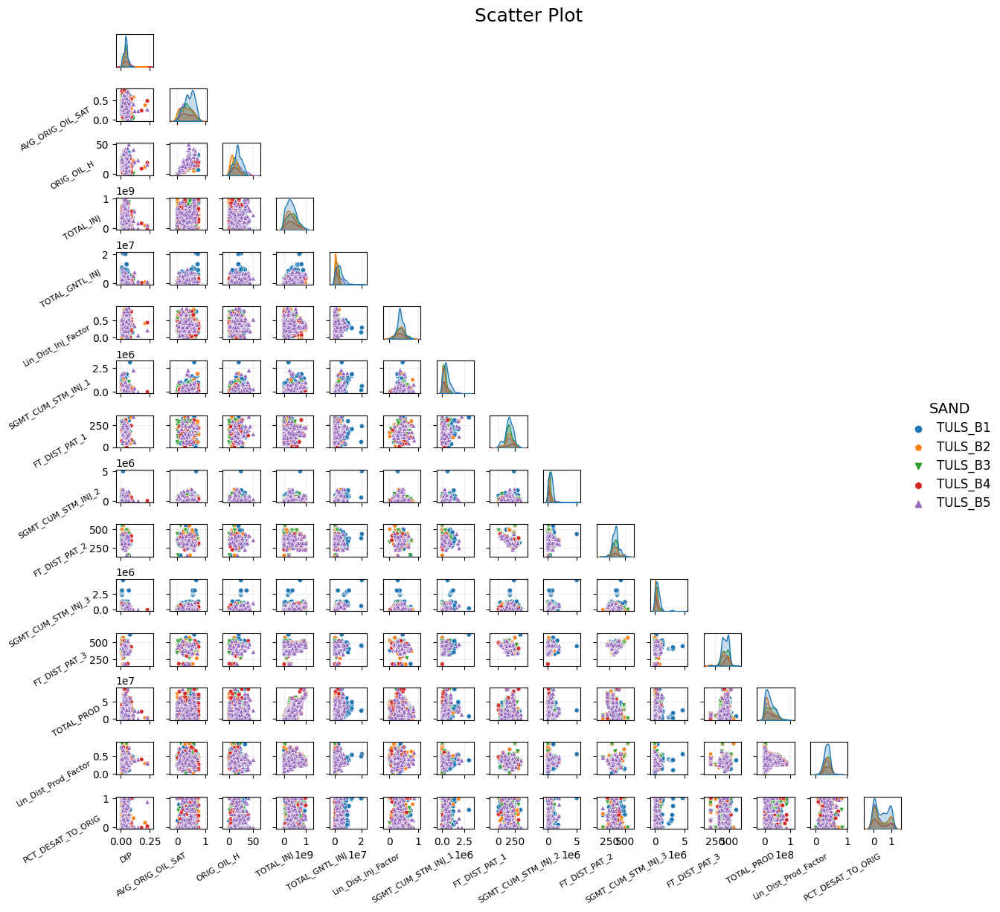

In [50]:
# plot the scatter plot of the B sands on the train and validation sets
scatter_plot(data=steam_slice, 
             categories=steam.SAND, 
             sands=np.unique(steam.SAND)[:5])

The relationship between variables can be observed on the scatter plot for the B sands.

Some features show a positive correlation to one another, such as can be seen between ORIG_OIL_H and AVG_ORIG_OIL_SAT, and TOTAL_PROD and TOTAL_INJ. 

The cluster space appears to be dominated by the B5 sand which has a relatively larger sample size than the other B sands.

#### 2.3.4 Production Plot

In [51]:
# create a function for plotting the production profile of the features for the first few wells in a sand
def production_plot(data, sand, n_wells):
    # data: dataframe to be plotted
    # sand: choice of sand to inspect
    # n_wells: number of wells to inspect
    
    # drop constant variables and keep volume and distance variables
    for col in  ['DIP', 'AVG_ORIG_OIL_SAT', 'ORIG_OIL_H']:
        if col in data.columns:
            data = data.drop([col], axis=1)
    
    data_slice = data.reset_index()
    data_slice = data_slice.set_index('SAND').loc[np.ravel(sand)]
    data_slice = data_slice.set_index('CMPL_FAC_ID').loc[np.unique(data_slice.CMPL_FAC_ID)[:n_wells]]
    data_slice = data_slice.reset_index()
    data_slice = data_slice.set_index('SURV_DTE')
    
    columns = data_slice.drop(['CMPL_FAC_ID'], axis=1).columns
    colors = cm.get_cmap('tab10').colors + cm.get_cmap('Dark2').colors
    
    fig = plt.figure(figsize=(11.5, 2*len(columns)))
    fig.subplots(nrows=len(columns))

    for (i, ax), col in zip(enumerate(fig.axes), columns):
        sns.lineplot(data=data_slice, ax=ax, 
                     x=data_slice.index, y=col, 
                     hue='CMPL_FAC_ID', 
                     palette='tab10', 
                     marker='o', 
                     markersize=6)

        ax.set_xlabel('Date', size=12)
        ax.set_ylabel('Value', size=12)
        ax.set_title(col, size=14)
        ax.grid(alpha=0.2)
        ax.get_legend().remove()

    handles, labels = plt.gca().get_legend_handles_labels()
    fig.legend(handles=handles, 
               labels=labels, 
               loc='center left', 
               bbox_to_anchor=(1.01, 0.5), 
               frameon=False, 
               title='CMPL_FAC_ID', 
               fontsize='large', 
               title_fontsize='x-large')
    plt.suptitle(y=1.001, t='Production Profile: ' + sand, size=18)
    plt.tight_layout(h_pad=1.5)

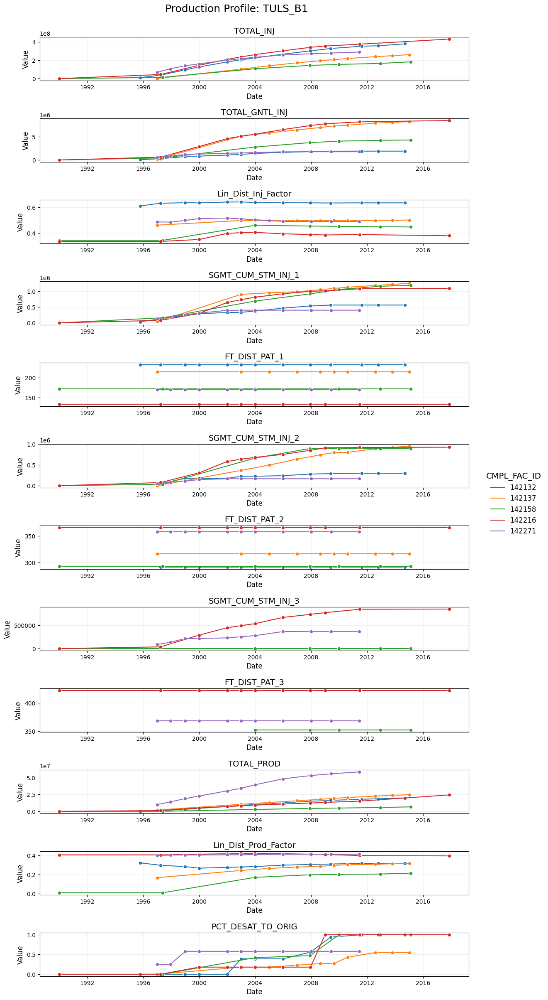

In [52]:
# plot the production profile of the first five wells in the B1 sand on the train and validation sets
production_plot(data=steam, 
                sand=np.unique(steam.SAND)[0], 
                n_wells=5)

The production profile of variables for the B1 sand shows the trend of values with increasing on stream time.

The volume varibales (TOTAL_INJ, TOTAL_GNTL_INJ, TOTAL_PROD, SGMT_CUM_STM_INJ_1, SGMT_CUM_STM_INJ_2, SGMT_CUM_STM_INJ_3) are cummulatives.

## 3. Data Preprocessing

The dataset has the following structural characteristics which will inform the manner in which the machine learning analysis is approached.
- The target variable (PCT_DESAT_TO_ORIG) in the learning task is a univariate time series. This means the target is a single time series vector as opposed to a matrix of multiple time series vectors otherwise known as multivariate time series.


- The endogenous variable (PCT_DESAT_TO_ORIG) in the learning task has corresponding exogenous variables. This means the target (dependent variable) has features (independent variables or covariates) that can be used to predict it.


- The dataset is hierarchical having two categorical groups (CMPL_FAC_ID and SAND). Each well-sand combination is an instance (also known as observational unit or record), and each instance is in itself a time series while the entire dataset is an amalgamation of multiple instances.


- The timesteps (frequency) of the time series are irregular, varying between a few days to several years. 

To account for these intricacies, the machine learning analysis will be treated as a hierachical time series regression. The observational units (i.e. well-sand combinations) are related. They represent production data from individual wells in individual sands in a field. Hence, a global forcast will be performed by using a single function to forecast all units. Global forecasting benefits from learning related time series to improve generalization performance. Moreover, global forecasting has been shown to also outperform local forecsting (i.e. using seperate models for each observational unit) in cases where the time series are unrelated.

### 3.1 Split Data

A custom group-wise temporal train-test split will be used to generate the training and validation sets. The group-wise splitting ensures that samples from all observational units are represented in the training set. The temporal splitting ensures that future observations (forecast instances) on each unit are not used to predict historical observations (backcast instances). This form of data leakage is known as look-ahead bias and it leads to overconfidence in models which in reality are unable to generalize well to unseen data.

About 80% of the samples in each observational unit will be set aside as the training set, while the remaining 20% will serve as validation set. However, due to presence of units with only one sample and approximations in computing fractions of the sample size of each unit, the datasets may be have a few more or less samples than expected. This is a naive implementation.

In [53]:
# split the data to train, validation and test sets
steam_train = steam.groupby(['CMPL_FAC_ID', 'SAND']).apply(lambda x: x.iloc[:int(np.round(0.8*len(x)))])
steam_valid = steam.groupby(['CMPL_FAC_ID', 'SAND']).apply(lambda x: x.iloc[int(np.round(0.8*len(x))):])
steam_train.index = steam_train.index.droplevel(['CMPL_FAC_ID', 'SAND'])
steam_valid.index = steam_valid.index.droplevel(['CMPL_FAC_ID', 'SAND'])
steam_test = steam_test

In [54]:
steam_train.head()

,CMPL_FAC_ID,SAND,DIP,AVG_ORIG_OIL_SAT,ORIG_OIL_H,TOTAL_INJ,TOTAL_GNTL_INJ,Lin_Dist_Inj_Factor,SGMT_CUM_STM_INJ_1,FT_DIST_PAT_1,SGMT_CUM_STM_INJ_2,FT_DIST_PAT_2,SGMT_CUM_STM_INJ_3,FT_DIST_PAT_3,TOTAL_PROD,Lin_Dist_Prod_Factor,PCT_DESAT_TO_ORIG
SURV_DTE,,,,,,,,,,,,,,,,,
2012-10-25,435,TULS_D1,0.05,0.7,21.06,1.246190e+08,3164720,0.269,NaN,NaN,551231.0,372.0,942465.0,465.0,8904160,0.410639,1.00
2016-09-02,435,TULS_D1,0.05,0.7,21.06,1.791845e+08,4085829,0.302,NaN,NaN,963379.0,372.0,994686.0,465.0,18796208,0.380935,1.00
1990-01-01,435,TULS_D2,0.06,0.7,14.58,0.000000e+00,0,0.218,0.0,NaN,0.0,NaN,0.0,465.0,0,0.410639,0.00
2012-10-25,435,TULS_D2,0.06,0.7,14.58,1.246190e+08,511013,0.218,NaN,NaN,NaN,NaN,232391.0,465.0,8904160,0.410639,0.79
2012-10-25,435,TULS_D3,0.08,0.5,34.87,1.246190e+08,2732929,0.311,297002.0,130.0,303999.0,372.0,404119.0,465.0,8904160,0.410639,0.35


In [55]:
# check the number of well-sand combinations on each dataset
print('Super Set Groups: {}'.format(steam.groupby(['CMPL_FAC_ID', 'SAND']).ngroups))
print('Train Set Groups: {}'.format(steam_train.groupby(['CMPL_FAC_ID', 'SAND']).ngroups))
print('Validation Set Groups: {}'.format(steam_valid.groupby(['CMPL_FAC_ID', 'SAND']).ngroups))
print('Test Set Groups: {}'.format(steam_test.groupby(['CMPL_FAC_ID', 'SAND']).ngroups))

Super Set Groups: 3117
Train Set Groups: 3117
Validation Set Groups: 778
Test Set Groups: 321


After splitting, the train set contains samples for all observational units in the super set. The number of units present in the validation set is much fewer than the super set due to the presence of units with only one sample. However, the validation set has more units than the test set, making it representative for evaluating the generalization performance of the models before deploying them on the test set.

In [56]:
# check the ratio of train to validation data count
print('Train Fraction: {}'.format(np.round(len(steam_train)/
                                           len(steam), 
                                           decimals=2)))
print('Validation Fraction: {}'.format(np.round(len(steam_valid)/
                                                len(steam), 
                                                decimals=2)))

Train Fraction: 0.87
Validation Fraction: 0.13


The true ratio of train to validation data after the temporal split is 87% to 13%.

In [57]:
# create a list of the variable columns
sel_cols = list(steam.columns)

# separate the feature and target columns
feat_cols = sel_cols[:-1]
targ_cols = sel_cols[-1:]

In [58]:
# check the number of features and target
print('Features: {}'.format(len(feat_cols)))
print('Target: {}'.format(len(targ_cols)))

Features: 16
Target: 1


In [59]:
# split the data to feature and target columns
X_steam_train = steam_train.loc[:, feat_cols]
X_steam_valid = steam_valid.loc[:, feat_cols]
X_steam_test = steam_test.loc[:, feat_cols]
y_steam_train = steam_train.loc[:, targ_cols]
y_steam_valid = steam_valid.loc[:, targ_cols]

In [60]:
X_steam_train.head()

,CMPL_FAC_ID,SAND,DIP,AVG_ORIG_OIL_SAT,ORIG_OIL_H,TOTAL_INJ,TOTAL_GNTL_INJ,Lin_Dist_Inj_Factor,SGMT_CUM_STM_INJ_1,FT_DIST_PAT_1,SGMT_CUM_STM_INJ_2,FT_DIST_PAT_2,SGMT_CUM_STM_INJ_3,FT_DIST_PAT_3,TOTAL_PROD,Lin_Dist_Prod_Factor
SURV_DTE,,,,,,,,,,,,,,,,
2012-10-25,435,TULS_D1,0.05,0.7,21.06,1.246190e+08,3164720,0.269,NaN,NaN,551231.0,372.0,942465.0,465.0,8904160,0.410639
2016-09-02,435,TULS_D1,0.05,0.7,21.06,1.791845e+08,4085829,0.302,NaN,NaN,963379.0,372.0,994686.0,465.0,18796208,0.380935
1990-01-01,435,TULS_D2,0.06,0.7,14.58,0.000000e+00,0,0.218,0.0,NaN,0.0,NaN,0.0,465.0,0,0.410639
2012-10-25,435,TULS_D2,0.06,0.7,14.58,1.246190e+08,511013,0.218,NaN,NaN,NaN,NaN,232391.0,465.0,8904160,0.410639
2012-10-25,435,TULS_D3,0.08,0.5,34.87,1.246190e+08,2732929,0.311,297002.0,130.0,303999.0,372.0,404119.0,465.0,8904160,0.410639


In [61]:
y_steam_train.head()

,PCT_DESAT_TO_ORIG
SURV_DTE,
2012-10-25,1.00
2016-09-02,1.00
1990-01-01,0.00
2012-10-25,0.79
2012-10-25,0.35


In [62]:
# check the shape of the features and target for the train, validation and test sets
print('Train Features: {}'.format(X_steam_train.shape))
print('Validation Features: {}'.format(X_steam_valid.shape))
print('Test Features: {}'.format(X_steam_test.shape))
print('Train Target: {}'.format(y_steam_train.shape))
print('Validation Target: {}'.format(y_steam_valid.shape))

Train Features: (6934, 16)
Validation Features: (1070, 16)
Test Features: (1504, 16)
Train Target: (6934, 1)
Validation Target: (1070, 1)


In [63]:
# create a function for merging datasets
def merge(data, axis):
    # data: list of dataframes to merge
    # axis: axis along which to merge
    
    data_merge = pd.concat(data, axis=axis)
    
    # sort values by wells, sands and survey dates if merging along rows (axis=0)
    if axis == 0:
        well_sand_idx = pd.concat([steam_train[['CMPL_FAC_ID', 'SAND']], 
                                   steam_valid[['CMPL_FAC_ID', 'SAND']]], 
                                  axis=0)
        data_merge = data_merge.set_index([well_sand_idx.CMPL_FAC_ID, 
                                           well_sand_idx.SAND, 
                                           data_merge.index]).sort_index()
        data_merge.index = data_merge.index.droplevel(['CMPL_FAC_ID', 'SAND'])
    
    return data_merge

In [64]:
# merge the train and validation feature sets
X_steam = merge(data=[X_steam_train, X_steam_valid], axis=0)
X_steam.head()

,CMPL_FAC_ID,SAND,DIP,AVG_ORIG_OIL_SAT,ORIG_OIL_H,TOTAL_INJ,TOTAL_GNTL_INJ,Lin_Dist_Inj_Factor,SGMT_CUM_STM_INJ_1,FT_DIST_PAT_1,SGMT_CUM_STM_INJ_2,FT_DIST_PAT_2,SGMT_CUM_STM_INJ_3,FT_DIST_PAT_3,TOTAL_PROD,Lin_Dist_Prod_Factor
SURV_DTE,,,,,,,,,,,,,,,,
2012-10-25,435,TULS_D1,0.05,0.7,21.06,1.246190e+08,3164720,0.269,NaN,NaN,551231.0,372.0,942465.0,465.0,8904160,0.410639
2016-09-02,435,TULS_D1,0.05,0.7,21.06,1.791845e+08,4085829,0.302,NaN,NaN,963379.0,372.0,994686.0,465.0,18796208,0.380935
1990-01-01,435,TULS_D2,0.06,0.7,14.58,0.000000e+00,0,0.218,0.0,NaN,0.0,NaN,0.0,465.0,0,0.410639
2012-10-25,435,TULS_D2,0.06,0.7,14.58,1.246190e+08,511013,0.218,NaN,NaN,NaN,NaN,232391.0,465.0,8904160,0.410639
2016-09-02,435,TULS_D2,0.06,0.7,14.58,1.791845e+08,880407,0.229,NaN,NaN,NaN,NaN,416613.0,465.0,18796208,0.380935


In [65]:
# merge the train and validation target sets
y_steam = merge(data=[y_steam_train, y_steam_valid], axis=0)
y_steam.head()

,PCT_DESAT_TO_ORIG
SURV_DTE,
2012-10-25,1.00
2016-09-02,1.00
1990-01-01,0.00
2012-10-25,0.79
2016-09-02,1.00


### 3.2 Missing Data

In most real-world datasets, some variable records are void which may be due to several factors such as random or systematic error in the data acquisition or the instrinsic characteristics of the quantity or property being observed. Missing data is a source of model bias and may worsen the perfortmance of an ML model. They fall into four categories depending on the source, these are Missing Completely at Random (MCAR), Missing at Random (MAR), Missing Not at Random (MNAR), or Structurally Missing Data. These categories determine how the missing data should be treated to obtain the best model performance. In the MCAR case, the probability of a value being missing is the same for all observations in the dataset. The missing values are randomly distributed over the data sample, so there is no pattern to the missingness. These usually arise from random error in data gathering and do not generate bias. In the MAR case, the probability of a value being missing is related to the observed values in the dataset, but not to the unobserved values. There is a pattern to the missingness. These may be due to systematic error and leads to bias. In the MNAR case, the probability of a value being missing is related to the unobserved values in the dataset. These are also systematic and introduce bias. Finally, in the structurally missing data case, the data is missing for a logical reason stemming from the data collection process. The missing data simply should not exist.

In [66]:
from sklearn.impute import MissingIndicator

#### 3.2.1 Missing Indicator

A binary (boolean) matrix can be used to investigate which observations are missing on the variables in the dataset.

In [67]:
# create a function for generating the missing data mask
def missing_mask(data):
    # data: dataframe to mask
    
    mask_data = data.set_index([data.CMPL_FAC_ID, data.SAND, data.index]).drop(['CMPL_FAC_ID', 'SAND'], axis=1)
    nan_mask = MissingIndicator(missing_values=np.nan, features='all', sparse='auto').fit_transform(mask_data)
    nan_mask = pd.DataFrame(nan_mask, index=mask_data.index, columns=mask_data.columns)
    
    return nan_mask

In [68]:
# generate the missing data mask for the train, validation and test sets
nan_mask_train = missing_mask(data=X_steam_train)
nan_mask_valid = missing_mask(data=X_steam_valid)
nan_mask_test = missing_mask(data=X_steam_test)

In [69]:
nan_mask_train.head()

DIP  AVG_ORIG_OIL_SAT  ORIG_OIL_H  \
CMPL_FAC_ID SAND    SURV_DTE                                          
435         TULS_D1 2012-10-25  False             False       False   
                    2016-09-02  False             False       False   
            TULS_D2 1990-01-01  False             False       False   
                    2012-10-25  False             False       False   
            TULS_D3 2012-10-25  False             False       False   

                                TOTAL_INJ  TOTAL_GNTL_INJ  \
CMPL_FAC_ID SAND    SURV_DTE                                
435         TULS_D1 2012-10-25      False           False   
                    2016-09-02      False           False   
            TULS_D2 1990-01-01      False           False   
                    2012-10-25      False           False   
            TULS_D3 2012-10-25      False           False   

                                Lin_Dist_Inj_Factor  SGMT_CUM_STM_INJ_1  \
CMPL_FAC_ID SAND    SURV_DTE                                              
435         TULS_D1 2012-10-25                False                True   
                    2016-09-02                False                True   
            TULS_D2 1990-01-01                False               False   
                    2012-10-25                False                True   
            TULS_D3 2012-10-25                False               False   

                                FT_DIST_PAT_1  SGMT_CUM_STM_INJ_2  \
CMPL_FAC_ID SAND    SURV_DTE                                        
435         TULS_D1 2012-10-25           True               False   
                    2016-09-02           True               False   
            TULS_D2 1990-01-01           True               False   
                    2012-10-25           True                True   
            TULS_D3 2012-10-25          False               False   

                                FT_DIST_PAT_2  SGMT_CUM_STM_INJ_3  \
CMPL_FAC_ID SAND    SURV_DTE                                        
435         TULS_D1 2012-10-25          False               False   
                    2016-09-02          False               False   
            TULS_D2 1990-01-01           True               False   
                    2012-10-25           True               False   
            TULS_D3 2012-10-25          False               False   

                                FT_DIST_PAT_3  TOTAL_PROD  \
CMPL_FAC_ID SAND    SURV_DTE                                
435         TULS_D1 2012-10-25          False       False   
                    2016-09-02          False       False   
            TULS_D2 1990-01-01          False       False   
                    2012-10-25          False       False   
            TULS_D3 2012-10-25          False       False   

                                Lin_Dist_Prod_Factor  
CMPL_FAC_ID SAND    SURV_DTE                          
435         TULS_D1 2012-10-25                 False  
                    2016-09-02                 False  
            TULS_D2 1990-01-01                 False  
                    2012-10-25                 False  
            TULS_D3 2012-10-25                 False

In [70]:
# create a function for plotting the missing data indicator for a well in sand
def missing_plot(nan_mask, figsize, sand, well_idx):
    # nan_mask: boolean nan mask
    # figsize: size of the figure (tuple)
    # sand: choice of sand to inspect
    # well_idx: index of the well in the sand to inspect
    
    nan_mask_slice = nan_mask.query('SAND==@sand')
    well = np.unique(nan_mask_slice.index.get_level_values('CMPL_FAC_ID'))[well_idx]
    nan_mask_slice = nan_mask_slice.query('CMPL_FAC_ID==@well')
    nan_mask_slice.index = nan_mask_slice.index.droplevel(['CMPL_FAC_ID', 'SAND'])
    nan_mask_slice = nan_mask_slice.sort_index()
    
    fig = plt.figure(figsize=figsize)
    
    cmap = ListedColormap(['red', 'lime'])
    
    ax = sns.heatmap(nan_mask_slice, xticklabels=nan_mask_slice.columns, cmap=cmap, cbar=False)
    axa = ax.secondary_xaxis('top')
    ax.set_xticks(ax.get_xticks())
    axa.set_xticks(ax.get_xticks())
    ax.set_xticklabels(ax.get_xticklabels(), size=12, rotation='30', ha='right')
    axa.set_xticklabels(ax.get_xticklabels(), size=12, rotation='-30', ha='right')
    yticklabels = [datetime.date.strftime(i, '%b-%Y') for i in nan_mask_slice.index]
    ax.set_yticklabels(yticklabels, size=12)
    ax.set_ylabel('Date', size=12)
    
    for i in range(nan_mask_slice.shape[1]): 
        ax.axvline(x=i+1, c='k', lw=1.5)
        
    for i in range(nan_mask_slice.shape[0]): 
        ax.axhline(y=i+1, c='k', lw=0.5)
    
    plt.suptitle(y=0.99, t='Missing Indicator: {} - Well {}'.format(sand, well), size=18)
    plt.tight_layout()

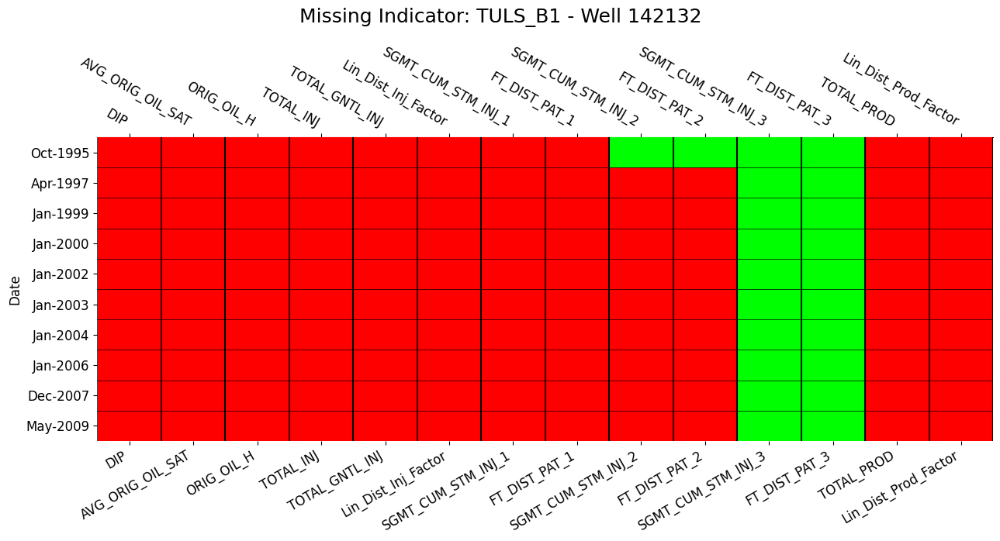

In [71]:
# plot the missing data indicator for a well in a sand in the train set
missing_plot(nan_mask=nan_mask_train, 
             figsize=(13, 7), 
             sand=np.unique(steam.SAND)[0], 
             well_idx=0)

#### 3.2.2 Data Imputation

Imputation is neccesary for algorithms that are incapable of handling missing data. This is characteristic of most generic statistical ML algorithms, as well as the common bagging and boosting methods such as Random Forest (RF) and Gradient Boosting Machine (GBM). However, some higher-end tree ensemble algorithms have been designed to handle missing data in their own unique way. Examples are the Histogram GBM, Extreme GBM, Light GBM and Categorical GBM. 

On the dataset, missing values occur where a sand ends before reaching an injection well, meaning the sand is not present. This is characteristic of Structurally Missing Data since observations are missing for a logical reason. The missing values occur on the numeric variables associated with injection. These variables are all positively valued, so a unique negative value will be used for the imputation. This way, the models can learn the pattern of missing data, rather than confusing them as real values. Alternatively, using a measure of central tendency, such as the mean or median of the varibales, will introduce bias to the models.

In [72]:
# perform imputation of missing values on the train, validation and test sets
X_steam_imputed_train = X_steam_train.fillna(-999).astype(X_steam_train.dtypes)
X_steam_imputed_valid = X_steam_valid.fillna(-999).astype(X_steam_train.dtypes)
X_steam_imputed_test = X_steam_test.fillna(-999).astype(X_steam_train.dtypes)

In [73]:
X_steam_imputed_train.head()

,CMPL_FAC_ID,SAND,DIP,AVG_ORIG_OIL_SAT,ORIG_OIL_H,TOTAL_INJ,TOTAL_GNTL_INJ,Lin_Dist_Inj_Factor,SGMT_CUM_STM_INJ_1,FT_DIST_PAT_1,SGMT_CUM_STM_INJ_2,FT_DIST_PAT_2,SGMT_CUM_STM_INJ_3,FT_DIST_PAT_3,TOTAL_PROD,Lin_Dist_Prod_Factor
SURV_DTE,,,,,,,,,,,,,,,,
2012-10-25,435,TULS_D1,0.05,0.7,21.06,1.246190e+08,3164720,0.269,-999.0,-999.0,551231.0,372.0,942465.0,465.0,8904160,0.410639
2016-09-02,435,TULS_D1,0.05,0.7,21.06,1.791845e+08,4085829,0.302,-999.0,-999.0,963379.0,372.0,994686.0,465.0,18796208,0.380935
1990-01-01,435,TULS_D2,0.06,0.7,14.58,0.000000e+00,0,0.218,0.0,-999.0,0.0,-999.0,0.0,465.0,0,0.410639
2012-10-25,435,TULS_D2,0.06,0.7,14.58,1.246190e+08,511013,0.218,-999.0,-999.0,-999.0,-999.0,232391.0,465.0,8904160,0.410639
2012-10-25,435,TULS_D3,0.08,0.5,34.87,1.246190e+08,2732929,0.311,297002.0,130.0,303999.0,372.0,404119.0,465.0,8904160,0.410639


In [74]:
# merge the train and validation sets
X_steam_imputed = merge(data=[X_steam_imputed_train, X_steam_imputed_valid], axis=0)
X_steam_imputed.head()

,CMPL_FAC_ID,SAND,DIP,AVG_ORIG_OIL_SAT,ORIG_OIL_H,TOTAL_INJ,TOTAL_GNTL_INJ,Lin_Dist_Inj_Factor,SGMT_CUM_STM_INJ_1,FT_DIST_PAT_1,SGMT_CUM_STM_INJ_2,FT_DIST_PAT_2,SGMT_CUM_STM_INJ_3,FT_DIST_PAT_3,TOTAL_PROD,Lin_Dist_Prod_Factor
SURV_DTE,,,,,,,,,,,,,,,,
2012-10-25,435,TULS_D1,0.05,0.7,21.06,1.246190e+08,3164720,0.269,-999.0,-999.0,551231.0,372.0,942465.0,465.0,8904160,0.410639
2016-09-02,435,TULS_D1,0.05,0.7,21.06,1.791845e+08,4085829,0.302,-999.0,-999.0,963379.0,372.0,994686.0,465.0,18796208,0.380935
1990-01-01,435,TULS_D2,0.06,0.7,14.58,0.000000e+00,0,0.218,0.0,-999.0,0.0,-999.0,0.0,465.0,0,0.410639
2012-10-25,435,TULS_D2,0.06,0.7,14.58,1.246190e+08,511013,0.218,-999.0,-999.0,-999.0,-999.0,232391.0,465.0,8904160,0.410639
2016-09-02,435,TULS_D2,0.06,0.7,14.58,1.791845e+08,880407,0.229,-999.0,-999.0,-999.0,-999.0,416613.0,465.0,18796208,0.380935


In [75]:
# check for nan presence on the imputed data
print('Missing Data on Train Set: {}'.format(X_steam_imputed_train.isna().any().any()))
print('Missing Data on Validation Set: {}'.format(X_steam_imputed_valid.isna().any().any()))
print('Missing Data on Test Set: {}'.format(X_steam_imputed_test.isna().any().any()))

Missing Data on Train Set: False
Missing Data on Validation Set: False
Missing Data on Test Set: False


In [76]:
# create a function for plotting the imputed features for a well in a sand
def imputation_plot(missing, imputed, nan_mask, sand, well_idx):
    # missing: dataframe with missing values
    # imputed: dataframe with imputed values
    # nan_mask: boolean nan mask
    # sand: choice of sand to inspect
    # well_idx: index of the well in the sand to inspect
    
    nan_mask_slice = nan_mask.query('SAND==@sand')
    well = np.unique(nan_mask_slice.index.get_level_values('CMPL_FAC_ID'))[well_idx]
    nan_mask_slice = nan_mask_slice.query('CMPL_FAC_ID==@well')
    nan_mask_slice.index = nan_mask_slice.index.droplevel(['CMPL_FAC_ID', 'SAND'])
    nan_mask_slice = nan_mask_slice.sort_index()
    
    missing_slice = missing.query('SAND==@sand')
    missing_slice = missing_slice.query('CMPL_FAC_ID==@well')
    missing_slice = missing_slice.drop(['CMPL_FAC_ID', 'SAND'], axis=1)
    missing_slice = missing_slice.sort_index()
    
    imputed_slice = imputed.query('SAND==@sand')
    imputed_slice = imputed_slice.query('CMPL_FAC_ID==@well')
    imputed_slice = imputed_slice.drop(['CMPL_FAC_ID', 'SAND'], axis=1)
    imputed_slice = imputed_slice.sort_index()
        
    fig = plt.figure(figsize=(13, 1.5*imputed_slice.shape[1]))
    fig.subplots(nrows=imputed_slice.shape[1])

    line_colors = cm.get_cmap('tab10').colors + cm.get_cmap('Dark2').colors
    min_value = imputed_slice.index.min()
    max_value = imputed_slice.index.max()
    days_range = max_value - min_value
    days_range = days_range.days
    days_pad = 0.01*days_range
    min_value = min_value - datetime.timedelta(days=days_pad)
    max_value = max_value + datetime.timedelta(days=days_pad)

    for i, ax in enumerate(fig.axes):
        sns.lineplot(data=missing_slice.iloc[:, i], 
                     label='Missing', 
                     color='k', 
                     ax=ax)
        sns.lineplot(data=imputed_slice.iloc[:, i], 
                     label='Imputed', 
                     color=line_colors[i], 
                     ax=ax, 
                     marker='o', 
                     markersize=6)
        ax.fill_between(x=imputed_slice.index, 
                        y1=min(ax.get_ylim()), 
                        y2=max(ax.get_ylim()), 
                        where=nan_mask_slice.iloc[:, i]==True, 
                        label='Gap', 
                        color='red', 
                        alpha=0.2)
        ax.set_xlabel(ax.get_xlabel(), size=12)
        ax.set_ylabel(ax.get_ylabel(), size=10)
        ax.set_xlim([min_value, max_value])
        ax.grid(alpha=0.2)
        ax.legend(loc=(1.005, 0.0))

    plt.suptitle(y=1.001, t='Missing Imputation: {} - Well {}'.format(sand, well), size=18)
    plt.tight_layout(h_pad=2.0)

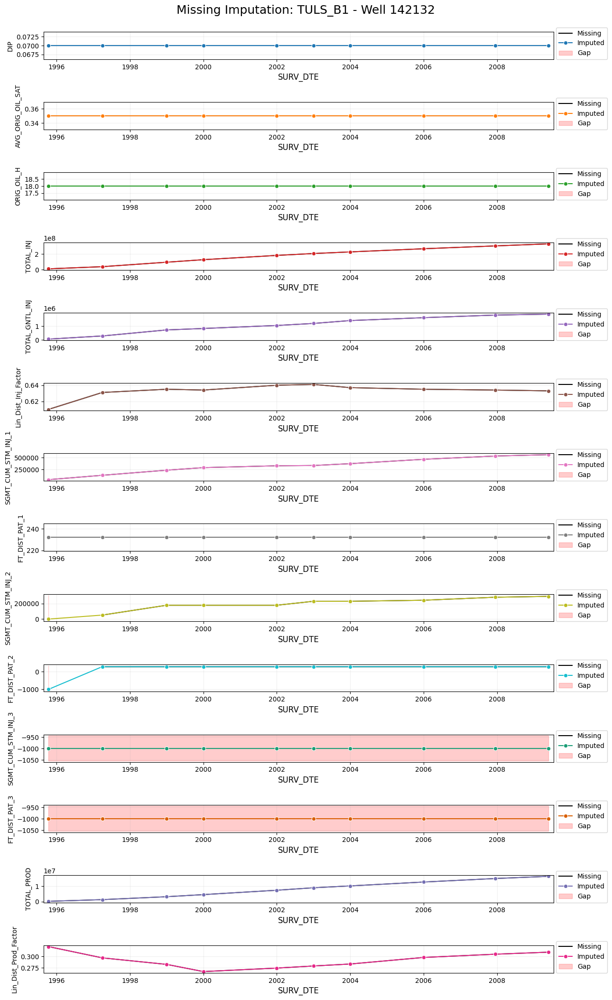

In [77]:
# plot the imputed features for a well in the B1 sand on the train set
imputation_plot(missing=X_steam_train, 
                imputed=X_steam_imputed_train, 
                nan_mask=nan_mask_train, 
                sand=np.unique(steam.SAND)[0], 
                well_idx=0)

Following imputation, all variables are real values on which any of the ML algorithms can train.

## 4. Feature Engineering

Feature engineering for time series analysis has peculiarities that require a thorough understanding of how to deal with temporally ordered data. It is arguably the most critical aspect of time series modeling which can make or mar the analysis. It encompasses numerical transformations, categorical encodings, and generation of new features from raw data.

### 4.1 Feature Transformation

An important component of feature engineering for time series regression is the transformation of data and distributions to formats compatible with ML algorithms. This includes feature encoding and non-linear transformation. 

In [78]:
from sklearn.compose import ColumnTransformer
from sklearn.compose import make_column_selector
from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import OneHotEncoder
from distfit import distfit

In [79]:
# create a function for transforming feature columns
def column_transform(X_train, X_valid, X_test, num_var, cat_var, which):
    # X_train: training features
    # X_valid: validating features
    # X_test: testing features
    # num_var: list of names of numerical variables
    # cat_var: list of names of categorical variables
    # which: which transformation to perform (one of 'transformation' or 'encoding')
    
    # quantile transformation
    if which == 'transformation':
        column_trans = ColumnTransformer(transformers=[('Quantiles', 
                                                        QuantileTransformer(n_quantiles=len(X_train), 
                                                                            output_distribution='normal', 
                                                                            subsample=len(X_train), 
                                                                            random_state=1234), 
                                                        make_column_selector(dtype_include='number'))], 
                                         remainder='drop', 
                                         verbose_feature_names_out=False)
    
    # categorical encoding
    elif which == 'encoding':
        column_trans = ColumnTransformer(transformers=[('Categories', 
                                                        OneHotEncoder(categories=[np.unique(X_train[col]) for col in cat_var]), 
                                                        cat_var)], 
                                         remainder='drop', 
                                         sparse_threshold=0, 
                                         verbose_feature_names_out=False)
    
    X_train_transed = column_trans.fit_transform(X_train)
    X_valid_transed = column_trans.transform(X_valid)
    X_test_transed = column_trans.transform(X_test)
    
    orig_data = [X_train, X_valid, X_test]
    trans_data = [X_train_transed, X_valid_transed, X_test_transed]
    
    trans_names = column_trans.get_feature_names_out()
    
    for i in range(len(orig_data)):
        trans_data[i] = pd.DataFrame(trans_data[i], 
                                     columns=trans_names, 
                                     index=orig_data[i].index)
        
    return trans_data

#### 4.1.1 Quantile Transformation

Most machine learning algorithms assume a standard distribution (i.e. normal or uniform) of input variables which is often not the case with real data. To satisfy this condition, the variables are subjected to non-linear transformation methods which simply apply a mathematical operation to transform the variables to a common scale. However, non-linear transformation may distort the linear relationship or distance between variables measured at similar scales. The Quantile Transform is one of such non-linear and monotonic (rank preserving) techniques.

In [80]:
# check for numerical variables (i.e variables with number type)
num_var = list(X_steam_imputed.select_dtypes('number'))
print(f'Numerical Variables: {num_var}')

Numerical Variables: ['DIP', 'AVG_ORIG_OIL_SAT', 'ORIG_OIL_H', 'TOTAL_INJ', 'TOTAL_GNTL_INJ', 'Lin_Dist_Inj_Factor', 'SGMT_CUM_STM_INJ_1', 'FT_DIST_PAT_1', 'SGMT_CUM_STM_INJ_2', 'FT_DIST_PAT_2', 'SGMT_CUM_STM_INJ_3', 'FT_DIST_PAT_3', 'TOTAL_PROD', 'Lin_Dist_Prod_Factor']


All numeric features will be quantiled transformed to normal distributions to equalize their scales and standardize their distributions.

##### 4.1.1.1 Best-matching Distribution

Before transforming feature columns, the numeric variables will be subjected to a normality test. This is an examination of the variables to see whether they conform to a normal distribution of values. The normality test can be achieved through a goodness-of-fit measure. First, probability density fitting will be used to identify the class of univariate distribution of each feature. The probabilty distribution of each feature will then be compared to several theoretical distributions. The objective is to minimize the Residual Sum of Squares (RSS) between the probabilty distribution and the theoretical distribution. Whichever theoretical distribution yields the least RSS is considered the best fit to the data.

In [81]:
# create a function for performing automated goodness-of-fit (GOF) test
def gof_test(data):
    # data: dataframe for the goodness-of-fit test
    
    # column-wise GOF test
    dist = [distfit() for i in range(len(data.columns))]
    bm_dist = [i for i in range(len(data.columns))]

    start_time = time.time()

    for i, feat in enumerate(data.columns):
        bm_dist[i] = dist[i].fit_transform(data[feat])

    end_time = time.time()
    print(f'Training time: {end_time - start_time} seconds')
    
    return dist, bm_dist

In [82]:
# create a function for generating a dataframe of the summary of best matching distributions
def bm_dist_table(bm_dist, data):
    # bm_dist: best matching distribution results
    # data: data containing feature columns
    
    bm_df = pd.DataFrame(index=data.columns, columns=['name', 'loc', 'scale'])
    for i, feat in enumerate(data):
        bm_df.loc[feat]['name'] = bm_dist[i]['model']['name']
        bm_df.loc[feat]['loc'] = bm_dist[i]['model']['params'][-2]
        bm_df.loc[feat]['scale'] = bm_dist[i]['model']['params'][-1]
    
    return bm_df

In [83]:
# create a function for plotting the probability distribution fits
def dist_plot(dist_fit, data):
    # dist_fit: probability distribution fits
    # data: data containing feature columns
    
    fig, axs = plt.subplots(nrows=4, ncols=4, figsize=(13, 13))

    for (i, ax), feat in zip(enumerate(fig.axes), data.columns):
        dist_fit[i].plot(fig=fig, ax=ax, verbose=0)
        ax.set_xlabel(ax.get_xlabel(), size=12)
        ax.set_ylabel(ax.get_ylabel(), size=12)
        ax.set_title(f'{feat}', size=14)
        ax.legend(fontsize='small', loc='upper right')
        for j in range(len(data.columns), len(fig.axes)):
            fig.axes[j].set_axis_off()
    plt.suptitle(y=1.005, t='Best Matching Distributions', size=18)
    plt.tight_layout()

In [84]:
# perform automated goodness-of-fit (GOF) test on the train and validation sets
dist, bm_dist = gof_test(data=X_steam_imputed[num_var])

[distfit] >fit..
[distfit] >transform..
[distfit] >[norm      ] [0.00 sec] [RSS: 1026.0554152] [loc=0.057 scale=0.027]
[distfit] >[expon     ] [0.0 sec] [RSS: 1817.1542457] [loc=0.010 scale=0.047]
[distfit] >[pareto    ] [0.01 sec] [RSS: 1817.1542551] [loc=-4194303.990 scale=4194304.000]
[distfit] >[dweibull  ] [0.10 sec] [RSS: 1067.4541217] [loc=0.055 scale=0.021]
[distfit] >[t         ] [0.71 sec] [RSS: 991.4308583] [loc=0.055 scale=0.021]
[distfit] >[genextreme] [0.36 sec] [RSS: 984.0489676] [loc=0.045 scale=0.021]
[distfit] >[gamma     ] [0.11 sec] [RSS: 985.2756924] [loc=-0.003 scale=0.011]
[distfit] >[lognorm   ] [0.17 sec] [RSS: 981.2656880] [loc=-0.023 scale=0.077]
[distfit] >[beta      ] [0.29 sec] [RSS: 984.8685882] [loc=-0.002 scale=1.603]
[distfit] >[uniform   ] [0.00 sec] [RSS: 2373.5347046] [loc=0.010 scale=0.330]
[distfit] >[loggamma  ] [0.17 sec] [RSS: 1037.2462962] [loc=-9.936 scale=1.295]
[distfit] >Compute confidence interval [parametric]
[distfit] >fit..
[distfit] >

[distfit] >[dweibull  ] [0.15 sec] [RSS: 0.0000000] [loc=128389.348 scale=193488.398]
[distfit] >[t         ] [0.19 sec] [RSS: 0.0000000] [loc=0.005 scale=0.020]
[distfit] >[genextreme] [0.82 sec] [RSS: 0.0000000] [loc=-998.922 scale=0.373]
[distfit] >[gamma     ] [0.14 sec] [RSS: 0.0000000] [loc=-999.000 scale=404965.932]
[distfit] >[lognorm   ] [0.37 sec] [RSS: 0.0000000] [loc=-999.000 scale=140.806]
[distfit] >[beta      ] [0.34 sec] [RSS: 0.0000000] [loc=-999.000 scale=52537883.315]
[distfit] >[uniform   ] [0.01 sec] [RSS: 0.0000000] [loc=-999.000 scale=4962913.000]
[distfit] >[loggamma  ] [0.14 sec] [RSS: 0.0000000] [loc=-80913599.207 scale=10879631.770]
[distfit] >Compute confidence interval [parametric]
[distfit] >fit..
[distfit] >transform..
[distfit] >[norm      ] [0.0 sec] [RSS: 0.0001727] [loc=-81.930 scale=619.775]
[distfit] >[expon     ] [0.01 sec] [RSS: 0.0001707] [loc=-999.000 scale=917.070]
[distfit] >[pareto    ] [0.00 sec] [RSS: 0.0001435] [loc=-1121.759 scale=122.759

In [85]:
# check the best matching distribution
bm_dist_table(bm_dist=bm_dist, data=X_steam_imputed[num_var])

,name,loc,scale
DIP,lognorm,-0.023311,0.076515
AVG_ORIG_OIL_SAT,beta,-0.001281,0.828656
ORIG_OIL_H,beta,0.010881,57.174953
TOTAL_INJ,beta,-0.0,1624627262.365388
TOTAL_GNTL_INJ,expon,0.0,1726470.102199
Lin_Dist_Inj_Factor,loggamma,0.871174,0.010151
SGMT_CUM_STM_INJ_1,beta,-999.0,26075633.529492
FT_DIST_PAT_1,dweibull,-397.394207,607.25964
SGMT_CUM_STM_INJ_2,beta,-999.0,52537883.314702
FT_DIST_PAT_2,dweibull,-318.687911,684.330997


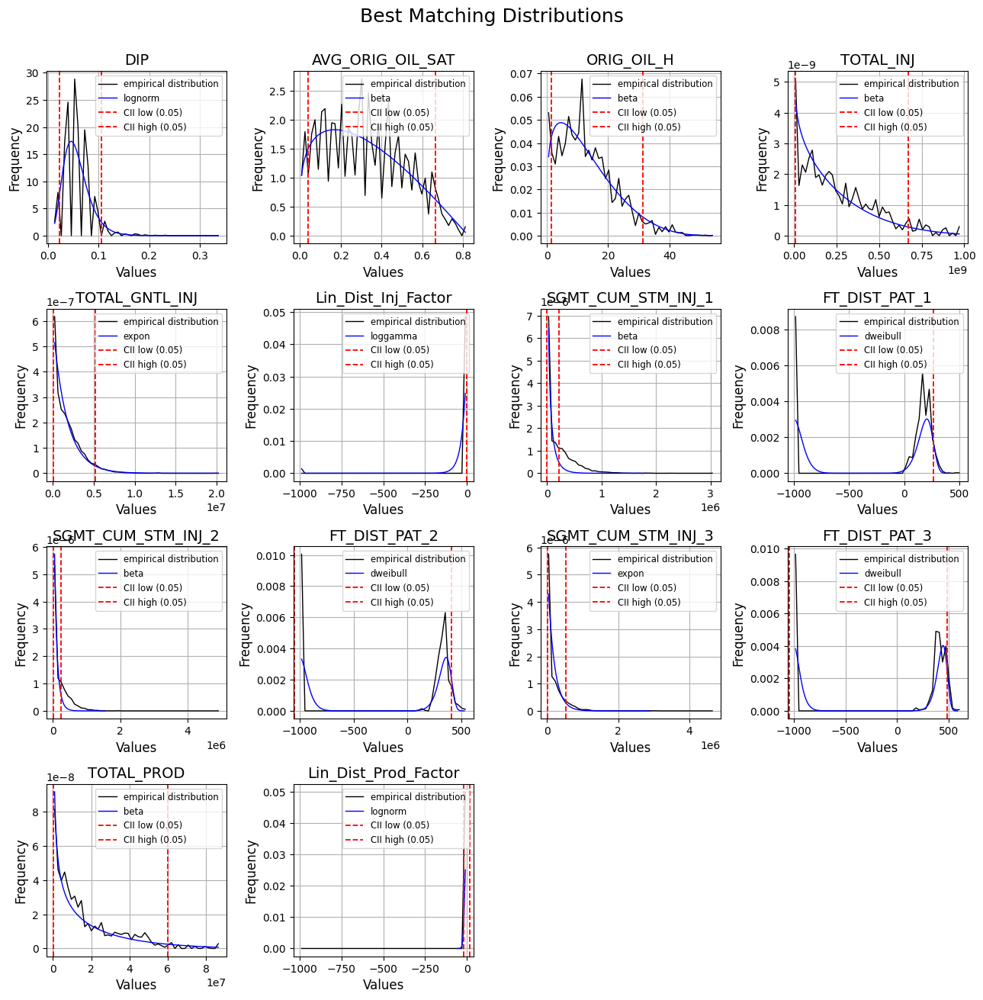

In [86]:
# plot the probability distribution fits
dist_plot(dist_fit=dist, data=X_steam_imputed[num_var])

Examining the plot of the empirical distributions and their best theoretical fits, it is obvious that all the variables have a non-standard distribution. Instead, the distributions are strongly skewed.  

##### 4.1.1.2 Gaussian Mapping

The non-standard distrbutions will be transformed to take the shape of a gaussian bell (with zero mean and 1 standard deviation) using their quantiles. The quantile tranformation uses the cummulative distribution function (CDF) of a feature to first map the probability distribution to a uniform distribution and then applies the quantile function (inverse of the CDF) to transform the uniform distribution to another desired distribution. In this case a normal distribution is required.

In [87]:
# perform quantile transformation of numerical variables on the train, validation and test sets
X_steam_transed_train, X_steam_transed_valid, X_steam_transed_test = column_transform(X_train=X_steam_imputed_train, 
                                                                                      X_valid=X_steam_imputed_valid, 
                                                                                      X_test=X_steam_imputed_test, 
                                                                                      num_var=num_var, 
                                                                                      cat_var=None, 
                                                                                      which='transformation')

In [88]:
X_steam_transed_train.head()

,DIP,AVG_ORIG_OIL_SAT,ORIG_OIL_H,TOTAL_INJ,TOTAL_GNTL_INJ,Lin_Dist_Inj_Factor,SGMT_CUM_STM_INJ_1,FT_DIST_PAT_1,SGMT_CUM_STM_INJ_2,FT_DIST_PAT_2,SGMT_CUM_STM_INJ_3,FT_DIST_PAT_3,TOTAL_PROD,Lin_Dist_Prod_Factor
SURV_DTE,,,,,,,,,,,,,,
2012-10-25,-0.142571,2.052737,0.927771,-0.328497,1.016200,-0.653419,-5.199338,-5.199338,1.383700,1.154300,2.147767,0.925826,-0.056070,0.455857
2016-09-02,-0.142571,2.052737,0.927771,-0.082346,1.395090,-0.458466,-5.199338,-5.199338,2.173896,1.154300,2.193511,0.925826,0.532674,0.093234
1990-01-01,0.259587,2.052737,0.321065,-5.199338,-5.199338,-0.977283,-0.488598,-5.199338,-0.372908,-5.199338,-0.336330,0.925826,-5.199338,0.455857
2012-10-25,0.259587,2.052737,0.321065,-0.328497,-0.475603,-0.977283,-5.199338,-5.199338,-5.199338,-5.199338,0.631200,0.925826,-0.056070,0.455857
2012-10-25,0.982249,0.843219,1.993963,-0.328497,0.820986,-0.390212,0.666003,-0.192441,0.771833,1.154300,1.087227,0.925826,-0.056070,0.455857


In [89]:
X_steam_transed_train.shape

(6934, 14)

In [90]:
# merge the train and validation sets
X_steam_transed = merge(data=[X_steam_transed_train, X_steam_transed_valid], axis=0)
X_steam_transed.head()

,DIP,AVG_ORIG_OIL_SAT,ORIG_OIL_H,TOTAL_INJ,TOTAL_GNTL_INJ,Lin_Dist_Inj_Factor,SGMT_CUM_STM_INJ_1,FT_DIST_PAT_1,SGMT_CUM_STM_INJ_2,FT_DIST_PAT_2,SGMT_CUM_STM_INJ_3,FT_DIST_PAT_3,TOTAL_PROD,Lin_Dist_Prod_Factor
SURV_DTE,,,,,,,,,,,,,,
2012-10-25,-0.142571,2.052737,0.927771,-0.328497,1.016200,-0.653419,-5.199338,-5.199338,1.383700,1.154300,2.147767,0.925826,-0.056070,0.455857
2016-09-02,-0.142571,2.052737,0.927771,-0.082346,1.395090,-0.458466,-5.199338,-5.199338,2.173896,1.154300,2.193511,0.925826,0.532674,0.093234
1990-01-01,0.259587,2.052737,0.321065,-5.199338,-5.199338,-0.977283,-0.488598,-5.199338,-0.372908,-5.199338,-0.336330,0.925826,-5.199338,0.455857
2012-10-25,0.259587,2.052737,0.321065,-0.328497,-0.475603,-0.977283,-5.199338,-5.199338,-5.199338,-5.199338,0.631200,0.925826,-0.056070,0.455857
2016-09-02,0.259587,2.052737,0.321065,-0.082346,-0.186391,-0.917808,-5.199338,-5.199338,-5.199338,-5.199338,1.112535,0.925826,0.532674,0.093234


In [91]:
# merge the features and target
steam_transed = merge(data=[X_steam_transed, y_steam], axis=1)
steam_transed.head()

,DIP,AVG_ORIG_OIL_SAT,ORIG_OIL_H,TOTAL_INJ,TOTAL_GNTL_INJ,Lin_Dist_Inj_Factor,SGMT_CUM_STM_INJ_1,FT_DIST_PAT_1,SGMT_CUM_STM_INJ_2,FT_DIST_PAT_2,SGMT_CUM_STM_INJ_3,FT_DIST_PAT_3,TOTAL_PROD,Lin_Dist_Prod_Factor,PCT_DESAT_TO_ORIG
SURV_DTE,,,,,,,,,,,,,,,
2012-10-25,-0.142571,2.052737,0.927771,-0.328497,1.016200,-0.653419,-5.199338,-5.199338,1.383700,1.154300,2.147767,0.925826,-0.056070,0.455857,1.00
2016-09-02,-0.142571,2.052737,0.927771,-0.082346,1.395090,-0.458466,-5.199338,-5.199338,2.173896,1.154300,2.193511,0.925826,0.532674,0.093234,1.00
1990-01-01,0.259587,2.052737,0.321065,-5.199338,-5.199338,-0.977283,-0.488598,-5.199338,-0.372908,-5.199338,-0.336330,0.925826,-5.199338,0.455857,0.00
2012-10-25,0.259587,2.052737,0.321065,-0.328497,-0.475603,-0.977283,-5.199338,-5.199338,-5.199338,-5.199338,0.631200,0.925826,-0.056070,0.455857,0.79
2016-09-02,0.259587,2.052737,0.321065,-0.082346,-0.186391,-0.917808,-5.199338,-5.199338,-5.199338,-5.199338,1.112535,0.925826,0.532674,0.093234,1.00


In [92]:
# perform automated goodness-of-fit (GOF) test on the quantile transformed train and validation sets
dist_q, bm_dist_q = gof_test(data=X_steam_transed)

[distfit] >fit..
[distfit] >transform..
[distfit] >[norm      ] [0.01 sec] [RSS: 1.4613393] [loc=-0.040 scale=1.139]
[distfit] >[expon     ] [0.0 sec] [RSS: 2.6088928] [loc=-5.199 scale=5.159]
[distfit] >[pareto    ] [0.00 sec] [RSS: 2.6088928] [loc=-268435461.199 scale=268435456.000]
[distfit] >[dweibull  ] [0.09 sec] [RSS: 1.3550570] [loc=0.045 scale=0.889]
[distfit] >[t         ] [0.28 sec] [RSS: 1.3956871] [loc=0.011 scale=0.841]
[distfit] >[genextreme] [0.29 sec] [RSS: 1.5806806] [loc=-0.495 scale=1.344]
[distfit] >[gamma     ] [0.19 sec] [RSS: 1.4901118] [loc=-20.276 scale=0.072]
[distfit] >[lognorm   ] [0.40 sec] [RSS: 1.4607636] [loc=-601.876 scale=601.833]
[distfit] >[beta      ] [0.46 sec] [RSS: 1.4552833] [loc=-226.531 scale=230.782]
[distfit] >[uniform   ] [0.0 sec] [RSS: 2.3916198] [loc=-5.199 scale=10.399]
[distfit] >[loggamma  ] [0.05 sec] [RSS: 1.4414223] [loc=-2.354 scale=1.982]
[distfit] >Compute confidence interval [parametric]
[distfit] >fit..
[distfit] >transform..

[distfit] >[lognorm   ] [0.41 sec] [RSS: 2.2596569] [loc=-5.199 scale=0.000]
[distfit] >[beta      ] [0.46 sec] [RSS: 2.6537554] [loc=-5.199 scale=10.399]
[distfit] >[uniform   ] [0.00 sec] [RSS: 2.5577710] [loc=-5.199 scale=10.399]
[distfit] >[loggamma  ] [0.05 sec] [RSS: 2.2505191] [loc=1.600 scale=0.808]
[distfit] >Compute confidence interval [parametric]
[distfit] >fit..
[distfit] >transform..
[distfit] >[norm      ] [0.00 sec] [RSS: 2.8234898] [loc=-1.257 scale=2.716]
[distfit] >[expon     ] [0.00 sec] [RSS: 2.7343233] [loc=-5.199 scale=3.943]
[distfit] >[pareto    ] [0.00 sec] [RSS: 1.9917592] [loc=-5.729 scale=0.529]
[distfit] >[dweibull  ] [0.13 sec] [RSS: 1.8477995] [loc=-2.249 scale=3.066]
[distfit] >[t         ] [0.22 sec] [RSS: 2.3267392] [loc=0.311 scale=0.737]
[distfit] >[genextreme] [0.33 sec] [RSS: 2.7699000] [loc=-2.110 scale=2.842]
[distfit] >[gamma     ] [0.20 sec] [RSS: 2.8369180] [loc=-40.393 scale=0.202]
[distfit] >[lognorm   ] [0.28 sec] [RSS: 2.1284964] [loc=-5.

In [93]:
# check the best matching distribution
bm_dist_table(bm_dist=bm_dist_q, data=X_steam_transed)

,name,loc,scale
DIP,dweibull,0.044771,0.888546
AVG_ORIG_OIL_SAT,lognorm,-307.151757,307.148216
ORIG_OIL_H,loggamma,-124.940394,20.68057
TOTAL_INJ,t,0.149236,0.783289
TOTAL_GNTL_INJ,t,0.145507,0.757622
Lin_Dist_Inj_Factor,t,0.025222,0.826749
SGMT_CUM_STM_INJ_1,t,0.266112,0.742584
FT_DIST_PAT_1,dweibull,-2.294936,3.023645
SGMT_CUM_STM_INJ_2,dweibull,-2.250453,3.071637
FT_DIST_PAT_2,dweibull,-2.248642,3.065605


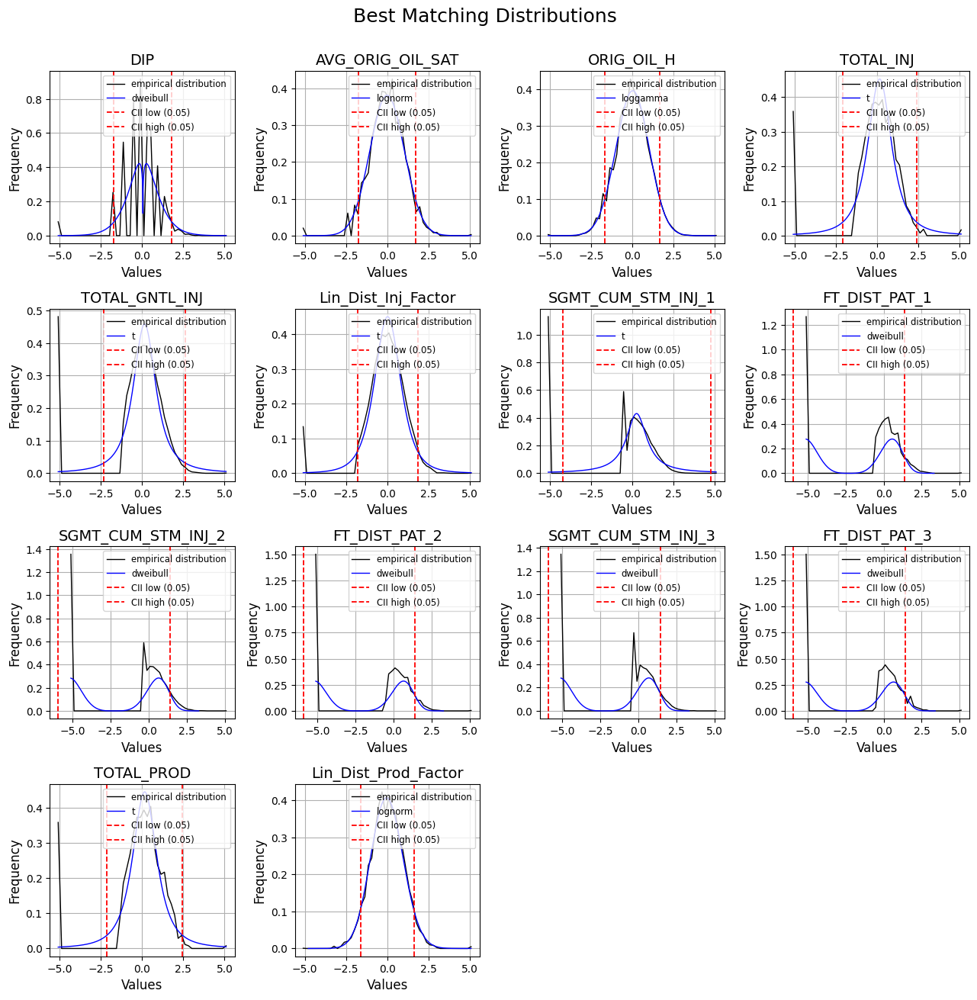

In [94]:
# plot the probability distribution fits
dist_plot(dist_fit=dist_q, data=X_steam_transed)

The transformed probability distributions now closely resemble gaussian distributions. The negative imputation value is responsible for the high frequency observed on the empirical distribution plots at the negative tail of the segment injection volumes and their distance factors. For the total injection and production volume variables, the high frequency at the negative tail of the distribution is due to the high occurence of zero or very low volume values.

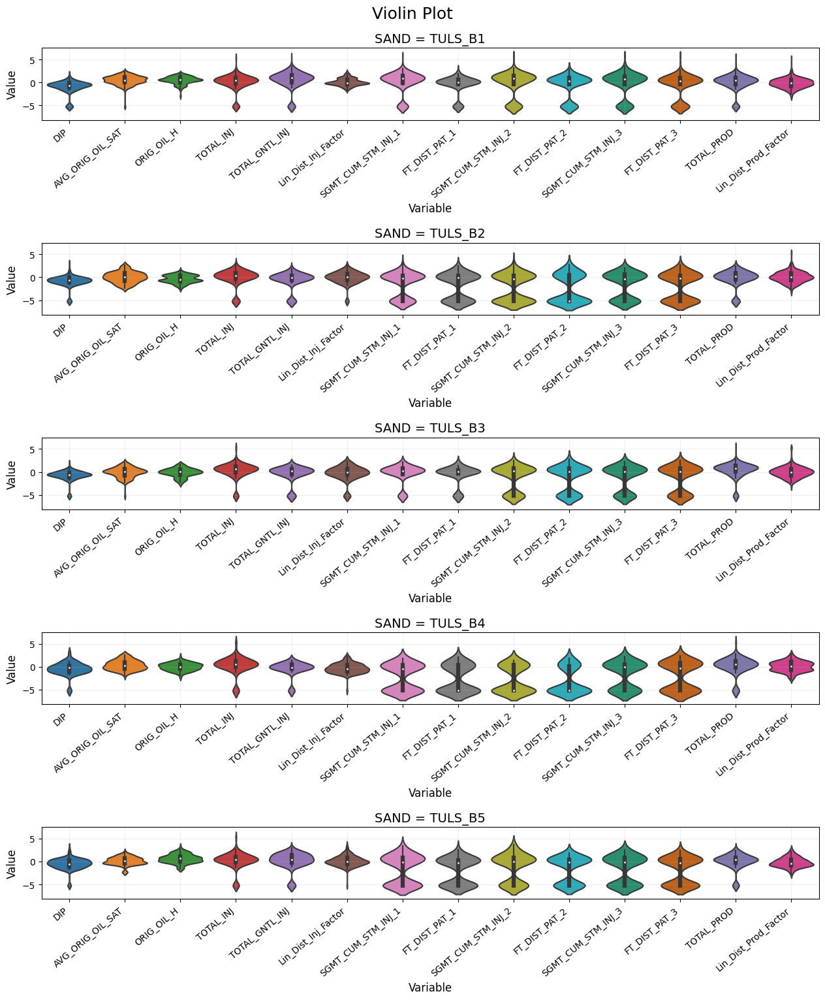

In [95]:
# plot the violin plot of the B sands on the train and validation sets
violin_plot(data=X_steam_transed, 
            categories=X_steam_imputed.SAND, 
            sands=np.unique(steam.SAND)[:5])

The scale imbalance has been resolved by quantile transformation. All features now share a common range. The segment injection volumes and their distance factors which had the highest count of missing values now show a strongly bimodal distribution as a result of the imputation with a negative value much distant from the true value range.

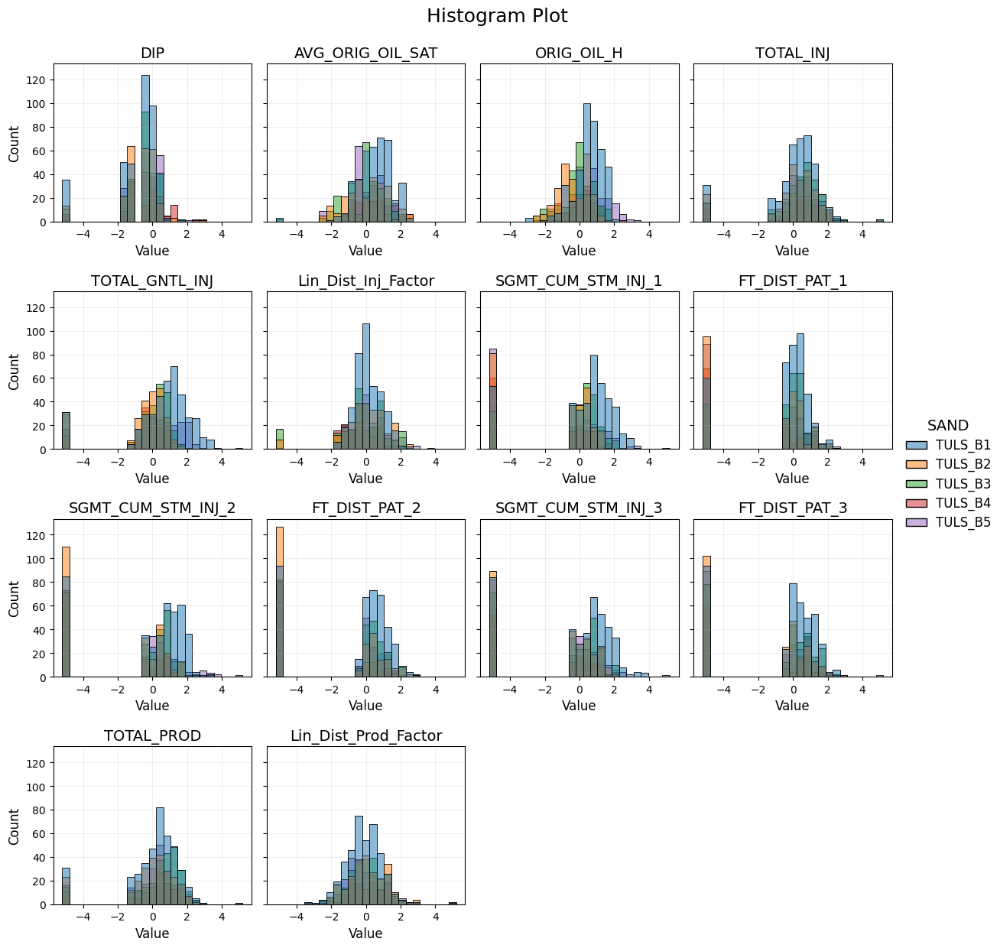

In [96]:
# plot the histogram plot of the B sands on the train and validation sets
histogram_plot(data=X_steam_transed, 
               categories=X_steam_imputed.SAND, 
               sands=np.unique(steam.SAND)[:5], 
               scale='linear')

Fixing the histograms at the same range for all variables no longer obscures their frequency distribution, providing further indication that the scale imbalance has been resolved. The unique sands have overlapping distributions on all variables. The effect of imputation with a unique negative value can also be observed on the frequency distribution of the segment injection volumes and their distance factors. The transformed value appears on the histograms as the high frequency isolated negative extremum.

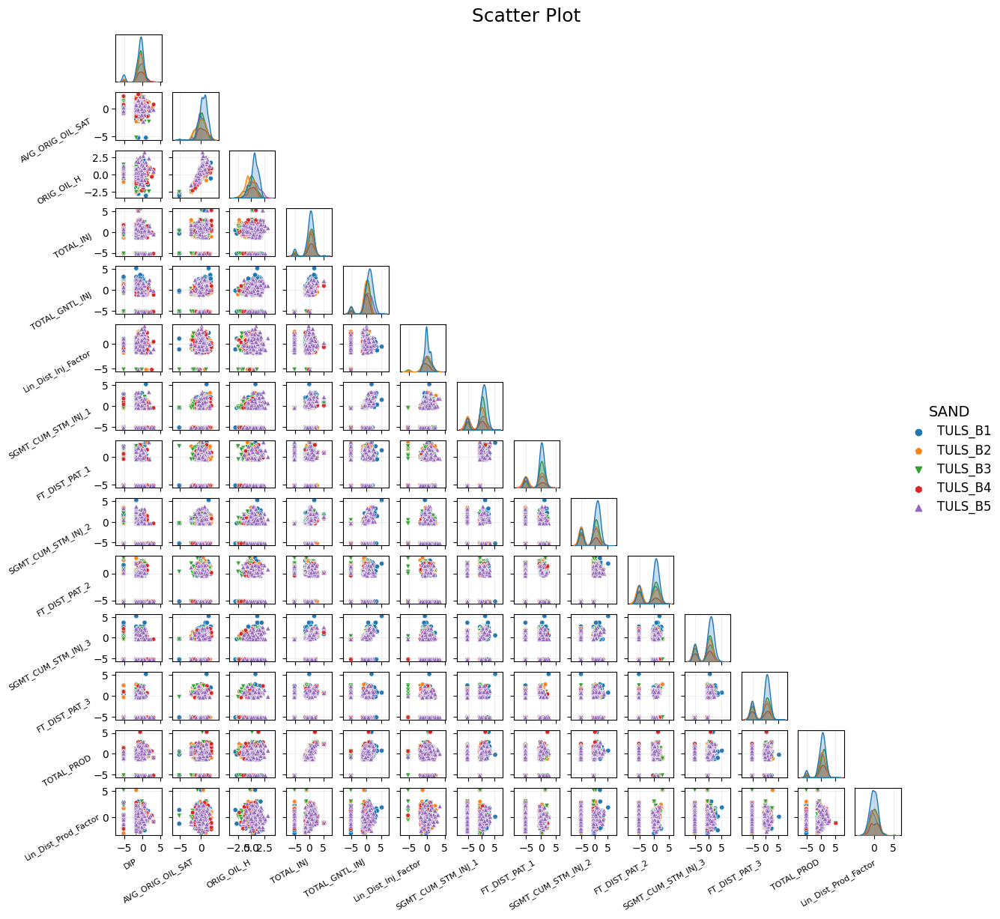

In [97]:
# plot the scatter plot of the B sands on the train and validation sets
scatter_plot(data=X_steam_transed, 
             categories=X_steam_imputed.SAND, 
             sands=np.unique(steam.SAND)[:5])

Once again the transformed imputed value forms a discernable cluster space seperated from the true values on the scatter plots.

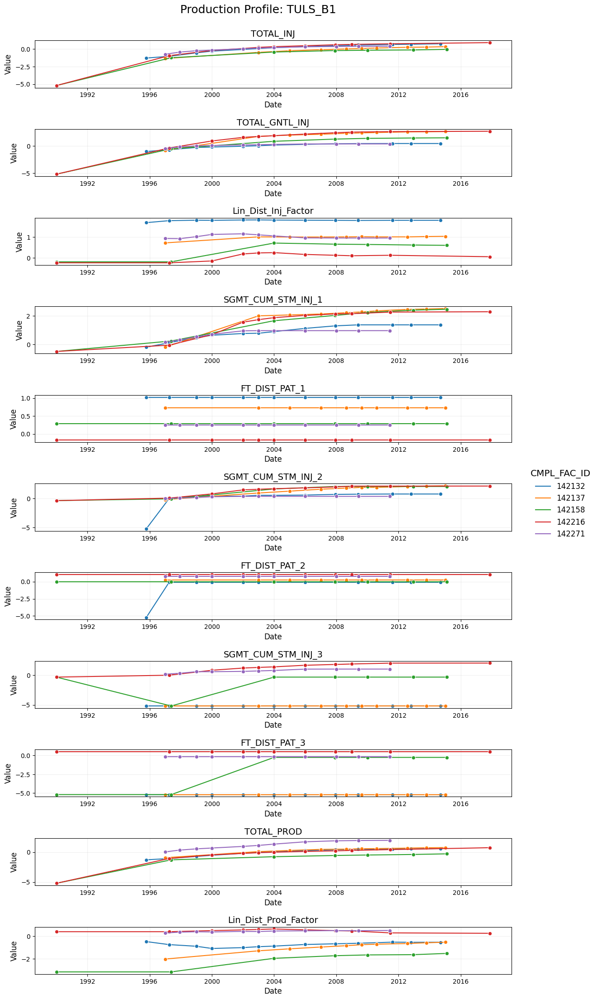

In [98]:
# plot the production profile of the first five wells in the B1 sand on the train and validation sets
production_plot(data=pd.concat([steam.CMPL_FAC_ID, steam.SAND, X_steam_transed], axis=1), 
                sand=np.unique(steam.SAND)[0], 
                n_wells=5)

#### 4.1.2 Categorical Encoding

Feature encoding is the process of converting discrete variables (categorical features) in string (or integer) format to the numeric representation required by most ML algorithms. A categorical variable is ordinal if there is a natural or logical order between categories. Where there is no rank order betweeen categories, the variable is said to be nominal. Ordinal variables must be encoded in a manner that preserves the rank order, for example using uniformly increasing sequential numbers between 0 and n_categories-1. The sequence should be positive. Ordinally encoding a nominal variable creates a false impression of ordinality. Instead, the nominal variable may be one-hot (one-of-k or dummy) encoded where each each category in a single variable is exploded into a binary array in which 1 represents category presence and 0 represents category absence. The feature encoding is then a 2D matrix with one column per category.

In [99]:
# check for categorical variables (i.e variables with object type)
cat_var = list(X_steam_imputed.select_dtypes('object'))
print(f'Categorical Variables: {cat_var}')

Categorical Variables: ['CMPL_FAC_ID', 'SAND']


The categorical variables present on the dataset provided are the well numbers (CMPL_FAC_ID) and sand names (SAND). Although in oil and gas production, nearby wells and proximal sands usually follow ordered nomenclature, the geological heterogeneities across wells and along sand layers disrupt the ordered relationship of properties. Hence, both variables will be treated as nominal and one-hot encoded. 

##### 4.1.2.1 Set Theory

A notable constraint with using catgorical features for ML analysis is the possibilty that the categories used in the training stage may differ from those in the testing or deployment stage. Therefore, it is neccesary to evaluate the subsets of the data used in the analysis to confirm the co-occurence of the set of categories identified on categorical variables on all datasets. This is particularly critical in the case of one-hot encoded features, considering that the size of the 2D matrix generated from the catgories on the training set must conform to those on the validation or test set. The presence of fewer or more categories upon transforming the validation or test sets will break the model (i.e. introduce fewer or more feature columns than expected). Ordinally encoded features provide more flexibility with handling unknown categories introduced in the validation or test set. These may simply be encoded as a unique value different from any of the values used for the categories while fitting.

In [100]:
# obtain the intersection of the categorical variables on the train, validation and test sets
intersect = dict()
for var in cat_var:
    intersect[var] = set(X_steam_imputed_train[var]).intersection(X_steam_imputed_valid[var], 
                                                                  X_steam_imputed_test[var])
    print(f'{var}: {intersect[var]}')
    print()

CMPL_FAC_ID: set()

SAND: {'TULS_E5', 'TULS_C3', 'TULS_D3', 'TULS_B5', 'TULS_D1', 'TULS_D4', 'TULS_D2', 'TULS_B2', 'TULS_C2', 'TULS_B3', 'TULS_C1', 'TULS_E3', 'TULS_C4', 'TULS_E1', 'TULS_B4', 'TULS_E4', 'TULS_C5', 'TULS_E2', 'TULS_B1', 'TULS_D5'}



In [101]:
# obtain the union of the categorical variables on the train, validation and test sets
union = dict()
for var in cat_var:
    union[var] = set(X_steam_imputed_train[var]).union(X_steam_imputed_valid[var], 
                                                       X_steam_imputed_test[var])
    print(f'{var}: {union[var]}')
    print()

CMPL_FAC_ID: {142342, 999433, 999442, 999445, 183320, 173087, 983072, 999457, 996479, 983075, 142371, 142372, 999463, 142377, 142378, 142379, 142380, 999469, 142381, 989231, 999472, 142382, 989234, 142383, 142384, 999478, 999481, 989243, 999484, 989246, 999487, 982079, 989249, 999490, 992321, 982082, 999493, 984130, 142404, 142405, 982085, 992327, 982088, 984136, 165965, 142410, 142411, 982091, 984139, 142414, 982094, 984142, 982097, 984151, 989272, 989275, 989278, 989281, 995427, 995430, 164968, 165993, 995433, 164971, 995439, 991346, 995442, 164983, 991352, 994424, 991355, 995451, 994427, 991358, 995454, 164989, 994430, 994433, 142466, 995460, 990341, 996485, 991367, 995463, 990344, 995466, 994442, 990347, 994448, 996497, 991379, 994454, 990359, 991385, 991388, 994463, 142496, 142497, 994466, 991397, 142501, 142502, 991400, 994469, 994472, 998576, 142529, 142530, 142532, 142533, 171209, 142541, 142543, 985297, 985300, 984276, 142549, 985303, 985306, 984282, 985309, 984285, 142559, 98

In [102]:
# check if all members of the invidual sets are contained in the intersection 
# (i.e if the intersection is equivalent to the union)
for var in cat_var:
    print(f'{var}: {intersect[var]==union[var]}')

CMPL_FAC_ID: False
SAND: True


The categories present on the data subsets are not the same for the CMPL_FAC_ID variable but are common for the SAND variable. As mentioned above, both variables are nominal and will require one-hot encoding. But one-hot encoding the CMPL_FAC_ID variable will lead to the inconsistency discussed above. Hence, only the SAND variable having consitent members across the train, validation and test sets will be used as a feature in the learning task.

In [103]:
# select the categorical variables which share members across the train, validation and test sets
cat_var_sel = [cat_var[np.where((np.array(list(intersect.values())) == np.array(list(union.values())))==True)[0][0]]]
cat_var_sel

['SAND']

##### 4.1.2.2 One Hot Encoding

Scikit-learn provides ready-to-use functions for feature encoding. When ordinally encoding, the OrdinalEncoder class should be used for features variables (X) and the LabelEncoder class for target variables (y). Similarly, when one-hot encoding, the OneHotEncoder class should be used for X and LabelBinarizer class for y. However, alongside missing data handling, higher-end tree ensembles boast unique catgorical data handling capability. Histogram GBM and Light GBM reccomend ordinal encoding the categorical features in the preprocessing stage and then specifying the features as a model parameter. Although the features are ordinally encoded, internally they are not treated as ordinal quantities. Extreme GBM has native support for internal one-hot encoding, thereby eliminating the preprocessing step. The only requirement is that categorical features are pre-specified as categorical data type on the feature dataframe and categorical handling is enabled as a model paramater. Categorical GBM also supports internal one-hot encoding or alternatively is capable of tranforming categorical variables to numerical format by using various statistics on combinations of categorical features and combinations of categorical and numerical features. The one-hot encoding requires specifying the maximum number of unique values of categorical features as a model parameter.

In [104]:
# perform categorical encoding of categorical variables on the train, validation and test sets
X_steam_encoded_train, X_steam_encoded_valid, X_steam_encoded_test = column_transform(X_train=X_steam_imputed_train, 
                                                                                      X_valid=X_steam_imputed_valid, 
                                                                                      X_test=X_steam_imputed_test, 
                                                                                      num_var=None, 
                                                                                      cat_var=cat_var_sel, 
                                                                                      which='encoding')

In [105]:
X_steam_encoded_train.head()

,SAND_TULS_B1,SAND_TULS_B2,SAND_TULS_B3,SAND_TULS_B4,SAND_TULS_B5,SAND_TULS_C1,SAND_TULS_C2,SAND_TULS_C3,SAND_TULS_C4,SAND_TULS_C5,SAND_TULS_D1,SAND_TULS_D2,SAND_TULS_D3,SAND_TULS_D4,SAND_TULS_D5,SAND_TULS_E1,SAND_TULS_E2,SAND_TULS_E3,SAND_TULS_E4,SAND_TULS_E5
SURV_DTE,,,,,,,,,,,,,,,,,,,,
2012-10-25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2016-09-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1990-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-10-25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-10-25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [106]:
X_steam_encoded_train.shape

(6934, 20)

In [107]:
# merge the train and validation sets
X_steam_encoded = merge(data=[X_steam_encoded_train, X_steam_encoded_valid], axis=0)
X_steam_encoded.head()

,SAND_TULS_B1,SAND_TULS_B2,SAND_TULS_B3,SAND_TULS_B4,SAND_TULS_B5,SAND_TULS_C1,SAND_TULS_C2,SAND_TULS_C3,SAND_TULS_C4,SAND_TULS_C5,SAND_TULS_D1,SAND_TULS_D2,SAND_TULS_D3,SAND_TULS_D4,SAND_TULS_D5,SAND_TULS_E1,SAND_TULS_E2,SAND_TULS_E3,SAND_TULS_E4,SAND_TULS_E5
SURV_DTE,,,,,,,,,,,,,,,,,,,,
2012-10-25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2016-09-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1990-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-10-25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2016-09-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [108]:
# merge the features and target
steam_encoded = merge(data=[X_steam_encoded, y_steam], axis=1)
steam_encoded.head()

,SAND_TULS_B1,SAND_TULS_B2,SAND_TULS_B3,SAND_TULS_B4,SAND_TULS_B5,SAND_TULS_C1,SAND_TULS_C2,SAND_TULS_C3,SAND_TULS_C4,SAND_TULS_C5,...,SAND_TULS_D2,SAND_TULS_D3,SAND_TULS_D4,SAND_TULS_D5,SAND_TULS_E1,SAND_TULS_E2,SAND_TULS_E3,SAND_TULS_E4,SAND_TULS_E5,PCT_DESAT_TO_ORIG
SURV_DTE,,,,,,,,,,,,,,,,,,,,,
2012-10-25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.00
2016-09-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.00
1990-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00
2012-10-25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.79
2016-09-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.00


### 4.2 Covariance Estimation

Estimation of covariance matrices from observational data can used to study the relationship between variables in a multivariate dataset. The covariance matrix is indicative of the shape of scatter plot of variables. It may serve multiple purposes including determining which features are highly correlated so as to exclude uninformative features from the statistical analysis, or otherwise to determine which features are predictive of the target varaible. The covariance matrix is estimated under the assumption that the observations are independent and identically distributed (i.i.d.) which was satisfied by first transforming the features to gaussian space.

Two common methods for estimating the correlation between variables are the Pearson (Product Moment) and Spearman (Rank Order) correlation coefficient (CC). Taking a measure of the Pearsons CC is the equivalent to the normalized covariance matrix. The maximum negative correlation is -1, 0 means no correlation, and the maximum positive correlation is +1. The Pearson CC is a measure of the linear correlation between two variables while the Spearman CC measures the monotonic correlation. For a non-linear function, the Spearman CC is maximum as long as a monotonic relationship exists, meanwhile the Pearson CC of the same function can never be maximum beacause it is non-linear. The Spearman CC is equal to the Pearson CC for a perfectly correlated set of variables (i.e. the fuction is both linear and monotonic). When the Spearman CC is higher than the Pearson CC, the realtionship is monotonic but non-linear.

In [109]:
# create a function for plotting the heat map of a correlation matrix
def correlation_matrix(data, method):
    # data: multivariate dataframe to use for computing correlation coefficients
    # method: method to use for computing correlation coefficients (one of 'pearson' or 'spearman')
    
    if method == 'pearson':
        corr_mat = np.round(data.corr(method='pearson'), decimals=4)
        corr_mask = np.triu(data.corr(method='pearson'), k=1)
    elif method == 'spearman':
        corr_mat = np.round(data.corr(method='spearman'), decimals=4)
        corr_mask = np.triu(data.corr(method='spearman'), k=1)

    fig = plt.figure(figsize=(13, 10))
    ax = sns.heatmap(corr_mat, vmin=-1, vmax=1, 
                     cmap='RdBu_r', center=0, 
                     annot=True, fmt='.4g', 
                     square=False, mask=corr_mask)
    ax.set_xticklabels(ax.get_xticklabels(), rotation='45', ha='right')

    plt.suptitle(y=1.005, t=method.capitalize() + ' Correlation Matrix', size=18)
    plt.tight_layout()

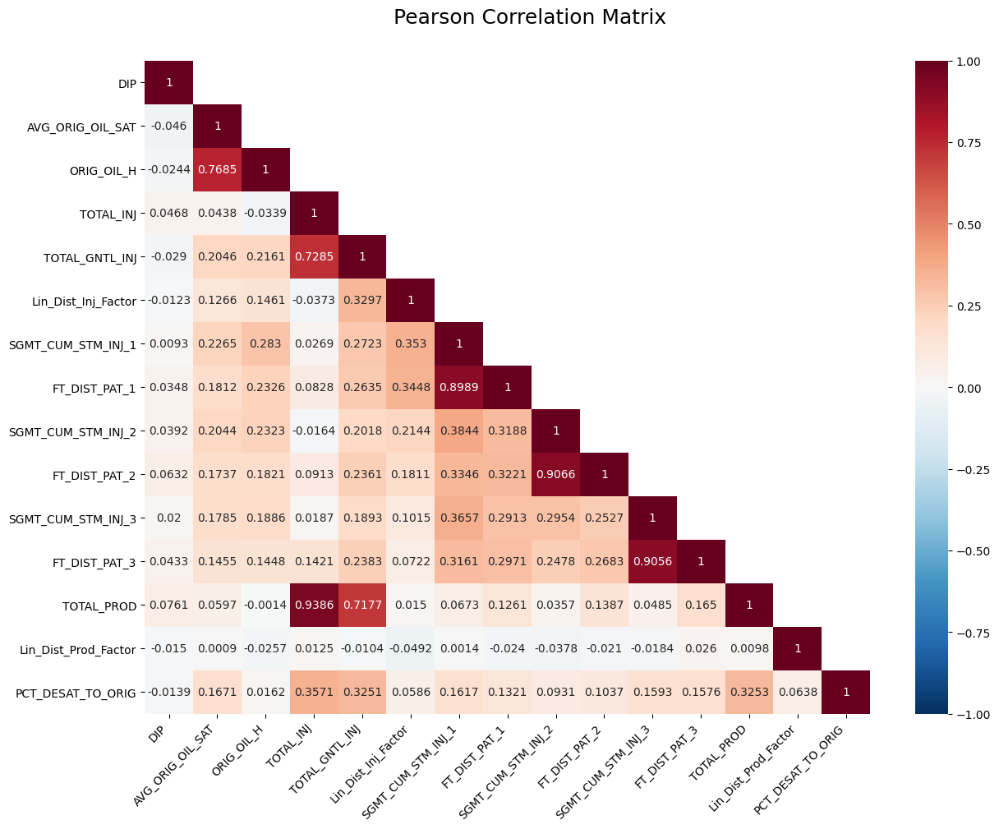

In [110]:
# plot the heat map of the pearson correlation matrix of the quantile transformed features
correlation_matrix(data=steam_transed, method='pearson')

Linearly correlated features (>80%) include the following:
- FT_DIST_PAT_1 and SGMT_CUM_STM_INJ_1
- FT_DIST_PAT_2 and SGMT_CUM_STM_INJ_2
- FT_DIST_PAT_3 and SGMT_CUM_STM_INJ_3
- TOTAL_PROD and TOTAL_INJ

The distance from well to pattern is strongly correlated to the total steam injected from the pattern. Also, the total production and total injection have a strong linear relationship. None of the features have a strong linear relationship with the target.

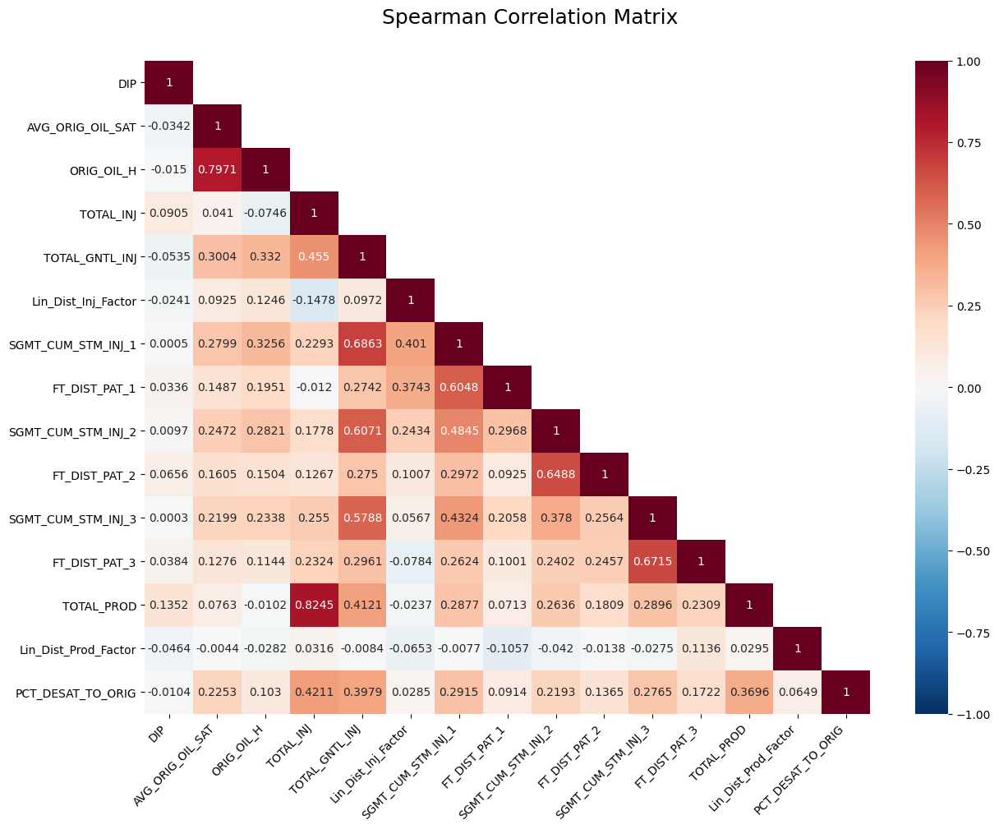

In [111]:
# plot the heat map of the spearman correlation matrix of the quantile transformed features
correlation_matrix(data=steam_transed, method='spearman')

Monotonically correlated features (>80%) include the following:
- TOTAL_PROD and TOTAL_INJ

The pattern distance and volume variables identified to have strong linear relationship have relatively low monotonic relationship indicating that the linear relationship changes direction. Only the total production and total injection variables have both a strong linear and monotonic relationship. None of the features have a strong monotonic relationship with the target.

### 4.3 Feature Generation

Feature genration is the process of obtaining new quantities from raw input data with the potential to enhance the performance of a machine learning model. In a time-varying dataset (i.e time series) the neigboring relationship between samples can be carefully harnessed to obtain the most value from the data. This may be through the generation of temporal features relating to the datetime index of the data, or statistical features by foreward or backward stepping sample points relative to the target or computing statistics over sliding or expanding windows, to mention a few. These techniques will be put to use and evaluated to determine their relevance to the time series learning task. Other features may be derived from the time-frequency analysis of time series data (i.e spectral features).

In [112]:
from sklearn.preprocessing import MinMaxScaler

In [113]:
# create a function for generating features
def column_generate(data, well_sand_idx, window, periods, num_var, date_var, which):
    # data: dataframe from which to generate features
    # well_sand_idx: well and sand indices of the dataframe
    # window: size of window for computing rolling statistics
    # periods: number of periods by which to shift the dataset
    # num_var: list of names of numerical variables
    # date_var: list of names of datetime variables
    # which: which generation to perform (one of 'statistical' or 'datetime')
    
    '**************************************************************'
    # create a function for computing rolling statistics features
    def roll_stats_func(data, well_sand_idx, window, num_var):
        # data: dataframe on which to compute the statistical features
        # well_sand_idx: well and sand indices of the dataframe
        # window: size of window for computing rolling statistics
        # num_var: list of names of numerical variables

        data_merge = pd.concat([well_sand_idx, data], axis=1)
        data_groups = data_merge.groupby(['CMPL_FAC_ID', 'SAND'])

        mean = data_groups.rolling(window=window, center=True, min_periods=1).mean()
        medi = data_groups.rolling(window=window, center=True, min_periods=1).median()
        stdv = data_groups.rolling(window=window, center=True, min_periods=1).std()        
        mini = data_groups.rolling(window=window, center=True, min_periods=1).min()
        maxi = data_groups.rolling(window=window, center=True, min_periods=1).max()
        summ = data_groups.rolling(window=window, center=True, min_periods=1).sum()
        diff = data_groups.rolling(window=window).apply(
            lambda x: 
            (x.reset_index(drop=True).iloc[-1]-x.reset_index(drop=True).iloc[0])/
            (x.reset_index(drop=True).index[-1]-x.reset_index(drop=True).index[0]))

        mean.index = mean.index.droplevel(['CMPL_FAC_ID', 'SAND'])
        medi.index = medi.index.droplevel(['CMPL_FAC_ID', 'SAND'])
        stdv.index = stdv.index.droplevel(['CMPL_FAC_ID', 'SAND'])
        mini.index = mini.index.droplevel(['CMPL_FAC_ID', 'SAND'])
        maxi.index = maxi.index.droplevel(['CMPL_FAC_ID', 'SAND'])
        summ.index = summ.index.droplevel(['CMPL_FAC_ID', 'SAND'])
        diff.index = diff.index.droplevel(['CMPL_FAC_ID', 'SAND'])

        mean.columns = ['{}_mn_roll'.format(i) for i in num_var]
        medi.columns = ['{}_md_roll'.format(i) for i in num_var]
        stdv.columns = ['{}_std_roll'.format(i) for i in num_var]
        mini.columns = ['{}_min_roll'.format(i) for i in num_var]
        maxi.columns = ['{}_max_roll'.format(i) for i in num_var]
        summ.columns = ['{}_sum_roll'.format(i) for i in num_var]
        diff.columns = ['{}_dif_roll'.format(i) for i in num_var]

        stdv = stdv.fillna(0)
        diff = diff.fillna(0)

        stats_feat = pd.concat([mean, medi, stdv, mini, maxi, summ, diff], axis=1)

        return stats_feat
    
    '**************************************************************'
    # create a function for computing expanding statistics features
    def exp_stats_func(data, well_sand_idx, periods, num_var):
        # data: dataframe on which to compute the statistical features
        # well_sand_idx: well and sand indices of the dataframe
        # periods: number of periods by which to shift the dataset
        # num_var: list of names of numerical variables

        data_merge = pd.concat([well_sand_idx, data], axis=1)
        data_groups = data_merge.groupby(['CMPL_FAC_ID', 'SAND'])

        mean = data_groups.expanding(min_periods=1).mean()
        medi = data_groups.expanding(min_periods=1).median()
        stdv = data_groups.expanding(min_periods=1).std()
        mini = data_groups.expanding(min_periods=1).min()
        maxi = data_groups.expanding(min_periods=1).max()
        summ = data_groups.expanding(min_periods=1).sum()
        diff = data_groups.expanding().apply(
            lambda x: 
            (x.reset_index(drop=True).iloc[-1]-x.reset_index(drop=True).iloc[0])/
            (x.reset_index(drop=True).index[-1]-x.reset_index(drop=True).index[0]))
        lagf = data_groups.shift(periods=periods, fill_value=0)
        lagb = data_groups.shift(periods=-1*periods, fill_value=0)
        
        #lagf = lagf.drop(['CMPL_FAC_ID', 'SAND'], axis=1)
        #lagb = lagb.drop(['CMPL_FAC_ID', 'SAND'], axis=1)

        mean.index = mean.index.droplevel(['CMPL_FAC_ID', 'SAND'])
        medi.index = medi.index.droplevel(['CMPL_FAC_ID', 'SAND'])
        stdv.index = stdv.index.droplevel(['CMPL_FAC_ID', 'SAND'])
        mini.index = mini.index.droplevel(['CMPL_FAC_ID', 'SAND'])
        maxi.index = maxi.index.droplevel(['CMPL_FAC_ID', 'SAND'])
        summ.index = summ.index.droplevel(['CMPL_FAC_ID', 'SAND'])
        diff.index = diff.index.droplevel(['CMPL_FAC_ID', 'SAND'])
        lagf.index = data.index
        lagb.index = data.index

        mean.columns = ['{}_mn_exp'.format(i) for i in num_var]
        medi.columns = ['{}_md_exp'.format(i) for i in num_var]
        stdv.columns = ['{}_std_exp'.format(i) for i in num_var]
        mini.columns = ['{}_min_exp'.format(i) for i in num_var]
        maxi.columns = ['{}_max_exp'.format(i) for i in num_var]
        summ.columns = ['{}_sum_exp'.format(i) for i in num_var]
        diff.columns = ['{}_dif_exp'.format(i) for i in num_var]
        lagf.columns = ['{}_lagf_exp'.format(i) for i in num_var]
        lagb.columns = ['{}_lagb_exp'.format(i) for i in num_var]

        stdv = stdv.fillna(0)
        diff = diff.fillna(0)

        stats_feat = pd.concat([mean, medi, stdv, mini, maxi, summ, diff, lagf, lagb], axis=1)

        return stats_feat
    
    '**************************************************************'
    # create a function for computing datetime features
    def date_func(data, date_var):
        # data: dataframe on which to compute the datetime features
        # date_var: list of names of datetime variables

        # reset the dataframe index
        data_idx = data.index
        data = data.reset_index()
        
        # specify the datetime attributes to generate
        date_attrs = ['year', 'quarter', 'month', 'weekofyear', 'dayofyear', 'day', 'dayofweek']
        date_names = ['Year', 'Quarter_of_Year', 'Month_of_Year', 'Week_of_Year', 'Day_of_Year', 'Day_of_Month', 'Day_of_Week']

        # create a list to contain lists of datetime attributes generated from each variable
        date_feat = [[] for i in range(len(date_var))]

        # obtain the datetime attributes for datetime variables in the dataset
        for i, var in enumerate(date_var):
            for j, attr in enumerate(date_attrs):

                # generate each datetime attribute on each variable
                series = getattr(data[var].dt, attr)

                # rename each datetime attribute accordingly
                series.name = date_names[j]

                # store the series in a list
                date_feat[i].append(series)

            # merge the list of datetime attributes generated from a variable into a dataframe    
            date_feat[i] = pd.concat(date_feat[i], axis=1)

            # rename the dataframe columns to reflect the variable name
            date_feat[i].columns = ['{}_{}'.format(var, name) for name in date_names]

            # add a column of the cummulative days on stream for a sand in a well
            date_feat[i]['{}_{}'.format(var, 'Cum_Days')] = data.groupby(['CMPL_FAC_ID', 'SAND'])[var].apply(
                lambda x: pd.to_timedelta(x-x.iloc[0]).astype('timedelta64[D]')).to_frame()
            date_feat[i].index = data_idx

        # merge all datetime attributes generated
        date_feat = pd.concat(date_feat, axis=1)
        
        # normalize all datetime attributes generated
        date_feat_norm = MinMaxScaler(clip=False).fit_transform(date_feat)
        date_feat_norm = pd.DataFrame(date_feat_norm, 
                                      index=date_feat.index, 
                                      columns=date_feat.columns)

        return date_feat_norm
    
    '**************************************************************'
    # generate features using the functions created        
    
    # statistical features
    if which == 'statistical':
        roll_data = roll_stats_func(data=data, well_sand_idx=well_sand_idx, window=window, num_var=num_var)
        exp_data = exp_stats_func(data=data, well_sand_idx=well_sand_idx, periods=periods, num_var=num_var)
        stats_data = pd.concat([roll_data, exp_data], axis=1)
        return stats_data
    
    # datetime features
    elif which == 'datetime':
        date_data = date_func(data=data, date_var=date_var)
        return date_data

#### 4.3.1 Statistical Features

Statistical features are derived from the computation of various statistical measures on values within a window. The window used may be fixed and sliding over the length of the feature (i.e rolling) or expanding to encompass more and more samples. The choice of sample size in a fixed window influences the quality of statistical measure derived from the feature. A window too small may yield no improvement and a window too large may lead to loss of information. In this case, considering that most observational units have only a few samples, a window size of 3 samples per measure has been chosen to avoid over-smoothening the signals. The statistical measure computed include the mean, median, standard deviation, minimum, maximum, summation, difference, and forward and backward lags. The amount of periods (indices) by which to lag the features is typically determined by examining the autocorrelation or partial autocorrelation of the signal at increasing time lags. This represent the Auto-Correlation Function (ACF) and Partial Auto-Correlation Function (PACF) respectively. While the ACF and PACF are easily applicable to a single time series, the hierarchical nature of the time series in this case introduces complexities with deriving these properties for each observational unit. Here, the features are lagged by 3 periods in both forward and reverse directions.

In [114]:
# generate statistical features on the train, validation, and test sets
X_steam_stats_train = column_generate(data=X_steam_transed_train, 
                                      well_sand_idx=X_steam_imputed_train[['CMPL_FAC_ID', 'SAND']], 
                                      window=3, 
                                      periods=3, 
                                      num_var=num_var, 
                                      date_var=None, 
                                      which='statistical')

X_steam_stats_valid = column_generate(data=X_steam_transed_valid, 
                                      well_sand_idx=X_steam_imputed_valid[['CMPL_FAC_ID', 'SAND']], 
                                      window=3, 
                                      periods=3, 
                                      num_var=num_var, 
                                      date_var=None, 
                                      which='statistical')

X_steam_stats_test = column_generate(data=X_steam_transed_test, 
                                     well_sand_idx=X_steam_imputed_test[['CMPL_FAC_ID', 'SAND']], 
                                     window=3, 
                                     periods=3, 
                                     num_var=num_var, 
                                     date_var=None, 
                                     which='statistical')

In [115]:
X_steam_stats_train.head()

,DIP_mn_roll,AVG_ORIG_OIL_SAT_mn_roll,ORIG_OIL_H_mn_roll,TOTAL_INJ_mn_roll,TOTAL_GNTL_INJ_mn_roll,Lin_Dist_Inj_Factor_mn_roll,SGMT_CUM_STM_INJ_1_mn_roll,FT_DIST_PAT_1_mn_roll,SGMT_CUM_STM_INJ_2_mn_roll,FT_DIST_PAT_2_mn_roll,...,TOTAL_GNTL_INJ_lagb_exp,Lin_Dist_Inj_Factor_lagb_exp,SGMT_CUM_STM_INJ_1_lagb_exp,FT_DIST_PAT_1_lagb_exp,SGMT_CUM_STM_INJ_2_lagb_exp,FT_DIST_PAT_2_lagb_exp,SGMT_CUM_STM_INJ_3_lagb_exp,FT_DIST_PAT_3_lagb_exp,TOTAL_PROD_lagb_exp,Lin_Dist_Prod_Factor_lagb_exp
SURV_DTE,,,,,,,,,,,,,,,,,,,,,
2012-10-25,-0.142571,2.052737,0.927771,-0.205421,1.205645,-0.555943,-5.199338,-5.199338,1.778798,1.154300,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2016-09-02,-0.142571,2.052737,0.927771,-0.205421,1.205645,-0.555943,-5.199338,-5.199338,1.778798,1.154300,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1990-01-01,0.259587,2.052737,0.321065,-2.763917,-2.837470,-0.977283,-2.843968,-5.199338,-2.786123,-5.199338,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-10-25,0.259587,2.052737,0.321065,-2.763917,-2.837470,-0.977283,-2.843968,-5.199338,-2.786123,-5.199338,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-10-25,0.982249,0.843219,1.993963,-0.205421,1.194597,-0.250355,1.073761,-0.192441,1.231330,1.154300,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [116]:
X_steam_stats_train.shape

(6934, 224)

#### 4.3.2 Datetime Features

Time series data often follows temporal trends and calendar seasonalities which are encoded in the datetime index of the data. Such trends and seasonalities are often important for improving the performance of a time series model. For example, in the case of production data used in this analysis, the target (PCT_DESAT_TO_ORIG) which represents the saturation level of a reservoir unit, will typically decrease from higher values in the early days of producing from a well in a reservoir (i.e. observational unit) to lower values with increasing onstream production days, assuming all other production factors remain constant. Generating components (dummy features) of the progressive datetime index of each observational unit and using these components as features will help a machine learning model to identify such a temporal trend.

In [117]:
# check for datetime variables (i.e variables with datetime type)
date_var = list(X_steam_imputed.reset_index().select_dtypes('datetime'))
print(f'Datetime Variables: {date_var}')

Datetime Variables: ['SURV_DTE']


The datetime variable on the datset is the SURV_DTE which indicates the date at which the record for each sample point was taken. This feature has a date (i.e. year, month, and day) but no time (i.e. hour, minute, and second) component.

In [118]:
# generate datetime features on the train, validation, and test sets
X_steam_dates_train = column_generate(data=X_steam_imputed_train, 
                                      well_sand_idx=None, 
                                      window=None, 
                                      periods=None, 
                                      num_var=None, 
                                      date_var=date_var, 
                                      which='datetime')

X_steam_dates_valid = column_generate(data=X_steam_imputed_valid, 
                                      well_sand_idx=None, 
                                      window=None, 
                                      periods=None, 
                                      num_var=None, 
                                      date_var=date_var, 
                                      which='datetime')

X_steam_dates_test = column_generate(data=X_steam_imputed_test, 
                                     well_sand_idx=None, 
                                     window=None, 
                                     periods=None, 
                                     num_var=None, 
                                     date_var=date_var, 
                                     which='datetime')

In [119]:
X_steam_dates_train.head()

,SURV_DTE_Year,SURV_DTE_Quarter_of_Year,SURV_DTE_Month_of_Year,SURV_DTE_Week_of_Year,SURV_DTE_Day_of_Year,SURV_DTE_Day_of_Month,SURV_DTE_Day_of_Week,SURV_DTE_Cum_Days
SURV_DTE,,,,,,,,
2012-10-25,0.733333,1.000000,0.818182,0.807692,0.818681,0.800000,0.500000,0.000000
2016-09-02,0.866667,0.666667,0.727273,0.653846,0.673077,0.033333,0.666667,0.127478
1990-01-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2012-10-25,0.733333,1.000000,0.818182,0.807692,0.818681,0.800000,0.500000,0.754459
2012-10-25,0.733333,1.000000,0.818182,0.807692,0.818681,0.800000,0.500000,0.000000


In [120]:
X_steam_dates_train.shape

(6934, 8)

## 5. Dimensionality Reduction

Dimensionality reduction follows the Principle of Parsimony (Occam's Razor). Simply put, the best solution to an ML task is the simplest solution with the least number of parameters. In machine learning, the curse of dimensionality refers to the complexities that arise with increasing number of dimensions in a dataset. The dimension refers to the number of features or attributes in the data. The higher the dimension (hundred or more) of a dataset the more difficult it is to analyze and visualize, and also the more likely a machine learning model trained on the data will overfit resulting in poor generalization capability. As the feature space increases, the amount of data needed to maintain performance increases exponentially. This will also likely lead to a corresponding increase in the time complexity of training the model. To address this challenge, dimensionality reduction techniques are used to shrink the feature space to a subset of the most important features. This may be through feature selection or extraction.

### 5.1 Feature Selection

Feature selection is a technique used to evaluate the importance of attributes to a machine learning task. The attributes are evaluated and scored based on a metric or criteria, and either weakly performing attributes are eliminated or the highly performing ones are selected depending on the approach employed by the selecting algorithm. Feature selction helps to reduce the time complexity of training a machine learning and improves performance. It also aids the researcher in interpreting the results of the predictive modeling. Feature selection method fall into three categories, filter methods, wrapper methods and embedded methods. The filter methods use a statistical measure (e.g. Mutual Information or Correlation Co-efficient) to assign scores, the wrapper methods use a predictive models importance weights to assign scores, and the embedded methods learns the feature importance during training and then applies a penalty to unimportant features (i.e. regularization). Here, wrapper methods will be used for feature selection.

In [121]:
from sklearn.feature_selection import SelectFromModel
from sklearn.feature_selection import RFE

In [122]:
# create a function for performing feature selection on the train, validation and test sets 
def select_feat(X_train, X_valid, X_test, y_train, n_features, method):
    # X_train: training features
    # X_valid: validating features
    # X_test: testing features
    # y_train: training target
    # n_features: number of features to select for the RFE method
    # method: name of the feature selection method (one of 'SFM' or 'RFE')

    if method == 'SFM':
        fs_est = RandomForestRegressor(random_state=1234).fit(X=X_train, y=y_train)
        fs_fit = SelectFromModel(estimator=fs_est, 
                                 threshold='2*median', 
                                 prefit=True, 
                                 norm_order=2, 
                                 max_features=None)
        
    elif method == 'RFE':
        fs_est = RandomForestRegressor(random_state=1234)
        fs_fit = RFE(estimator=fs_est, 
                     n_features_to_select=n_features, 
                     step=0.5).fit(X=X_train, y=y_train)
    
    X_fs_train = fs_fit.transform(X=X_train)
    X_fs_valid = fs_fit.transform(X=X_valid)
    X_fs_test = fs_fit.transform(X=X_test)
    
    X_fs_train = pd.DataFrame(X_fs_train, 
                              index=X_train.index, 
                              columns=X_train.columns[fs_fit.get_support()==True])
    X_fs_valid = pd.DataFrame(X_fs_valid, 
                              index=X_valid.index, 
                              columns=X_valid.columns[fs_fit.get_support()==True])
    X_fs_test = pd.DataFrame(X_fs_test, 
                             index=X_test.index, 
                             columns=X_test.columns[fs_fit.get_support()==True])
    
    return X_fs_train, X_fs_valid, X_fs_test, fs_fit

In [123]:
# create a function for plotting the feature importances
def select_plot(importances, imp_fit, threshold, method):
    # importances: dataframe of feature importances
    # imp_fit: fitted estimators to use for getting importances
    # threshold: thresold value used for feature selection in SFM method
    # method: name of the feature selection method (one of 'SFM' or 'RFE')
    
    fig, ax = plt.subplots(figsize=(13, 6))

    if method == 'SFM':
        imp_slice = importances[importances.Importance>threshold]
    elif method == 'RFE':
        imp_slice = importances
    sns.barplot(x=imp_slice.index, 
                y='Importance', 
                data=imp_slice, 
                estimator=max, 
                ci=None, 
                hue='Type', 
                dodge=False, 
                ax=ax)
    if method == 'SFM':
        ax.axhline(y=threshold, xmin=0, xmax=1, 
                   label='Threshold (Median)', 
                   ls='--', lw=2, color='k')
    ax.legend()
    ax.set_xticklabels(ax.get_xticklabels(), ha='center', rotation='90')
    ax.set_xlabel('Features', size=12)
    ax.set_ylabel('Feature_Importance', size=12)
    #ax.set_yscale('log')
    ax.grid(axis='y', alpha=0.2)

    plt.title('Random Forest {} Feature Selection'.format(method), size=18)
    plt.tight_layout()

In [124]:
# merge all features excluding the encoded catgories into one dataframe
X_steam_all_train = merge(data=[X_steam_dates_train, 
                                X_steam_transed_train, 
                                X_steam_stats_train], 
                          axis=1)

X_steam_all_valid = merge(data=[X_steam_dates_valid, 
                                X_steam_transed_valid, 
                                X_steam_stats_valid], 
                          axis=1)

X_steam_all_test = merge(data=[X_steam_dates_test, 
                               X_steam_transed_test, 
                               X_steam_stats_test], 
                         axis=1)

In [125]:
X_steam_all_train.head()

,SURV_DTE_Year,SURV_DTE_Quarter_of_Year,SURV_DTE_Month_of_Year,SURV_DTE_Week_of_Year,SURV_DTE_Day_of_Year,SURV_DTE_Day_of_Month,SURV_DTE_Day_of_Week,SURV_DTE_Cum_Days,DIP,AVG_ORIG_OIL_SAT,...,TOTAL_GNTL_INJ_lagb_exp,Lin_Dist_Inj_Factor_lagb_exp,SGMT_CUM_STM_INJ_1_lagb_exp,FT_DIST_PAT_1_lagb_exp,SGMT_CUM_STM_INJ_2_lagb_exp,FT_DIST_PAT_2_lagb_exp,SGMT_CUM_STM_INJ_3_lagb_exp,FT_DIST_PAT_3_lagb_exp,TOTAL_PROD_lagb_exp,Lin_Dist_Prod_Factor_lagb_exp
SURV_DTE,,,,,,,,,,,,,,,,,,,,,
2012-10-25,0.733333,1.000000,0.818182,0.807692,0.818681,0.800000,0.500000,0.000000,-0.142571,2.052737,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2016-09-02,0.866667,0.666667,0.727273,0.653846,0.673077,0.033333,0.666667,0.127478,-0.142571,2.052737,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1990-01-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.259587,2.052737,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-10-25,0.733333,1.000000,0.818182,0.807692,0.818681,0.800000,0.500000,0.754459,0.259587,2.052737,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-10-25,0.733333,1.000000,0.818182,0.807692,0.818681,0.800000,0.500000,0.000000,0.982249,0.843219,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [126]:
X_steam_all_train.shape

(6934, 246)

#### 5.1.1 Select From Model

Select From Model (SFM) is wrapper method implemented in scikit-learn that fixes a threshold on the feature importances of a model. Unimportant features are those features whose importance weight value fall below the specified threshold. These features are dropped from the dataset while important features having importance weights higher than the threshold are retained. In this case, an ensemble of trees with impurity-based feature importances will be used to select features.

In [127]:
# perform feature selection on all features excluding the encoded categories
X_steam_sfm_train, X_steam_sfm_valid, X_steam_sfm_test, sfm_fit = select_feat(X_train=X_steam_all_train, 
                                                                              X_valid=X_steam_all_valid, 
                                                                              X_test=X_steam_all_test, 
                                                                              y_train=y_steam_train, 
                                                                              n_features=None, 
                                                                              method='SFM')

In [128]:
X_steam_sfm_train.head()

,SURV_DTE_Year,SURV_DTE_Day_of_Year,SURV_DTE_Day_of_Month,TOTAL_INJ,TOTAL_GNTL_INJ,TOTAL_INJ_max_roll,TOTAL_GNTL_INJ_max_roll,DIP_sum_roll,AVG_ORIG_OIL_SAT_sum_roll,ORIG_OIL_H_sum_roll,...,TOTAL_GNTL_INJ_max_exp,Lin_Dist_Inj_Factor_max_exp,DIP_sum_exp,AVG_ORIG_OIL_SAT_sum_exp,ORIG_OIL_H_sum_exp,TOTAL_GNTL_INJ_sum_exp,Lin_Dist_Inj_Factor_sum_exp,SGMT_CUM_STM_INJ_3_sum_exp,Lin_Dist_Prod_Factor_sum_exp,Lin_Dist_Inj_Factor_dif_exp
SURV_DTE,,,,,,,,,,,,,,,,,,,,,
2012-10-25,0.733333,0.818681,0.800000,-0.328497,1.016200,-0.082346,1.395090,-0.285142,4.105474,1.855541,...,1.016200,-0.653419,-0.142571,2.052737,0.927771,1.016200,-0.653419,2.147767,0.455857,0.000000
2016-09-02,0.866667,0.673077,0.033333,-0.082346,1.395090,-0.082346,1.395090,-0.285142,4.105474,1.855541,...,1.395090,-0.458466,-0.285142,4.105474,1.855541,2.411290,-1.111885,4.341278,0.549091,0.194953
1990-01-01,0.000000,0.000000,0.000000,-5.199338,-5.199338,-0.328497,-0.475603,0.519174,4.105474,0.642130,...,-5.199338,-0.977283,0.259587,2.052737,0.321065,-5.199338,-0.977283,-0.336330,0.455857,0.000000
2012-10-25,0.733333,0.818681,0.800000,-0.328497,-0.475603,-0.328497,-0.475603,0.519174,4.105474,0.642130,...,-0.475603,-0.977283,0.519174,4.105474,0.642130,-5.674940,-1.954565,0.294870,0.911714,0.000000
2012-10-25,0.733333,0.818681,0.800000,-0.328497,0.820986,-0.082346,1.568208,1.964498,1.686439,3.987927,...,0.820986,-0.390212,0.982249,0.843219,1.993963,0.820986,-0.390212,1.087227,0.455857,0.000000


In [129]:
X_steam_sfm_train.shape

(6934, 29)

In [130]:
# determine the sfm thresholds
sfm_thresh = SelectFromModel(estimator=RandomForestRegressor(random_state=1234), 
                             threshold='2*median', 
                             prefit=False, 
                             norm_order=2, 
                             max_features=None).fit(X=X_steam_all_train, 
                                                    y=y_steam_train).threshold_

In [131]:
# obtain the feature importances
sfm_imp = pd.DataFrame(sfm_fit.estimator.feature_importances_, 
                       index=X_steam_all_train.columns, 
                       columns=['Importance'])
sfm_imp = sfm_imp.sort_values(by='Importance', ascending=False)
sfm_imp.head()

,Importance
TOTAL_INJ_max_exp,0.074054
TOTAL_INJ,0.046969
TOTAL_GNTL_INJ_max_exp,0.029412
TOTAL_GNTL_INJ,0.024021
AVG_ORIG_OIL_SAT_sum_roll,0.016655


In [132]:
# add the category of each feature to the feature importances dataframe
sfm_feat_cols = [X_steam_dates_train.columns, 
                 X_steam_transed_train.columns, 
                 X_steam_stats_train.columns]
sfm_feat_types = ['Datetime', 'Transformed', 'Statistical']
sfm_categories = dict()

for i, col_set in enumerate(sfm_feat_cols):
    for col in col_set:
        sfm_categories[col] = sfm_feat_types[i]
        
sfm_imp['Type'] = pd.Series(sfm_categories).get(sfm_imp.index)
sfm_imp.head()

,Importance,Type
TOTAL_INJ_max_exp,0.074054,Statistical
TOTAL_INJ,0.046969,Transformed
TOTAL_GNTL_INJ_max_exp,0.029412,Statistical
TOTAL_GNTL_INJ,0.024021,Transformed
AVG_ORIG_OIL_SAT_sum_roll,0.016655,Statistical


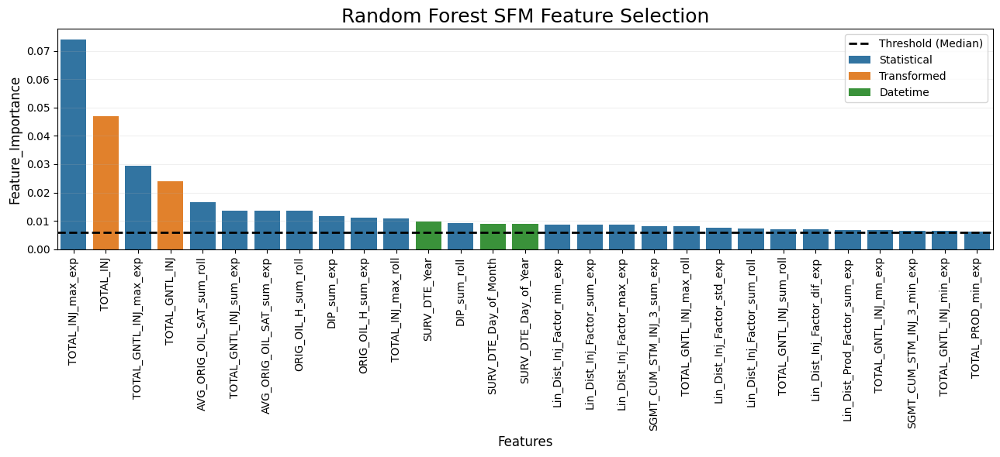

In [133]:
# plot the feature importances
select_plot(importances=sfm_imp, imp_fit=sfm_fit, threshold=sfm_thresh, method='SFM')

According to the impurity-based feature importances, when the SFM threshold is fixed at twice the median the most important features to the Random Forest model are features relating to the total volume of injection to resevoir or sand. The statistical features dominate the final subset of the feature space.

In [134]:
# merge the selected features and encoded categories
X_steam_sfm_train = merge(data=[X_steam_encoded_train, X_steam_sfm_train], axis=1)
X_steam_sfm_valid = merge(data=[X_steam_encoded_valid, X_steam_sfm_valid], axis=1)
X_steam_sfm_test = merge(data=[X_steam_encoded_test, X_steam_sfm_test], axis=1)

In [135]:
X_steam_sfm_train.head()

,SAND_TULS_B1,SAND_TULS_B2,SAND_TULS_B3,SAND_TULS_B4,SAND_TULS_B5,SAND_TULS_C1,SAND_TULS_C2,SAND_TULS_C3,SAND_TULS_C4,SAND_TULS_C5,...,TOTAL_GNTL_INJ_max_exp,Lin_Dist_Inj_Factor_max_exp,DIP_sum_exp,AVG_ORIG_OIL_SAT_sum_exp,ORIG_OIL_H_sum_exp,TOTAL_GNTL_INJ_sum_exp,Lin_Dist_Inj_Factor_sum_exp,SGMT_CUM_STM_INJ_3_sum_exp,Lin_Dist_Prod_Factor_sum_exp,Lin_Dist_Inj_Factor_dif_exp
SURV_DTE,,,,,,,,,,,,,,,,,,,,,
2012-10-25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.016200,-0.653419,-0.142571,2.052737,0.927771,1.016200,-0.653419,2.147767,0.455857,0.000000
2016-09-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.395090,-0.458466,-0.285142,4.105474,1.855541,2.411290,-1.111885,4.341278,0.549091,0.194953
1990-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-5.199338,-0.977283,0.259587,2.052737,0.321065,-5.199338,-0.977283,-0.336330,0.455857,0.000000
2012-10-25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.475603,-0.977283,0.519174,4.105474,0.642130,-5.674940,-1.954565,0.294870,0.911714,0.000000
2012-10-25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.820986,-0.390212,0.982249,0.843219,1.993963,0.820986,-0.390212,1.087227,0.455857,0.000000


In [136]:
X_steam_sfm_train.shape

(6934, 49)

#### 5.1.2 Recursive Feature Elimination

Recursive Feature Elimination (RFE) is another wrapper method implemented in scikit-learn that recursively evaluates smaller subsets of the feature space. On the first iteration, all features are used to train a model, and their importances are determined by the importance weights assigned by the model. The weakest features are eliminated from the feature space and the model is retrained with the new subset of high performing features. The process of eliminating weak features and retraining is then repeated until the desired number of features is reached. Once again, an ensemble of trees with impurity-based feature importances will be used to select features.

In [137]:
# perform feature selection on all features excluding the encoded categories
X_steam_rfe_train, X_steam_rfe_valid, X_steam_rfe_test, rfe_fit = select_feat(X_train=X_steam_all_train, 
                                                                              X_valid=X_steam_all_valid, 
                                                                              X_test=X_steam_all_test, 
                                                                              y_train=y_steam_train, 
                                                                              n_features=X_steam_sfm_train.iloc[:, 20:].shape[1], 
                                                                              method='RFE')

In [138]:
X_steam_rfe_train.head()

,SURV_DTE_Year,SURV_DTE_Day_of_Year,SURV_DTE_Day_of_Month,TOTAL_INJ,TOTAL_GNTL_INJ,TOTAL_INJ_max_roll,TOTAL_GNTL_INJ_max_roll,FT_DIST_PAT_2_max_roll,TOTAL_PROD_max_roll,DIP_sum_roll,...,TOTAL_GNTL_INJ_max_exp,Lin_Dist_Inj_Factor_max_exp,DIP_sum_exp,AVG_ORIG_OIL_SAT_sum_exp,ORIG_OIL_H_sum_exp,TOTAL_GNTL_INJ_sum_exp,Lin_Dist_Inj_Factor_sum_exp,FT_DIST_PAT_1_sum_exp,SGMT_CUM_STM_INJ_3_sum_exp,FT_DIST_PAT_3_sum_exp
SURV_DTE,,,,,,,,,,,,,,,,,,,,,
2012-10-25,0.733333,0.818681,0.800000,-0.328497,1.016200,-0.082346,1.395090,1.154300,0.532674,-0.285142,...,1.016200,-0.653419,-0.142571,2.052737,0.927771,1.016200,-0.653419,-5.199338,2.147767,0.925826
2016-09-02,0.866667,0.673077,0.033333,-0.082346,1.395090,-0.082346,1.395090,1.154300,0.532674,-0.285142,...,1.395090,-0.458466,-0.285142,4.105474,1.855541,2.411290,-1.111885,-10.398675,4.341278,1.851653
1990-01-01,0.000000,0.000000,0.000000,-5.199338,-5.199338,-0.328497,-0.475603,-5.199338,-0.056070,0.519174,...,-5.199338,-0.977283,0.259587,2.052737,0.321065,-5.199338,-0.977283,-5.199338,-0.336330,0.925826
2012-10-25,0.733333,0.818681,0.800000,-0.328497,-0.475603,-0.328497,-0.475603,-5.199338,-0.056070,0.519174,...,-0.475603,-0.977283,0.519174,4.105474,0.642130,-5.674940,-1.954565,-10.398675,0.294870,1.851653
2012-10-25,0.733333,0.818681,0.800000,-0.328497,0.820986,-0.082346,1.568208,1.154300,0.532674,1.964498,...,0.820986,-0.390212,0.982249,0.843219,1.993963,0.820986,-0.390212,-0.192441,1.087227,0.925826


In [139]:
X_steam_rfe_train.shape

(6934, 29)

In [140]:
# obtain the feature importances
rfe_imp = pd.DataFrame(rfe_fit.estimator_.feature_importances_, 
                       index=X_steam_all_train.loc[:, rfe_fit.support_].columns, 
                       columns=['Importance'])
rfe_imp = rfe_imp.sort_values(by='Importance', ascending=False)
rfe_imp.head()

,Importance
TOTAL_INJ,0.076564
TOTAL_INJ_max_exp,0.068989
AVG_ORIG_OIL_SAT_sum_roll,0.049098
ORIG_OIL_H_sum_roll,0.047773
TOTAL_GNTL_INJ_sum_exp,0.047171


In [141]:
# add the category of each feature to the feature importances dataframe
rfe_feat_cols = [X_steam_dates_train.columns, 
                 X_steam_transed_train.columns, 
                 X_steam_stats_train.columns]
rfe_feat_types = ['Datetime', 'Transformed', 'Statistical']
rfe_categories = dict()

for i, col_set in enumerate(rfe_feat_cols):
    for col in col_set:
        rfe_categories[col] = rfe_feat_types[i]
        
rfe_imp['Type'] = pd.Series(rfe_categories).get(rfe_imp.index)
rfe_imp.head()

,Importance,Type
TOTAL_INJ,0.076564,Transformed
TOTAL_INJ_max_exp,0.068989,Statistical
AVG_ORIG_OIL_SAT_sum_roll,0.049098,Statistical
ORIG_OIL_H_sum_roll,0.047773,Statistical
TOTAL_GNTL_INJ_sum_exp,0.047171,Statistical


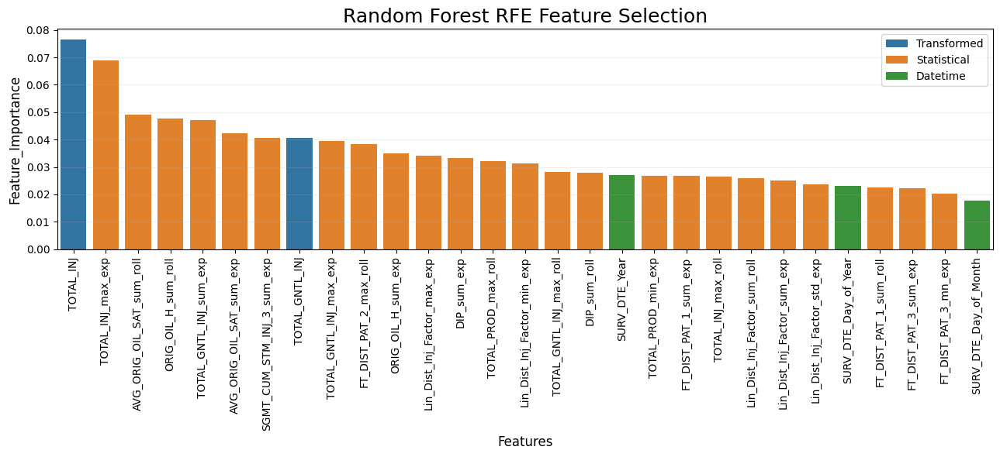

In [142]:
# plot the feature importances
select_plot(importances=rfe_imp, imp_fit=rfe_fit, threshold=None, method='RFE')

The most important features to the Random Forest model using RFE are re-ordered when compared to the SFM feature selection. However, both SFM and RFE identified the TOTAL_INJ_max_exp and TOTAL_INJ variables as the most important features. The datetime features are of less importance to the RFE than to the SFM feature selection. Similar to the SFM, the statistical features dominate the final subset of the feature space for the RFE.

In [143]:
# merge the selected features and encoded categories
X_steam_rfe_train = merge(data=[X_steam_encoded_train, X_steam_rfe_train], axis=1)
X_steam_rfe_valid = merge(data=[X_steam_encoded_valid, X_steam_rfe_valid], axis=1)
X_steam_rfe_test = merge(data=[X_steam_encoded_test, X_steam_rfe_test], axis=1)

In [144]:
X_steam_rfe_train.head()

,SAND_TULS_B1,SAND_TULS_B2,SAND_TULS_B3,SAND_TULS_B4,SAND_TULS_B5,SAND_TULS_C1,SAND_TULS_C2,SAND_TULS_C3,SAND_TULS_C4,SAND_TULS_C5,...,TOTAL_GNTL_INJ_max_exp,Lin_Dist_Inj_Factor_max_exp,DIP_sum_exp,AVG_ORIG_OIL_SAT_sum_exp,ORIG_OIL_H_sum_exp,TOTAL_GNTL_INJ_sum_exp,Lin_Dist_Inj_Factor_sum_exp,FT_DIST_PAT_1_sum_exp,SGMT_CUM_STM_INJ_3_sum_exp,FT_DIST_PAT_3_sum_exp
SURV_DTE,,,,,,,,,,,,,,,,,,,,,
2012-10-25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.016200,-0.653419,-0.142571,2.052737,0.927771,1.016200,-0.653419,-5.199338,2.147767,0.925826
2016-09-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.395090,-0.458466,-0.285142,4.105474,1.855541,2.411290,-1.111885,-10.398675,4.341278,1.851653
1990-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-5.199338,-0.977283,0.259587,2.052737,0.321065,-5.199338,-0.977283,-5.199338,-0.336330,0.925826
2012-10-25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.475603,-0.977283,0.519174,4.105474,0.642130,-5.674940,-1.954565,-10.398675,0.294870,1.851653
2012-10-25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.820986,-0.390212,0.982249,0.843219,1.993963,0.820986,-0.390212,-0.192441,1.087227,0.925826


In [145]:
X_steam_rfe_train.shape

(6934, 49)

### 5.2 Feature Extraction

Feature extraction is an another method for transforming a high dimensional feature space to low dimension. The extracted features should contain the discriminating characteristics of the data which are less redundant and more informative to the models than the raw data itself. Feature extraction transforms the raw data into a compact representation that maximizes the efficiency a model. It includes statistical techniques such as component analysis or factor analysis, and time-frequency transformations such as fourier transform or wavelet transform. Domain knowledge is usually helpful in selecting the feature extraction strategy that best suites specific data types. In this case component analysis will used to extract important components from the dataset. Component analysis is widely applied in various domains and often yields high performing features.

In [146]:
from sklearn.decomposition import PCA
from sklearn.decomposition import FastICA

In [147]:
# create a function for performing feature extraction on the train, validation and test sets 
def extract_feat(X_train, X_valid, X_test, attributes, threshold, method):
    # X_train: training features
    # X_valid: validating features
    # X_test: testing features
    # attributes: dataframe of PCA attributes
    # threshold: thresold value used for variance cutoff in PCA method
    # method: name of the feature selection method (one of 'PCA' or 'ICA')
    
    if method == 'PCA':
        fe_fit = PCA(n_components=len(attributes[attributes.evr_cumulative<threshold]), 
                     whiten=False, 
                     random_state=1234).fit(X_train)
        
    elif method == 'ICA':
        fe_fit = FastICA(n_components=3, 
                         whiten=False, 
                         random_state=1234).fit(X_train)
    
    X_fe_train = fe_fit.transform(X_train)
    X_fe_valid = fe_fit.transform(X_valid)
    X_fe_test = fe_fit.transform(X_test)
    
    if method == 'PCA':
        col_names = ['PC{}'.format(i) for i in range(1, X_fe_train.shape[1]+1)]
        
    elif method == 'ICA':
        col_names = ['IC{}'.format(i) for i in range(1, X_fe_train.shape[1]+1)]
    
    X_fe_train = pd.DataFrame(X_fe_train, 
                              index=X_train.index, 
                              columns=col_names)
    X_fe_valid = pd.DataFrame(X_fe_valid, 
                              index=X_valid.index, 
                              columns=col_names)
    X_fe_test = pd.DataFrame(X_fe_test, 
                              index=X_test.index, 
                              columns=col_names)
    
    return X_fe_train, X_fe_valid, X_fe_test, fe_fit

In [148]:
# create a function for plotting the feature importances
def extract_plot(attributes, threshold, method):
    # attributes: dataframe of PCA attributes
    # threshold: thresold value used for variance cutoff in PCA method
    # method: name of the feature selection method (one of 'PCA')
    
    fig, ax = plt.subplots(figsize=(13, 4))
    
    ax2 = ax.twinx()

    if method == 'PCA':
        attr_slice = attributes[attributes.evr_cumulative<threshold]
    sns.barplot(x=attr_slice.index, 
                y='explained_variance_ratio', 
                data=attr_slice, 
                label='explained_variance_ratio', 
                estimator=max, 
                ci=None, 
                color='tab:blue', 
                dodge=False, 
                ax=ax)
    sns.lineplot(x=attr_slice.index, 
                 y='evr_cumulative', 
                 data=attr_slice, 
                 label='evr_cumulative (Cutoff = {})'.format(threshold), 
                 marker='o', 
                 color='tab:red', 
                 ax=ax2)
    
    ln, lb = ax.get_legend_handles_labels()
    ln2, lb2 = ax2.get_legend_handles_labels()

    ax.legend(ln+ln2, lb+lb2, loc='center right')
    ax2.legend().remove()
    
    ax.set_xticklabels(ax.get_xticklabels(), ha='center', rotation='90')
    ax.set_xlabel('Principal Components', size=12)
    ax.set_ylabel('explained_variance_ratio', size=12)
    ax2.set_ylabel('evr_cumulative', size=12)
    #ax.set_yscale('log')
    ax.grid(axis='y', alpha=0.2)

    plt.title('{} Feature Extraction'.format(method), size=18)
    plt.tight_layout()

In [149]:
# create a function for determining the linear correlation between the extracted features and other variables
def extract_corr(variables, components):
    # variables: dataframe of feature or target variables
    # components: dataframe of principal components
    
    corr = pd.concat([variables, components], axis=1).corr(method='pearson')
    corr_slice = corr.iloc[variables.shape[1]:, :variables.shape[1]]
    corr_max = np.abs(corr_slice).idxmax(axis=1)
    
    corr_vals_dict = {}
    for comp, feat in zip(corr_max.index, corr_max.values):
        corr_vals_dict[comp] = corr_slice.loc[comp, feat]
    
    fig, ax = plt.subplots(figsize=(2, 0.7*components.shape[1]))
    
    corr_vals_df = pd.DataFrame(corr_vals_dict, index=['Max Absolute Correlation']).T
    
    hm = sns.heatmap(corr_vals_df, vmin=-1, vmax=1, 
                     cmap='RdBu_r', linewidths=0.005, 
                     linecolor='k', annot=True, 
                     fmt='g', cbar=True)
    
    ax.set_yticks(ax.get_yticks())
    ax.set_yticklabels(['{} ({})'.format(i, j) for i, j in zip(corr_max.index, corr_max.values)], rotation=0, size=12)
    ax.set_xticks(ax.get_xticks())
    ax.set_xticklabels(ax.get_xticklabels(), size=12)
    
    plt.suptitle(y=0.93, t='Max Absolute Correlation', size=18)
    plt.show()

#### 5.2.1 Principal Component Analysis

In Principal Component Analysis (PCA), the attributes are assumed to be Gaussian distributed and are transformed linearly to a new coordinate system (axis rotation). The multi-variate dataset is decomposed into orthogonal components that explain the successively diminishing maximum variance along their dimension. The first set of principal components represent the coherent signal with the highest variance, while the latter components contain the noise with lower variance. The top principal components are easier to explain and retain the most critical information in the attribute set. 

In [150]:
# check pca attributes
pca_all_fit = PCA(n_components=len(X_steam_all_train.columns), whiten=False, random_state=1234).fit(X_steam_all_train)
pca_attributes = pd.DataFrame(np.asarray([pca_all_fit.explained_variance_ratio_, 
                                          np.cumsum(pca_all_fit.explained_variance_ratio_), 
                                          pca_all_fit.singular_values_, 
                                          np.cumsum(pca_all_fit.singular_values_)]).T, 
                              columns=['explained_variance_ratio', 'evr_cumulative', 'singular_values', 'sv_cumulative'])
pca_attributes.index = ['PC{}'.format(i) for i in range(1, len(X_steam_all_train.columns)+1)]
pca_attributes.head()

,explained_variance_ratio,evr_cumulative,singular_values,sv_cumulative
PC1,0.293578,0.293578,1553.557302,1553.557302
PC2,0.165595,0.459173,1166.780380,2720.337682
PC3,0.133871,0.593044,1049.081551,3769.419233
PC4,0.086187,0.679231,841.757405,4611.176638
PC5,0.050666,0.729897,645.394089,5256.570727


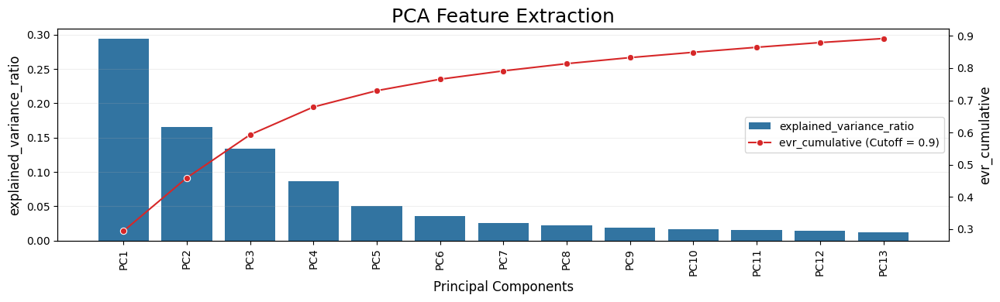

In [151]:
# plot the explained variances
extract_plot(attributes=pca_attributes, threshold=0.90, method='PCA')

In [152]:
# perform feature extraction on all features excluding the encoded categories
X_steam_pca_train, X_steam_pca_valid, X_steam_pca_test, pca_fit = extract_feat(X_train=X_steam_all_train, 
                                                                               X_valid=X_steam_all_valid, 
                                                                               X_test=X_steam_all_test, 
                                                                               attributes=pca_attributes, 
                                                                               threshold=0.9, 
                                                                               method='PCA')

In [153]:
X_steam_pca_train.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13
SURV_DTE,,,,,,,,,,,,,
2012-10-25,-8.144101,-4.408679,26.013198,3.776141,-4.251535,-9.338776,-2.199908,-0.498631,-0.741716,-4.120476,-5.105067,-6.046110,5.231020
2016-09-02,-7.916477,-4.697500,30.866245,4.867084,-3.817189,-11.016835,-1.612618,-0.634990,0.569411,-1.638170,-3.015941,-1.439784,4.591444
1990-01-01,9.003547,-12.944722,7.430144,-23.873022,-2.933725,-7.400292,2.321049,-3.095544,-6.806845,1.868655,-7.299256,-1.521825,4.259230
2012-10-25,15.304405,-18.732512,9.624815,-17.084392,1.872708,-11.914557,2.174585,-3.159895,-3.020474,2.940213,6.825968,-4.257193,0.818086
2012-10-25,-21.244068,-2.060317,3.581032,3.540619,0.781640,-2.954761,3.433568,-2.268355,0.923057,0.291593,-2.825233,-0.415400,4.131899


In [154]:
X_steam_pca_train.shape

(6934, 13)

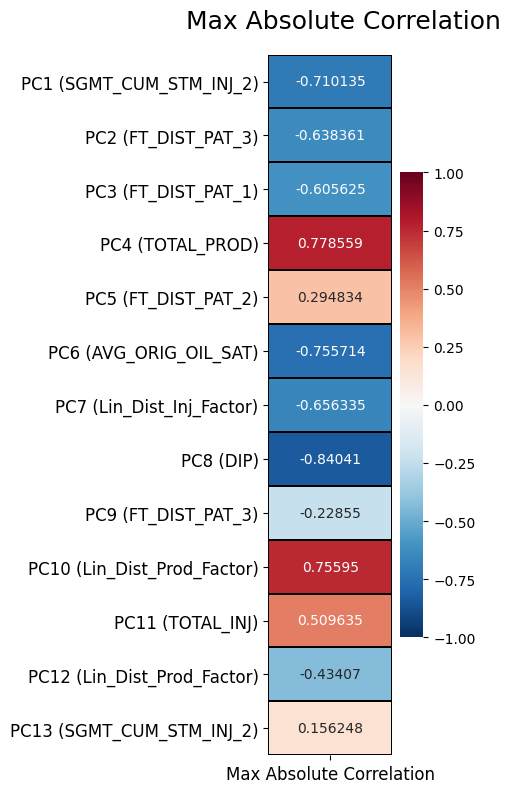

In [155]:
# determine which original features have the highest linear correlation to the extracted features
extract_corr(variables=X_steam_transed_train, components=X_steam_pca_train)

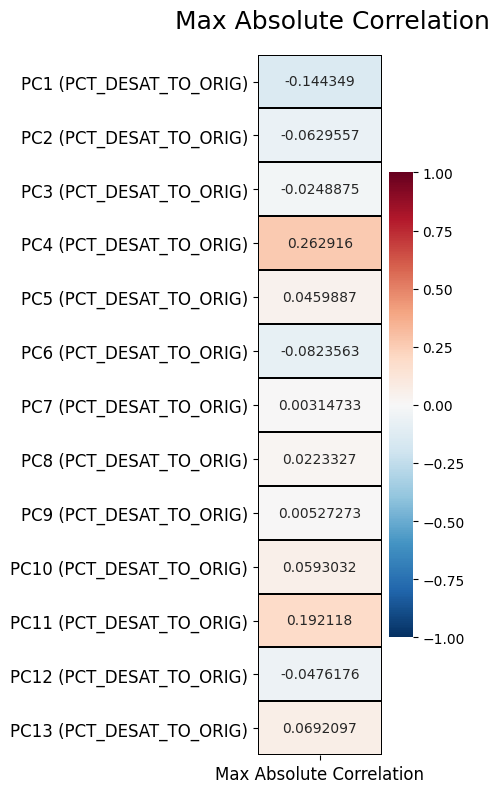

In [156]:
# determine the linear correlation between the extracted features and the target
extract_corr(variables=y_steam_train, components=X_steam_pca_train)

In [157]:
# merge the extracted features and encoded categories
X_steam_pca_train = merge(data=[X_steam_encoded_train, X_steam_pca_train], axis=1)
X_steam_pca_valid = merge(data=[X_steam_encoded_valid, X_steam_pca_valid], axis=1)
X_steam_pca_test = merge(data=[X_steam_encoded_test, X_steam_pca_test], axis=1)

In [158]:
X_steam_pca_train.head()

,SAND_TULS_B1,SAND_TULS_B2,SAND_TULS_B3,SAND_TULS_B4,SAND_TULS_B5,SAND_TULS_C1,SAND_TULS_C2,SAND_TULS_C3,SAND_TULS_C4,SAND_TULS_C5,...,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13
SURV_DTE,,,,,,,,,,,,,,,,,,,,,
2012-10-25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.776141,-4.251535,-9.338776,-2.199908,-0.498631,-0.741716,-4.120476,-5.105067,-6.046110,5.231020
2016-09-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,4.867084,-3.817189,-11.016835,-1.612618,-0.634990,0.569411,-1.638170,-3.015941,-1.439784,4.591444
1990-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-23.873022,-2.933725,-7.400292,2.321049,-3.095544,-6.806845,1.868655,-7.299256,-1.521825,4.259230
2012-10-25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-17.084392,1.872708,-11.914557,2.174585,-3.159895,-3.020474,2.940213,6.825968,-4.257193,0.818086
2012-10-25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.540619,0.781640,-2.954761,3.433568,-2.268355,0.923057,0.291593,-2.825233,-0.415400,4.131899


In [159]:
X_steam_pca_train.shape

(6934, 33)

#### 5.2.2 Independent Component Analysis

The Independent Component Analysis (ICA) is a signal processing technique commonly applied for decomposing a mixed signal into its additive but statistically independent subcomponents. The sub-components are maximally independent and have a non-gaussian distribution. ICA identifies directions of maximum non-gaussianity which are non-orthognal (oblique) in the original feature space but correspond to rotated orthogonal axis of uniform variance in the whitened space. PCA maximizes the variance to obtain uncorrelated components, while ICA maximizes the non-gaussianity to obtain independent components. Satifsying the orthogonality condition in PCA may result in mixing rather than seprating information. Hence, the ICA may provide an added advantage for recovering the statistically independent geologic information contained in the multi-attribute trace records. However, the subcomponents are unordered and thus require inspection for determining their relevance.

In [160]:
# perform feature extraction on all features excluding the encoded categories
X_steam_ica_train, X_steam_ica_valid, X_steam_ica_test, ica_fit = extract_feat(
    X_train=X_steam_pca_train.drop(X_steam_encoded_train.columns, axis=1), 
    X_valid=X_steam_pca_valid.drop(X_steam_encoded_valid.columns, axis=1), 
    X_test=X_steam_pca_test.drop(X_steam_encoded_test.columns, axis=1), 
    attributes=pca_attributes, 
    threshold=0.9, 
    method='ICA')

In [161]:
X_steam_ica_train.head()

,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC10,IC11,IC12,IC13
SURV_DTE,,,,,,,,,,,,,
2012-10-25,6.526515,4.046329,-3.104107,-10.275092,-9.411733,4.035760,-6.678725,8.313427,-11.284843,9.771130,14.633610,9.260816,-8.893742
2016-09-02,8.880368,5.315737,-4.176319,-10.174797,-6.065440,1.220700,-6.186769,10.147572,-11.440070,9.012004,17.682391,13.008158,-11.565830
1990-01-01,3.049656,-10.394462,-10.663207,-12.001694,-6.209868,-8.998986,9.234357,-6.260708,-7.565900,5.311076,2.268319,-12.212885,-14.724323
2012-10-25,6.648946,-14.729983,-10.139421,-8.075282,-5.886145,-9.310015,13.793892,6.421897,-2.287117,-3.286829,10.469742,-11.820814,-12.867099
2012-10-25,-6.688322,2.431555,-3.400356,-8.946285,5.567184,7.206916,-4.436248,6.474137,-8.109232,8.381833,-1.032680,9.735263,3.837528


In [162]:
X_steam_ica_train.shape

(6934, 13)

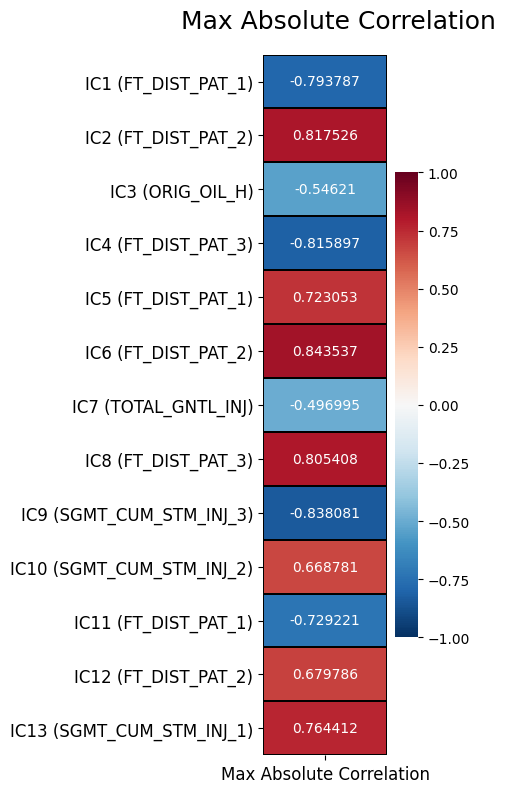

In [163]:
# determine which original features have the highest linear correlation to the extracted features
extract_corr(variables=X_steam_transed_train, components=X_steam_ica_train)

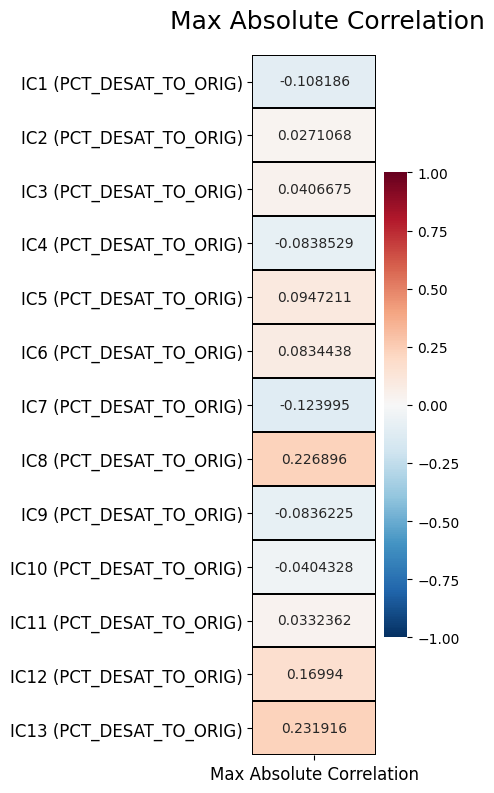

In [164]:
# determine the linear correlation between the extracted features and the target
extract_corr(variables=y_steam_train, components=X_steam_ica_train)

In [165]:
# merge the extracted features and encoded categories
X_steam_ica_train = merge(data=[X_steam_encoded_train, X_steam_ica_train], axis=1)
X_steam_ica_valid = merge(data=[X_steam_encoded_valid, X_steam_ica_valid], axis=1)
X_steam_ica_test = merge(data=[X_steam_encoded_test, X_steam_ica_test], axis=1)

In [166]:
X_steam_ica_train.head()

,SAND_TULS_B1,SAND_TULS_B2,SAND_TULS_B3,SAND_TULS_B4,SAND_TULS_B5,SAND_TULS_C1,SAND_TULS_C2,SAND_TULS_C3,SAND_TULS_C4,SAND_TULS_C5,...,IC4,IC5,IC6,IC7,IC8,IC9,IC10,IC11,IC12,IC13
SURV_DTE,,,,,,,,,,,,,,,,,,,,,
2012-10-25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-10.275092,-9.411733,4.035760,-6.678725,8.313427,-11.284843,9.771130,14.633610,9.260816,-8.893742
2016-09-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-10.174797,-6.065440,1.220700,-6.186769,10.147572,-11.440070,9.012004,17.682391,13.008158,-11.565830
1990-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-12.001694,-6.209868,-8.998986,9.234357,-6.260708,-7.565900,5.311076,2.268319,-12.212885,-14.724323
2012-10-25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-8.075282,-5.886145,-9.310015,13.793892,6.421897,-2.287117,-3.286829,10.469742,-11.820814,-12.867099
2012-10-25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-8.946285,5.567184,7.206916,-4.436248,6.474137,-8.109232,8.381833,-1.032680,9.735263,3.837528


In [167]:
X_steam_ica_train.shape

(6934, 33)

### 5.3 Feature Testing

In [168]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [169]:
# create a function for evaluating the performance of the invidual feature classes on a baseline model
def feature_test(model, X_train, X_valid, y_train, y_valid, feature_names):
    # model: baseline model for testing the feature performance
    # X_train: list of training features
    # y_train: training target
    # X_valid: list of validating features
    # y_valid: validating target
    # feature_names: list of feature classes
    
    feat_scrs_df = pd.DataFrame([], columns=['RMSE', 'MAE', 'R2', 'R'], index=feature_names)
    for i, feat in enumerate(feature_names):
        model_fit = model.fit(X_train[i], y_train)
        y_pred = model_fit.predict(X_valid[i])
        y_pred = pd.DataFrame(y_pred, index=y_valid.index, columns=['PREDICTED'])
        feat_scrs_df.loc[feat, 'RMSE'] = mean_squared_error(y_valid, y_pred, squared=False)
        feat_scrs_df.loc[feat, 'MAE'] = mean_absolute_error(y_valid, y_pred)
        feat_scrs_df.loc[feat, 'R2'] = r2_score(y_valid, y_pred)
        feat_scrs_df.loc[feat, 'R'] = pd.concat([y_valid, y_pred], axis=1).corr(method='spearman').values[0, 1]
    
    return feat_scrs_df

In [170]:
# evaluate the performance of the invidual feature classes on a baseline model
feat_scrs_df = feature_test(model=RandomForestRegressor(random_state=1234), 
                            X_train=[X_steam_dates_train, 
                                     X_steam_encoded_train, 
                                     X_steam_transed_train, 
                                     X_steam_stats_train, 
                                     pd.concat([X_steam_dates_train, X_steam_encoded_train], axis=1), 
                                     pd.concat([X_steam_dates_train, X_steam_transed_train], axis=1), 
                                     pd.concat([X_steam_dates_train, X_steam_stats_train], axis=1), 
                                     pd.concat([X_steam_encoded_train, X_steam_transed_train], axis=1), 
                                     pd.concat([X_steam_encoded_train, X_steam_stats_train], axis=1), 
                                     pd.concat([X_steam_transed_train, X_steam_stats_train], axis=1), 
                                     pd.concat([X_steam_dates_train, X_steam_encoded_train, X_steam_transed_train], axis=1), 
                                     pd.concat([X_steam_dates_train, X_steam_encoded_train, X_steam_stats_train], axis=1), 
                                     pd.concat([X_steam_encoded_train, X_steam_transed_train, X_steam_stats_train], axis=1), 
                                     pd.concat([X_steam_dates_train, X_steam_transed_train, X_steam_stats_train], axis=1), 
                                     X_steam_sfm_train, 
                                     X_steam_rfe_train, 
                                     X_steam_pca_train, 
                                     X_steam_ica_train], 
                            X_valid=[X_steam_dates_valid, 
                                     X_steam_encoded_valid, 
                                     X_steam_transed_valid, 
                                     X_steam_stats_valid, 
                                     pd.concat([X_steam_dates_valid, X_steam_encoded_valid], axis=1), 
                                     pd.concat([X_steam_dates_valid, X_steam_transed_valid], axis=1), 
                                     pd.concat([X_steam_dates_valid, X_steam_stats_valid], axis=1), 
                                     pd.concat([X_steam_encoded_valid, X_steam_transed_valid], axis=1), 
                                     pd.concat([X_steam_encoded_valid, X_steam_stats_valid], axis=1), 
                                     pd.concat([X_steam_transed_valid, X_steam_stats_valid], axis=1), 
                                     pd.concat([X_steam_dates_valid, X_steam_encoded_valid, X_steam_transed_valid], axis=1), 
                                     pd.concat([X_steam_dates_valid, X_steam_encoded_valid, X_steam_stats_valid], axis=1), 
                                     pd.concat([X_steam_encoded_valid, X_steam_transed_valid, X_steam_stats_valid], axis=1), 
                                     pd.concat([X_steam_dates_valid, X_steam_transed_valid, X_steam_stats_valid], axis=1), 
                                     X_steam_sfm_valid, 
                                     X_steam_rfe_valid, 
                                     X_steam_pca_valid, 
                                     X_steam_ica_valid],
                            y_train=y_steam_train, 
                            y_valid=y_steam_valid, 
                            feature_names=['dates', 
                                           'encoded', 
                                           'transed', 
                                           'stats', 
                                           'dates_encoded', 
                                           'dates_transed', 
                                           'dates_stats', 
                                           'encoded_transed', 
                                           'encoded_stats', 
                                           'transed_stats', 
                                           'dates_encoded_transed', 
                                           'dates_encoded_stats', 
                                           'encoded_transed_stats', 
                                           'dates_transed_stats', 
                                           'sfm', 
                                           'rfe', 
                                           'pca', 
                                           'ica'])

In [171]:
feat_scrs_df.style.highlight_min(['RMSE', 'MAE'], 'lightblue').highlight_max(['R2', 'R'], 'pink')

,RMSE,MAE,R2,R
dates,0.517989,0.432035,-0.599698,-0.036672
encoded,0.456227,0.382171,-0.240966,0.324953
transed,0.252613,0.194310,0.619540,0.823311
stats,0.388201,0.328515,0.101515,0.466047
dates_encoded,0.492000,0.405255,-0.443200,0.115510
dates_transed,0.297406,0.242864,0.472655,0.762845
dates_stats,0.383692,0.323924,0.122267,0.491927
encoded_transed,0.245982,0.187217,0.639253,0.834562
encoded_stats,0.380695,0.319517,0.135927,0.509936
transed_stats,0.388884,0.328499,0.098353,0.465171


In [172]:
# specify the final train, validation and test sets
(X_train, X_valid, X_test) = (pd.concat([X_steam_encoded_train, X_steam_transed_train], axis=1), 
                              pd.concat([X_steam_encoded_valid, X_steam_transed_valid], axis=1), 
                              pd.concat([X_steam_encoded_test, X_steam_transed_test], axis=1))

(y_train, y_valid) = (y_steam_train, 
                      y_steam_valid)

print('Train Features Size: {}'.format(X_train.shape))
print('Train Target Size: {}'.format(y_train.shape))
print('Validation Features Size: {}'.format(X_valid.shape))
print('Validation Target Size: {}'.format(y_valid.shape))
print('Test Features Size: {}'.format(X_test.shape))

Train Features Size: (6934, 34)
Train Target Size: (6934, 1)
Validation Features Size: (1070, 34)
Validation Target Size: (1070, 1)
Test Features Size: (1504, 34)


In [173]:
X_train.head()

,SAND_TULS_B1,SAND_TULS_B2,SAND_TULS_B3,SAND_TULS_B4,SAND_TULS_B5,SAND_TULS_C1,SAND_TULS_C2,SAND_TULS_C3,SAND_TULS_C4,SAND_TULS_C5,...,TOTAL_GNTL_INJ,Lin_Dist_Inj_Factor,SGMT_CUM_STM_INJ_1,FT_DIST_PAT_1,SGMT_CUM_STM_INJ_2,FT_DIST_PAT_2,SGMT_CUM_STM_INJ_3,FT_DIST_PAT_3,TOTAL_PROD,Lin_Dist_Prod_Factor
SURV_DTE,,,,,,,,,,,,,,,,,,,,,
2012-10-25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.016200,-0.653419,-5.199338,-5.199338,1.383700,1.154300,2.147767,0.925826,-0.056070,0.455857
2016-09-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.395090,-0.458466,-5.199338,-5.199338,2.173896,1.154300,2.193511,0.925826,0.532674,0.093234
1990-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-5.199338,-0.977283,-0.488598,-5.199338,-0.372908,-5.199338,-0.336330,0.925826,-5.199338,0.455857
2012-10-25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.475603,-0.977283,-5.199338,-5.199338,-5.199338,-5.199338,0.631200,0.925826,-0.056070,0.455857
2012-10-25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.820986,-0.390212,0.666003,-0.192441,0.771833,1.154300,1.087227,0.925826,-0.056070,0.455857


In [174]:
y_train.head()

,PCT_DESAT_TO_ORIG
SURV_DTE,
2012-10-25,1.00
2016-09-02,1.00
1990-01-01,0.00
2012-10-25,0.79
2012-10-25,0.35


## 6. Time Series Regression

### 6.1 Model Selection and Evaluation

In [175]:
from sklearn.base import BaseEstimator, RegressorMixin
from sklearn.pipeline import make_pipeline
from skopt import BayesSearchCV
from skopt.space import Real, Integer, Categorical
from sklearn.model_selection import learning_curve
from skopt.plots import plot_convergence, plot_objective
from sklearn.ensemble import VotingRegressor, StackingRegressor
from matplotlib.ticker import FormatStrFormatter

In [176]:
def GroupTimeSeriesSplit(data, well_sand_idx, n_splits):
    # data: dataframe from which to generate train, test indices
    # well_sand_idx: well and sand indices of the dataframe
    # n_splits: number of splits on each group (must be at least 2)
    
    data_merge = pd.concat([well_sand_idx, data], axis=1)
    data_merge_rsidx = data_merge.set_index([data_merge.CMPL_FAC_ID, data_merge.SAND, data_merge.index])
    data_groups = data_merge.groupby(['CMPL_FAC_ID', 'SAND'])
    
    split_idxs = []
    
    for i in range(n_splits-1):
        train_data = data_groups.apply(lambda x: x.iloc[:int(np.ceil((i+1)*(1/n_splits)*len(x)))])
        test_data = data_groups.apply(lambda x: x.iloc[int(np.ceil((i+1)*(1/n_splits)*len(x))):
                                                      int(np.ceil((i+2)*(1/n_splits)*len(x)))])
        train_idx = np.where(data_merge_rsidx.index.isin(train_data.index))[0]
        test_idx = np.where(data_merge_rsidx.index.isin(test_data.index))[0]
        split_idxs.append((train_idx, test_idx))
        
    return split_idxs

In [177]:
custom_cv = GroupTimeSeriesSplit(data=X_train, 
                                 well_sand_idx=X_steam_imputed_train[['CMPL_FAC_ID', 'SAND']], 
                                 n_splits=5)

for i in range(len(custom_cv)):
    print('CV Split_{} Train Size: {}'.format(i+1, len(custom_cv[i][0])))
    print('CV Split_{} Test Size: {}'.format(i+1, len(custom_cv[i][1])))

CV Split_1 Train Size: 3484
CV Split_1 Test Size: 835
CV Split_2 Train Size: 4319
CV Split_2 Test Size: 1413
CV Split_3 Train Size: 5732
CV Split_3 Test Size: 724
CV Split_4 Train Size: 6456
CV Split_4 Test Size: 478


#### 6.1.1 Cross-Validation and Hyper-Parameterization

##### 6.1.1.1 Model Training

In [178]:
# specify the estimators
estimators = [LinearRegression(), 
              BayesianRidge(), 
              SVR(), 
              KNeighborsRegressor(), 
              DecisionTreeRegressor(random_state=1234), 
              RandomForestRegressor(random_state=1234), 
              ExtraTreesRegressor(random_state=1234), 
              GradientBoostingRegressor(random_state=1234), 
              HGBRegressor(random_state=1234), 
              XGBRegressor(random_state=1234), 
              LGBMRegressor(random_state=1234), 
              CatBoostRegressor(verbose=0, random_state=1234)]

# specify the names of the estimators
estimator_names = ['Linear', 
                   'Bayesian_Ridge', 
                   'SVM', 
                   'KNN', 
                   'Decision_Tree', 
                   'Random_Forest', 
                   'Extra_Trees', 
                   'Gradient_Boost', 
                   'Histogram_GBM', 
                   'Extreme_GBM', 
                   'Light_GBM', 
                   'Cat_Boost']

In [179]:
# create a function for bayesian optimization for cross-validation and hyper-parameter tuning
def model_train(estimators, estimator_names, X_train, y_train, X_valid, y_valid, custom_cv):
    # estimators: list of estimators
    # estimator_names: list of estimator names 
    # X_train: training features
    # y_train: training target
    # X_valid: validating features
    # y_valid: validating target
    # custom_cv: iterable yielding train, test splits
    
    val_keys = (['split{}_test_score'.format(i) for i in range(len(custom_cv))] + 
                ['mean_test_score', 'std_test_score'])

    search_spaces = [{'linearregression__fit_intercept': Categorical([True])}, 
                     
                     {'bayesianridge__fit_intercept': Categorical([True])}, 
                     
                     {'svr__gamma': Real(0.01, 1), 
                      'svr__C': Real(0.1, 10), 
                      'svr__epsilon': Real(0.01, 1)}, 
                     
                     {'kneighborsregressor__n_neighbors': Integer(1, 100), 
                      'kneighborsregressor__weights': Categorical(['uniform', 'distance'])}, 
                     
                     {'decisiontreeregressor__max_depth': Integer(1, 100), 
                      'decisiontreeregressor__min_samples_split': Integer(2, 100), 
                      'decisiontreeregressor__max_features': Real(0.1, 1.0)}, 
                     
                     {'randomforestregressor__n_estimators': Integer(5, 500), 
                      'randomforestregressor__max_depth': Integer(1, 100), 
                      'randomforestregressor__min_samples_split': Integer(2, 100), 
                      'randomforestregressor__max_features': Real(0.1, 1.0)}, 
                     
                     {'extratreesregressor__n_estimators': Integer(5, 500), 
                      'extratreesregressor__max_depth': Integer(1, 100), 
                      'extratreesregressor__min_samples_split': Integer(2, 100), 
                      'extratreesregressor__max_features': Real(0.1, 1.0)}, 
                     
                     {'gradientboostingregressor__n_estimators': Integer(5, 500), 
                      'gradientboostingregressor__max_depth': Integer(1, 100), 
                      'gradientboostingregressor__min_samples_split': Integer(2, 100), 
                      'gradientboostingregressor__max_features': Real(0.1, 1.0), 
                      'gradientboostingregressor__learning_rate': Real(0.01, 1.0)}, 
                     
                     {'histgradientboostingregressor__max_iter': Integer(5, 500), 
                      'histgradientboostingregressor__max_depth': Integer(1, 100), 
                      'histgradientboostingregressor__learning_rate': Real(0.01, 1.0), 
                      'histgradientboostingregressor__l2_regularization': Real(0.0, 1.0)}, 
                     
                     {'xgbregressor__n_estimators': Integer(5, 500), 
                      'xgbregressor__max_depth': Integer(1, 100), 
                      'xgbregressor__learning_rate': Real(0.01, 1.0), 
                      'xgbregressor__reg_alpha': Real(0.0, 1.0), 
                      'xgbregressor__reg_lambda': Real(0.0, 1.0), 
                      'xgbregressor__booster': Categorical(['gbtree', 'dart']), 
                      'xgbregressor__tree_method': Categorical(['approx'])}, 

                     {'lgbmregressor__n_estimators': Integer(5, 500), 
                      'lgbmregressor__max_depth': Integer(1, 100), 
                      'lgbmregressor__learning_rate': Real(0.01, 1.0), 
                      'lgbmregressor__reg_alpha': Real(0.0, 1.0), 
                      'lgbmregressor__reg_lambda': Real(0.0, 1.0), 
                      'lgbmregressor__boosting_type': Categorical(['gbdt', 'dart', 'goss'])}, 
                     
                     {'catboostregressor__n_estimators': Integer(10, 1000), 
                      'catboostregressor__max_depth': Integer(1, 10), 
                      'catboostregressor__learning_rate': Real(0.01, 1.0), 
                      'catboostregressor__reg_lambda': Real(0.0, 1.0), 
                      'catboostregressor__boosting_type': Categorical(['Plain']), 
                      'catboostregressor__random_strength': Real(0.01, 1.0)}]

    optimizer_kwargs = {'base_estimator': 'RF'}
    
    #def early_stop(best_result):
        #score = model_cv_hp.best_score_
        #if score >= 0.98:
            #print('Early Stop!')
            #return True

    cv_fit = []
    scrs_val = [[] for est in estimators]
    scrs_test = [[] for est in estimators]
    ests = [est for est in estimators]
    best_fit = [est for est in estimators]

    for i in range(len(estimators)):
        print()
        print('*******{} estimator cross-validation/hyper-parameterization******* \n'.format(estimator_names[i]))
        start_time = time.time()
        ests[i] = make_pipeline(estimators[i])
        cv_hp = BayesSearchCV(estimator=ests[i], 
                              search_spaces=search_spaces[i], 
                              n_iter=50, 
                              optimizer_kwargs=optimizer_kwargs, 
                              scoring='neg_root_mean_squared_error', 
                              n_points=1, 
                              refit=True, 
                              cv=custom_cv, 
                              verbose=1, 
                              random_state=1234)
        cv_fit.append(cv_hp.fit(X=X_train.values, y=y_train.values))
        scrs_test[i].append(cv_fit[i].score(X=X_valid.values, y=y_valid.values))
        
        print(f'Test Score (RMSE): {scrs_test[i][0]*-1}')

        for key in val_keys:
            scrs_val[i].append(cv_fit[i].cv_results_[key][cv_fit[i].best_index_])
            
        best_fit[i] = cv_fit[i].best_estimator_

        end_time = time.time()
        print(f'Training time: {end_time - start_time} seconds')
    
    scrs_val_df = pd.DataFrame(scrs_val, 
                               index=estimator_names, 
                               columns=val_keys[:len(custom_cv)]+['mean_val_score', 'std_val_score'])
    scrs_val_df.iloc[:, :-1] = scrs_val_df.iloc[:, :-1]*-1
    scrs_test_df = pd.DataFrame(scrs_test, 
                                index=estimator_names, 
                                columns=['test_score'])
    scrs_test_df = scrs_test_df*-1
    scrs_df = pd.concat([scrs_val_df, scrs_test_df], axis=1)
    
    return cv_fit, best_fit, scrs_df

In [180]:
# base model training
cv_fit, best_fit, cv_scrs_df = model_train(estimators=estimators, 
                                           estimator_names=estimator_names, 
                                           X_train=X_train, 
                                           y_train=y_train, 
                                           X_valid=X_valid, 
                                           y_valid=y_valid, 
                                           custom_cv=custom_cv)


*******Linear estimator cross-validation/hyper-parameterization******* 

Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates,

Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fi

Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fi

Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Test Score (RMSE): 0.2153683431634278
Training time: 3776.289689064026 seconds

*******Histogram_GBM estimator cross-validation/hyper-parameterization******* 

Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 fold

Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fi

In [181]:
# best parameters
for i, est in enumerate(estimator_names):
    print()
    print(est, 'Estimator Best Parameters:')
    print(cv_fit[i].cv_results_['params'][cv_fit[i].best_index_])


Linear Estimator Best Parameters:
OrderedDict([('linearregression__fit_intercept', True)])

Bayesian_Ridge Estimator Best Parameters:
OrderedDict([('bayesianridge__fit_intercept', True)])

SVM Estimator Best Parameters:
OrderedDict([('svr__C', 9.872250858177594), ('svr__epsilon', 0.014957331503133714), ('svr__gamma', 0.25298855240849594)])

KNN Estimator Best Parameters:
OrderedDict([('kneighborsregressor__n_neighbors', 1), ('kneighborsregressor__weights', 'distance')])

Decision_Tree Estimator Best Parameters:
OrderedDict([('decisiontreeregressor__max_depth', 70), ('decisiontreeregressor__max_features', 0.7242121118180054), ('decisiontreeregressor__min_samples_split', 17)])

Random_Forest Estimator Best Parameters:
OrderedDict([('randomforestregressor__max_depth', 27), ('randomforestregressor__max_features', 0.1189043347120714), ('randomforestregressor__min_samples_split', 2), ('randomforestregressor__n_estimators', 401)])

Extra_Trees Estimator Best Parameters:
OrderedDict([('extrat

##### 6.1.1.2 Model Prediction

In [182]:
# create a function for predicting on the validation or test set
def model_pred(X_data, est_fit, estimator_names):
    # X_data: validation or test features
    # est_fit: fitted estimators to use for prediction
    # estimator_names: list of estimator names
    
    y_pred = pd.DataFrame(index=X_data.index, columns=estimator_names)

    for i, est in enumerate(estimator_names):
        print()
        print('*******{} Estimator Prediction*******'.format(estimator_names[i]))
        start_time = time.time()

        y_pred[est] = est_fit[i].predict(X_data)

        end_time = time.time()
        print(f'Predicting time: {end_time - start_time} seconds')
        
    return y_pred

In [183]:
# base model predictions
y_pred = model_pred(X_data=X_valid, 
                    est_fit=best_fit, 
                    estimator_names=estimator_names)


*******Linear Estimator Prediction*******
Predicting time: 0.012068510055541992 seconds

*******Bayesian_Ridge Estimator Prediction*******
Predicting time: 0.008024930953979492 seconds

*******SVM Estimator Prediction*******
Predicting time: 1.5226638317108154 seconds

*******KNN Estimator Prediction*******
Predicting time: 0.04288506507873535 seconds

*******Decision_Tree Estimator Prediction*******
Predicting time: 0.005983829498291016 seconds

*******Random_Forest Estimator Prediction*******
Predicting time: 0.9729340076446533 seconds

*******Extra_Trees Estimator Prediction*******
Predicting time: 1.8429431915283203 seconds

*******Gradient_Boost Estimator Prediction*******
Predicting time: 0.2070624828338623 seconds

*******Histogram_GBM Estimator Prediction*******
Predicting time: 0.060654640197753906 seconds

*******Extreme_GBM Estimator Prediction*******
Predicting time: 0.18432044982910156 seconds

*******Light_GBM Estimator Prediction*******
Predicting time: 0.03124260902404

In [184]:
y_pred.head()

,Linear,Bayesian_Ridge,SVM,KNN,Decision_Tree,Random_Forest,Extra_Trees,Gradient_Boost,Histogram_GBM,Extreme_GBM,Light_GBM,Cat_Boost
SURV_DTE,,,,,,,,,,,,
2016-09-02,0.384897,0.385321,0.717847,0.79,0.968333,0.448491,0.537802,0.543036,0.808231,0.563066,0.713932,0.538095
2016-09-02,0.349973,0.346263,0.354363,0.00,0.046000,0.273207,0.297082,0.323003,0.181381,0.504193,0.357936,0.417687
2015-02-27,0.218547,0.214412,0.886198,1.00,0.126364,0.469248,0.551210,0.463145,0.603042,0.506643,0.402575,0.535608
2015-02-27,0.281228,0.279939,0.650814,0.82,0.735455,0.425815,0.448491,0.608225,0.660290,0.549429,0.511374,0.427347
2015-02-27,0.279236,0.275678,1.162460,1.00,0.027500,0.448492,0.595886,0.569175,0.589095,0.652417,0.643604,0.618959


#### 6.1.2 Metrics and Scoring

##### 6.1.2.1 Cross-Validation Score

In [185]:
# CV scores
cv_scrs_df.style.highlight_min(subset=['mean_val_score', 'std_val_score', 'test_score'], color='lightblue')

,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_val_score,std_val_score,test_score
Linear,0.325662,0.355226,0.362567,0.392881,0.359084,0.023908,0.394715
Bayesian_Ridge,0.325998,0.356154,0.363287,0.393760,0.359800,0.024090,0.395414
SVM,0.288209,0.279084,0.186458,0.229487,0.245810,0.040908,0.203382
KNN,0.331363,0.323569,0.190597,0.212996,0.264631,0.063392,0.184879
Decision_Tree,0.388378,0.381387,0.333610,0.319151,0.355632,0.029797,0.366590
Random_Forest,0.297938,0.300878,0.241230,0.253529,0.273394,0.026395,0.242477
Extra_Trees,0.283541,0.282407,0.207324,0.226952,0.250056,0.033644,0.202612
Gradient_Boost,0.287784,0.278101,0.214426,0.230578,0.252722,0.030945,0.215368
Histogram_GBM,0.291355,0.289717,0.219219,0.232535,0.258206,0.032676,0.227257
Extreme_GBM,0.295014,0.286817,0.219349,0.235294,0.259118,0.032422,0.236787


In [186]:
# obtain the mean validation scores and test scores
cv_hp_scrs = cv_scrs_df.reset_index().melt(id_vars='index', value_vars=['mean_val_score', 'test_score'])

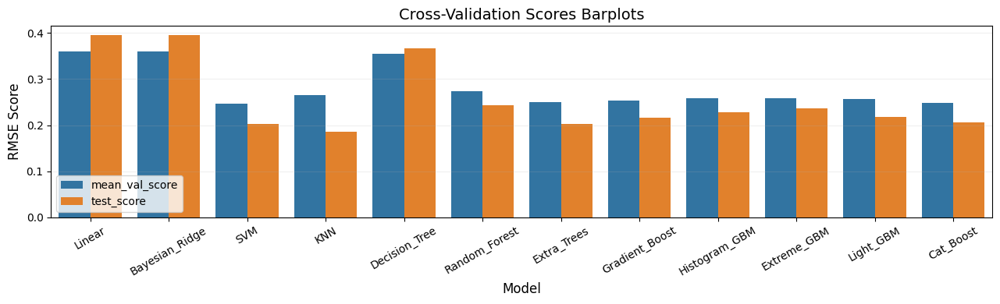

In [187]:
# plot the barplot to compare the values of the cv scores
fig, ax = plt.subplots(figsize=(13, 4))

sns.barplot(data=cv_hp_scrs, x='index', y='value', hue='variable')
ax.set_xlabel('Model', size=12)
ax.set_ylabel('RMSE Score', size=12)
ax.set_xticklabels(ax.get_xticklabels(), rotation='30')
ax.set_title('Cross-Validation Scores Barplots', size=14)
ax.grid(axis='y', alpha=0.2)
ax.legend(loc='lower left')
plt.tight_layout()

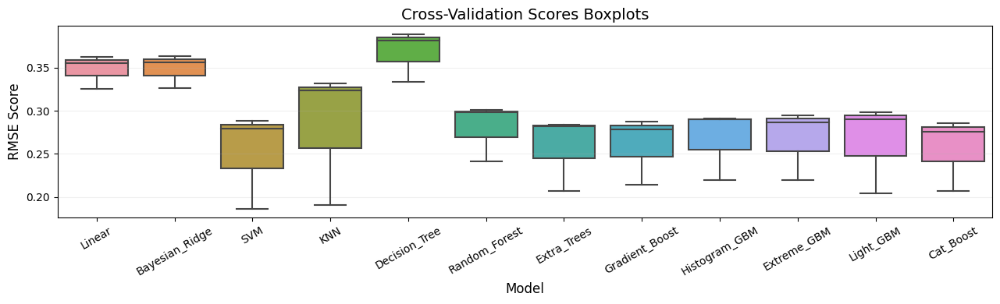

In [188]:
# plot the boxplot to compare the spread and centers of the cv scores
fig, ax = plt.subplots(figsize=(13, 4))

sns.boxplot(data=cv_scrs_df.iloc[:, :3].T)
ax.set_xlabel('Model', size=12)
ax.set_ylabel('RMSE Score', size=12)
ax.set_xticklabels(ax.get_xticklabels(), rotation='30')
ax.set_title('Cross-Validation Scores Boxplots', size=14)
ax.grid(axis='y', alpha=0.2)
plt.tight_layout()

##### 6.1.2.2 Metric Score

In [189]:
# create a function for generating all scores for each method
def model_metric(y_true, y_pred, estimator_names):
    # y_true: true target
    # y_pred: predicted target
    # estimator_names: list of estimator names
    
    scrs_names = ['RMSE', 'MAE', 'R2', 'R']
    
    scrs = [[] for i in range(len(scrs_names))]
    
    for est in estimator_names:
        scrs[0].append(mean_squared_error(y_true, y_pred[est], squared=False))
        scrs[1].append(mean_absolute_error(y_true, y_pred[est]))
        scrs[2].append(r2_score(y_true, y_pred[est]))
        scrs[3].append(pd.concat([y_true, y_pred[est]], axis=1).corr(method='spearman').values[0, 1])
        
    scrs_df = pd.DataFrame(np.asarray(scrs).T, index=estimator_names, columns=scrs_names)
    
    return scrs_df

In [190]:
# base scores
base_scrs_df = model_metric(y_true=y_valid, 
                            y_pred=y_pred, 
                            estimator_names=estimator_names)
base_scrs_df.style.highlight_min(subset=['RMSE', 'MAE'], color='lightblue').highlight_max(subset=['R2', 'R'], color='pink')

,RMSE,MAE,R2,R
Linear,0.394715,0.337346,0.071110,0.464136
Bayesian_Ridge,0.395414,0.338386,0.067818,0.462934
SVM,0.203382,0.120908,0.753383,0.864391
KNN,0.184879,0.071720,0.796214,0.904779
Decision_Tree,0.366590,0.249386,0.198769,0.570772
Random_Forest,0.242477,0.187606,0.649459,0.853097
Extra_Trees,0.202612,0.135583,0.755248,0.881981
Gradient_Boost,0.215368,0.150845,0.723458,0.857727
Histogram_GBM,0.227257,0.162681,0.692086,0.831996
Extreme_GBM,0.236787,0.169176,0.665719,0.828120


#### 6.1.3 Validation Curves

##### 6.1.3.1 Learning Curve

In [191]:
# create a function for plotting the learning curves
def learn_curve(est_fit, X_train, y_train, custom_cv, estimator_names):
    # est_fit: fitted estimators to be examined 
    # X_train: training features
    # y_train: training target
    # custom_cv: iterable yielding train, test splits
    # estimator_names: list of estimator names
    
    train_sizes = [i for i in range(len(est_fit))] 
    train_scores = [i for i in range(len(est_fit))] 
    val_scores = [i for i in range(len(est_fit))] 
    fit_times = [i for i in range(len(est_fit))] 
    score_times = [i for i in range(len(est_fit))]
    
    for i in range(len(est_fit)):

        (train_sizes[i], train_scores[i], val_scores[i], 
         fit_times[i], score_times[i]) = learning_curve(estimator=est_fit[i], 
                                                        X=X_train, 
                                                        y=y_train, 
                                                        train_sizes=[0.25, 0.50, 0.75, 1.0], 
                                                        cv=custom_cv, 
                                                        scoring='r2', 
                                                        random_state=1234, 
                                                        return_times=True)

    train_scores_mean = [np.mean(est, axis=1) for est in train_scores]
    val_scores_mean = [np.mean(est, axis=1) for est in val_scores]
    fit_times_mean = [np.mean(est, axis=1) for est in fit_times]
    score_times_mean = [np.mean(est, axis=1) for est in score_times]

    train_scores_mean_df = pd.DataFrame(np.array(train_scores_mean).T, index=train_sizes[0], columns=estimator_names)
    val_scores_mean_df = pd.DataFrame(np.array(val_scores_mean).T, index=train_sizes[0], columns=estimator_names)
    fit_times_mean_df = pd.DataFrame(np.array(fit_times_mean).T, index=train_sizes[0], columns=estimator_names)
    score_times_mean_df = pd.DataFrame(np.array(score_times_mean).T, index=train_sizes[0], columns=estimator_names)

    train_scores_std = [np.std(est, axis=1) for est in train_scores]
    val_scores_std = [np.std(est, axis=1) for est in val_scores]
    fit_times_std = [np.std(est, axis=1) for est in fit_times]
    score_times_std = [np.std(est, axis=1) for est in score_times]

    train_scores_std_df = pd.DataFrame(np.array(train_scores_std).T, index=train_sizes[0], columns=estimator_names)
    val_scores_std_df = pd.DataFrame(np.array(val_scores_std).T, index=train_sizes[0], columns=estimator_names)
    fit_times_std_df = pd.DataFrame(np.array(fit_times_std).T, index=train_sizes[0], columns=estimator_names)
    score_times_std_df = pd.DataFrame(np.array(score_times_std).T, index=train_sizes[0], columns=estimator_names)
        
    # plot the learning curves
    fig, axs = plt.subplots(nrows=len(est_fit), ncols=3, figsize=(13, 3.0*len(est_fit)))
    
    titles = ['Learning Curve', 'Scalability', 'Performance']
    
    for i in range(len(train_sizes)):
        for j in range(3):
            # learning curve
            if j == 0:
                axs[i,j].plot(train_sizes[i], train_scores_mean_df.iloc[:,i], label='Training Score', c='r', marker='o')
                axs[i,j].plot(train_sizes[i], val_scores_mean_df.iloc[:,i], label='Validation Score', c='g', marker='o')
                axs[i,j].fill_between(train_sizes[i], train_scores_mean_df.iloc[:,i] - train_scores_std_df.iloc[:,i], 
                                      train_scores_mean_df.iloc[:,i] + train_scores_std_df.iloc[:,i], alpha=0.1, color='r')
                axs[i,j].fill_between(train_sizes[i], val_scores_mean_df.iloc[:,i] - val_scores_std_df.iloc[:,i], 
                                      val_scores_mean_df.iloc[:,i] + val_scores_std_df.iloc[:,i], alpha=0.1, color='g')
                axs[i,j].set_ylim([-0.05,1.05])
                axs[i,j].set_xlabel('Training Samples')
            # scalability
            elif j == 1:
                axs[i,j].plot(train_sizes[i], fit_times_mean_df.iloc[:,i], label='Scalability', marker='o')
                axs[i,j].fill_between(train_sizes[i], fit_times_mean_df.iloc[:,i] - fit_times_std_df.iloc[:,i], 
                                      fit_times_mean_df.iloc[:,i] + fit_times_std_df.iloc[:,i], alpha=0.1)
                axs[i,j].set_xlabel('Training Samples')
            # performance
            elif j == 2:
                axs[i,j].plot(fit_times_mean_df.iloc[:,i], val_scores_mean_df.iloc[:,i], label='Performance', marker='o')
                axs[i,j].fill_between(fit_times_mean_df.iloc[:,i], val_scores_mean_df.iloc[:,i] - val_scores_std_df.iloc[:,i], 
                                      val_scores_mean_df.iloc[:,i] + val_scores_std_df.iloc[:,i], alpha=0.1)
                axs[i,j].set_ylim([-0.05,1.05])
                axs[i,j].set_xlabel('Fit Time')

            if j in [0,2]:
                axs[i,j].set_ylabel('R2 Score')
            elif j == 1:
                axs[i,j].set_ylabel('Fit Time')
            if i == 0:
                axs[i,j].set_title(titles[j], size=14)
            axs[i,j].grid(which='both', alpha=0.2)
        axs[i,0].text(0.5, 0.5, estimator_names[i], va='center', rotation='90', size=12)
        axs[i,0].legend()

    plt.suptitle(y=1.005, t='Learning Curves', size=18)        
    plt.tight_layout(h_pad=3.0)

Custom logger is already specified. Specify more than one logger at same time is not thread safe.

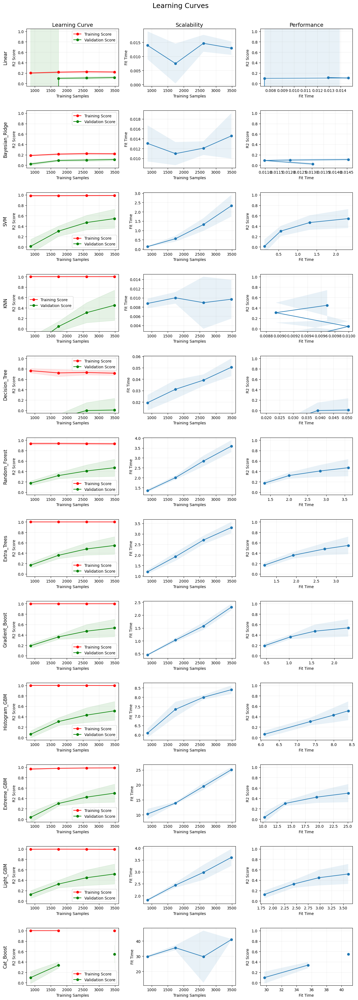

In [192]:
# learning curves
learn_curve(est_fit=best_fit, 
            X_train=X_train, 
            y_train=y_train, 
            custom_cv=custom_cv, 
            estimator_names=estimator_names)

##### 6.1.3.2 Convergence Plot

In [193]:
# create a function for plotting the convergence plot 
# to evaluate the performance of the models with increasing iteration
def convergence_plot(cv_fit, estimator_names):
    # cv_fit: list of optimizer results for all models
    # estimator_names: list of estimator names

    fig, axs = plt.subplots(figsize=(13, 9), nrows=3, ncols=4, sharex=True, sharey=True)

    for (i, ax), est in zip(enumerate(fig.axes), estimator_names):    
        plot_convergence(cv_fit[i].optimizer_results_, ax=ax)

        #if i not in range(len(estimator_names)):
            #ax.set_axis_off()

        if i in np.arange(8):
            ax.set_xlabel(None)
        else:
            ax.set_xlabel(ax.get_xlabel(), size=12)
        if i in np.arange(0, len(estimator_names), 4):
            ax.set_ylabel(ax.get_ylabel() + ' (RMSE)', size=12)
        else:
            ax.set_ylabel(None)
        ax.set_title(est, size=14)

    plt.suptitle(x=0.52, y=1.001, t='Convergence Plots', ha='center', size=18)
    plt.tight_layout()

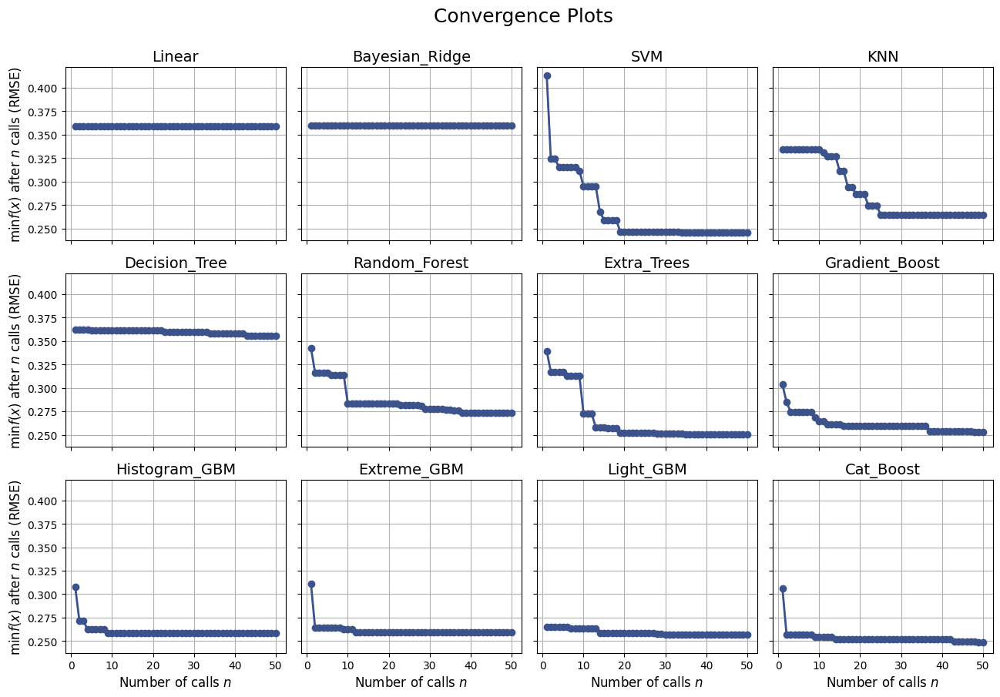

In [194]:
# convergence plot
convergence_plot(cv_fit=cv_fit, 
                 estimator_names=estimator_names)

##### 6.1.3.3 Partial Dependence Plot

In [195]:
# specify the search-space dimensions to plot for each model
# exclude linear models with no tuned hyperparameters
# exclude single value dimensions (i.e. no range for numericals or options for categoricals) 
search_spaces = [{'svr__gamma': Real(0.01, 1),
                  'svr__C': Real(0.1, 10),
                  'svr__epsilon': Real(0.01, 1)}, 
              
                 {'kneighborsregressor__n_neighbors': Integer(1, 100),
                  'kneighborsregressor__weights': Categorical(['uniform', 'distance'])}, 
              
                 {'decisiontreeregressor__max_depth': Integer(1, 100),
                  'decisiontreeregressor__min_samples_split': Integer(2, 100),
                  'decisiontreeregressor__max_features': Real(0.1, 1.0)}, 
              
                 {'randomforestregressor__n_estimators': Integer(5, 500),
                  'randomforestregressor__max_depth': Integer(1, 100),
                  'randomforestregressor__min_samples_split': Integer(2, 100),
                  'randomforestregressor__max_features': Real(0.1, 1.0)}, 
              
                 {'extratreesregressor__n_estimators': Integer(5, 500),
                  'extratreesregressor__max_depth': Integer(1, 100),
                  'extratreesregressor__min_samples_split': Integer(2, 100),
                  'extratreesregressor__max_features': Real(0.1, 1.0)}, 
              
                 {'gradientboostingregressor__n_estimators': Integer(5, 500),
                  'gradientboostingregressor__max_depth': Integer(1, 100),
                  'gradientboostingregressor__min_samples_split': Integer(2, 100),
                  'gradientboostingregressor__max_features': Real(0.1, 1.0),
                  'gradientboostingregressor__learning_rate': Real(0.01, 1.0)}, 
              
                 {'histgradientboostingregressor__max_iter': Integer(5, 500),
                  'histgradientboostingregressor__max_depth': Integer(1, 100),
                  'histgradientboostingregressor__learning_rate': Real(0.01, 1.0),
                  'histgradientboostingregressor__l2_regularization': Real(0.0, 1.0)}, 
              
                 {'xgbregressor__n_estimators': Integer(5, 500),
                  'xgbregressor__max_depth': Integer(1, 100),
                  'xgbregressor__learning_rate': Real(0.01, 1.0),
                  'xgbregressor__reg_alpha': Real(0.0, 1.0),
                  'xgbregressor__reg_lambda': Real(0.0, 1.0),
                  'xgbregressor__booster': Categorical(['gbtree', 'dart'])}, 
              
                 {'lgbmregressor__n_estimators': Integer(5, 500),
                  'lgbmregressor__max_depth': Integer(1, 100),
                  'lgbmregressor__learning_rate': Real(0.01, 1.0),
                  'lgbmregressor__reg_alpha': Real(0.0, 1.0),
                  'lgbmregressor__reg_lambda': Real(0.0, 1.0),
                  'lgbmregressor__boosting_type': Categorical(['gbdt', 'dart', 'goss'])}, 
              
                 {'catboostregressor__n_estimators': Integer(10, 1000),
                  'catboostregressor__max_depth': Integer(1, 10),
                  'catboostregressor__learning_rate': Real(0.01, 1.0),
                  'catboostregressor__reg_lambda': Real(0.0, 1.0),
                  'catboostregressor__random_strength': Real(0.01, 1.0)}]

# shorten the search-space dimension names
for i, space in enumerate(search_spaces):
    for j, key in enumerate(list(space.keys())):
        key_n = key.split('__')[-1]
        space[key_n] = space.pop(key)
    # order the dictionary keys to conform with bayessearchcv 
    # ordereddict internal structure
    search_spaces[i] = dict(sorted(search_spaces[i].items()))
        
search_spaces

[{'C': Real(low=0.1, high=10, prior='uniform', transform='identity'),
  'epsilon': Real(low=0.01, high=1, prior='uniform', transform='identity'),
  'gamma': Real(low=0.01, high=1, prior='uniform', transform='identity')},
 {'n_neighbors': Integer(low=1, high=100, prior='uniform', transform='identity'),
  'weights': Categorical(categories=('uniform', 'distance'), prior=None)},
 {'max_depth': Integer(low=1, high=100, prior='uniform', transform='identity'),
  'max_features': Real(low=0.1, high=1.0, prior='uniform', transform='identity'),
  'min_samples_split': Integer(low=2, high=100, prior='uniform', transform='identity')},
 {'max_depth': Integer(low=1, high=100, prior='uniform', transform='identity'),
  'max_features': Real(low=0.1, high=1.0, prior='uniform', transform='identity'),
  'min_samples_split': Integer(low=2, high=100, prior='uniform', transform='identity'),
  'n_estimators': Integer(low=5, high=500, prior='uniform', transform='identity')},
 {'max_depth': Integer(low=1, high=10

In [196]:
# count the number of search-space dimensions to plot for each model
no_dims = [len(list(search_spaces[i].keys())) for i in range(len(search_spaces))]
no_dims

[3, 2, 3, 4, 4, 5, 4, 6, 6, 5]

In [197]:
# create a function for plotting the partial dependence plot 
# to evaluate the influence of each search-space dimension on the objective function
def partial_dependence_plot(cv_fit, search_spaces, no_dims, estimator_names):
    # cv_fit: list of optimizer results for all models
    # search_spaces: list of search-space dimensions for all models
    # no_dims: list of count of search-space dimensions for all models
    # estimator_names: list of estimator names
    
    for i, est in enumerate(estimator_names):

        plot_objective(cv_fit[i].optimizer_results_[0], dimensions=list(search_spaces[i].keys()))

        fig = plt.gcf()
        fig.set_size_inches(2.2*no_dims[i], 2.2*no_dims[i])

        for ax in fig.get_axes():
            ax.set_xlabel(ax.get_xlabel(), size=10)
            ax.set_ylabel(ax.get_ylabel(), size=10)
            ax.grid(alpha=0.2)

        if no_dims[i] == 2:
            plt.suptitle(x=0.5, y=1.08, t=est+' PDP', ha='center', va='center', size=14)
        elif no_dims[i] == 3:
            plt.suptitle(x=0.5, y=1.06, t=est+' PDP', ha='center', va='center', size=14)
        elif no_dims[i] == 4:
            plt.suptitle(x=0.5, y=1.04, t=est+' PDP', ha='center', va='center', size=14)
        elif no_dims[i] == 5:
            plt.suptitle(x=0.5, y=1.02, t=est+' PDP', ha='center', va='center', size=14)
        elif no_dims[i] == 6:
            plt.suptitle(x=0.5, y=1.00, t=est+' PDP', ha='center', va='center', size=14)
        fig.show()

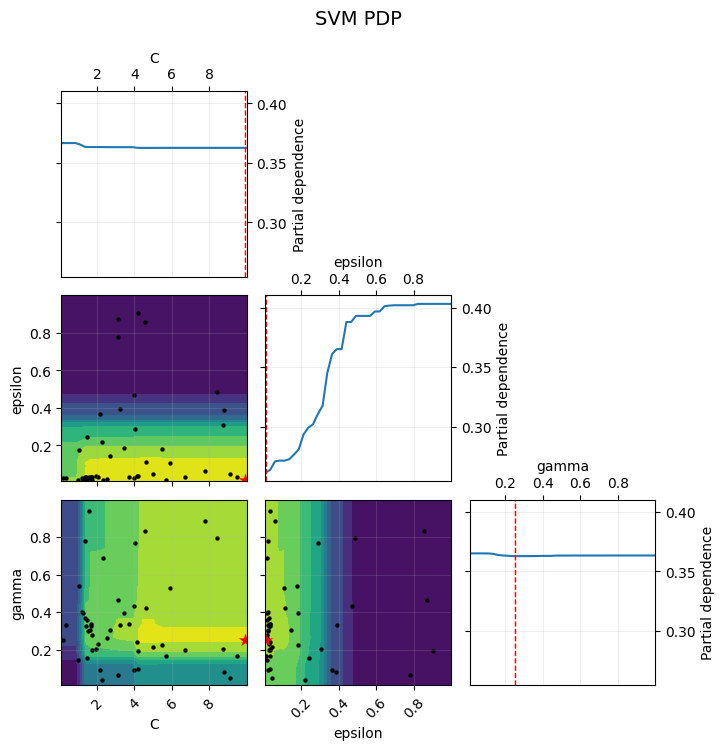

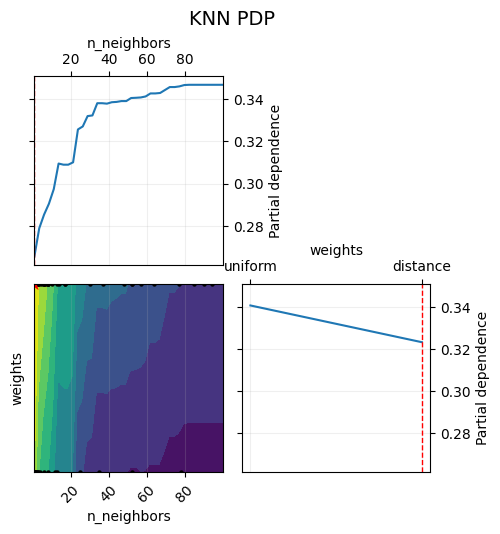

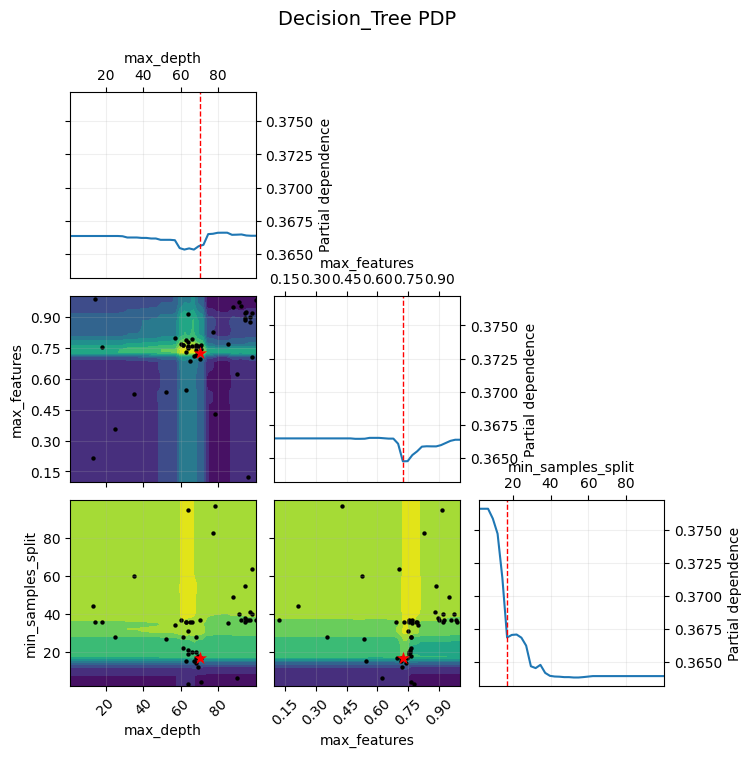

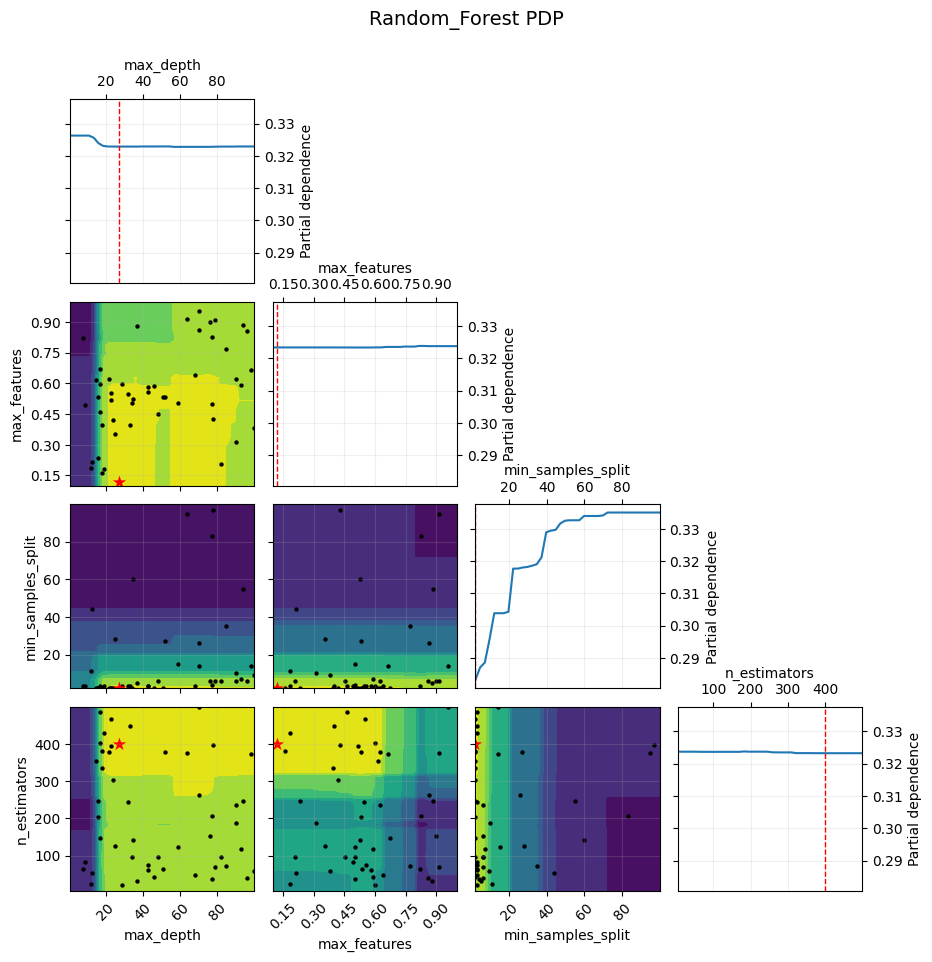

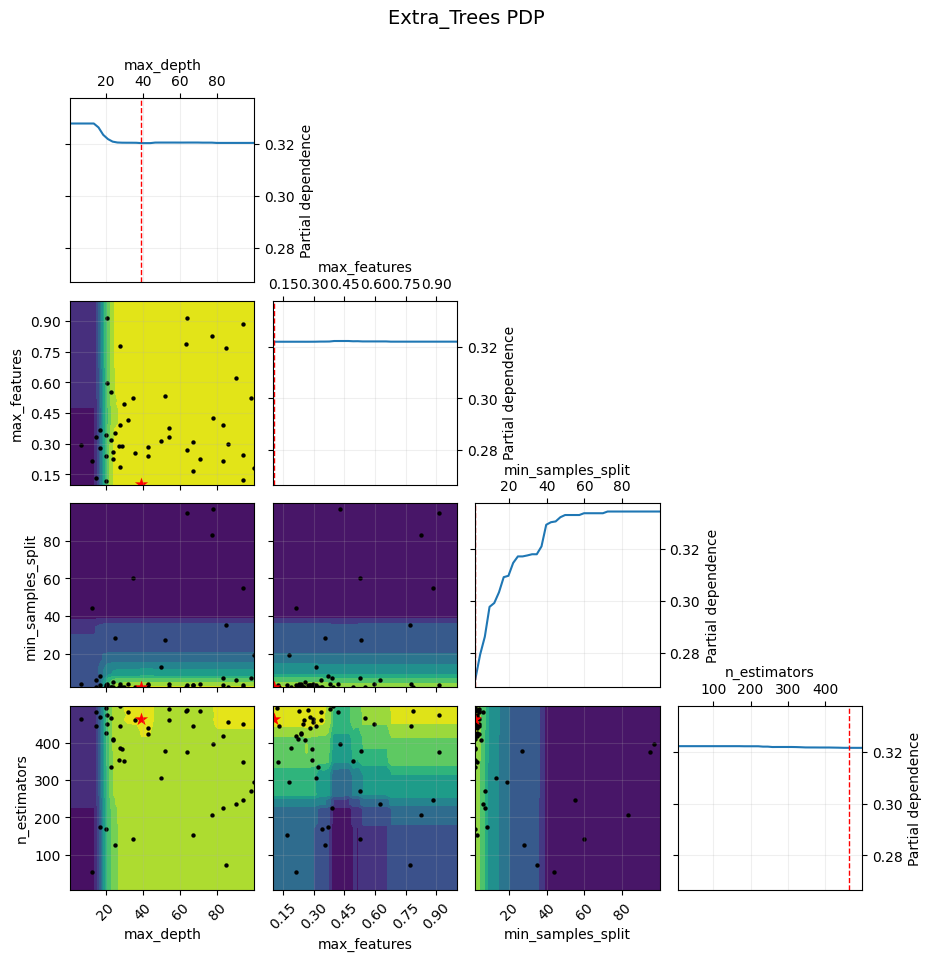

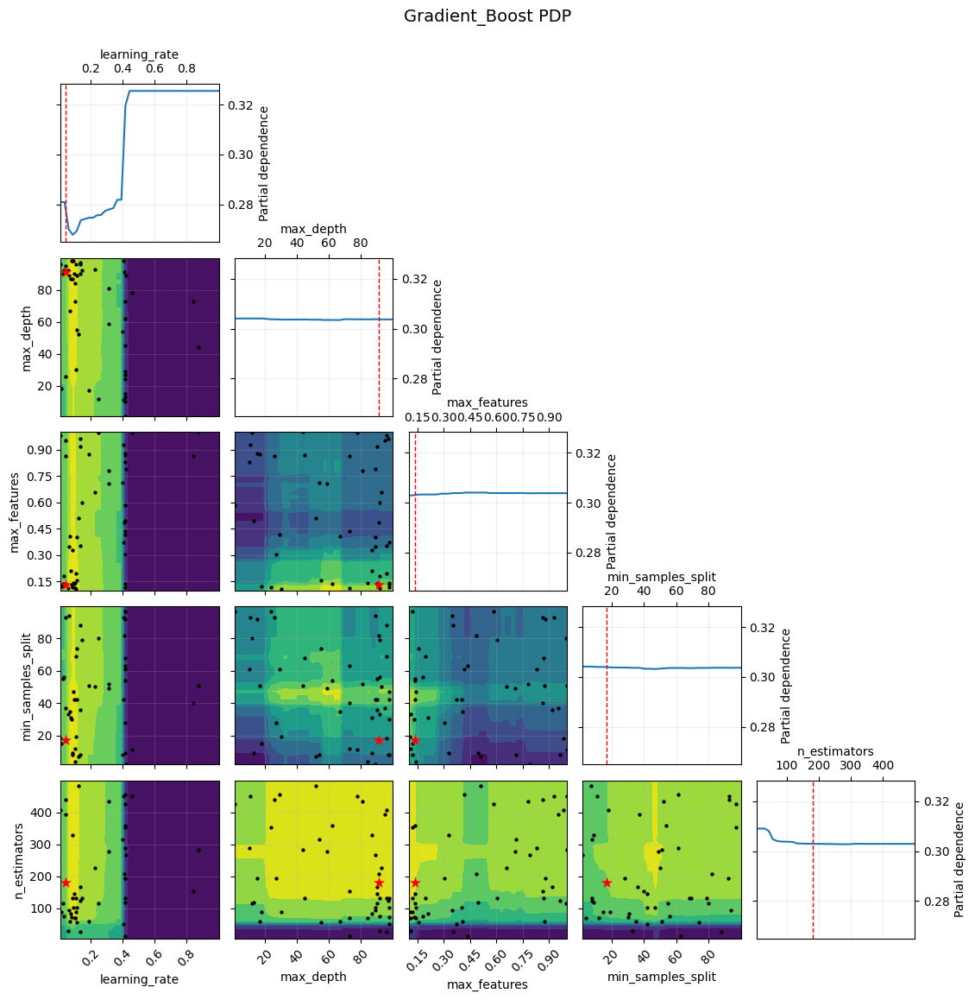

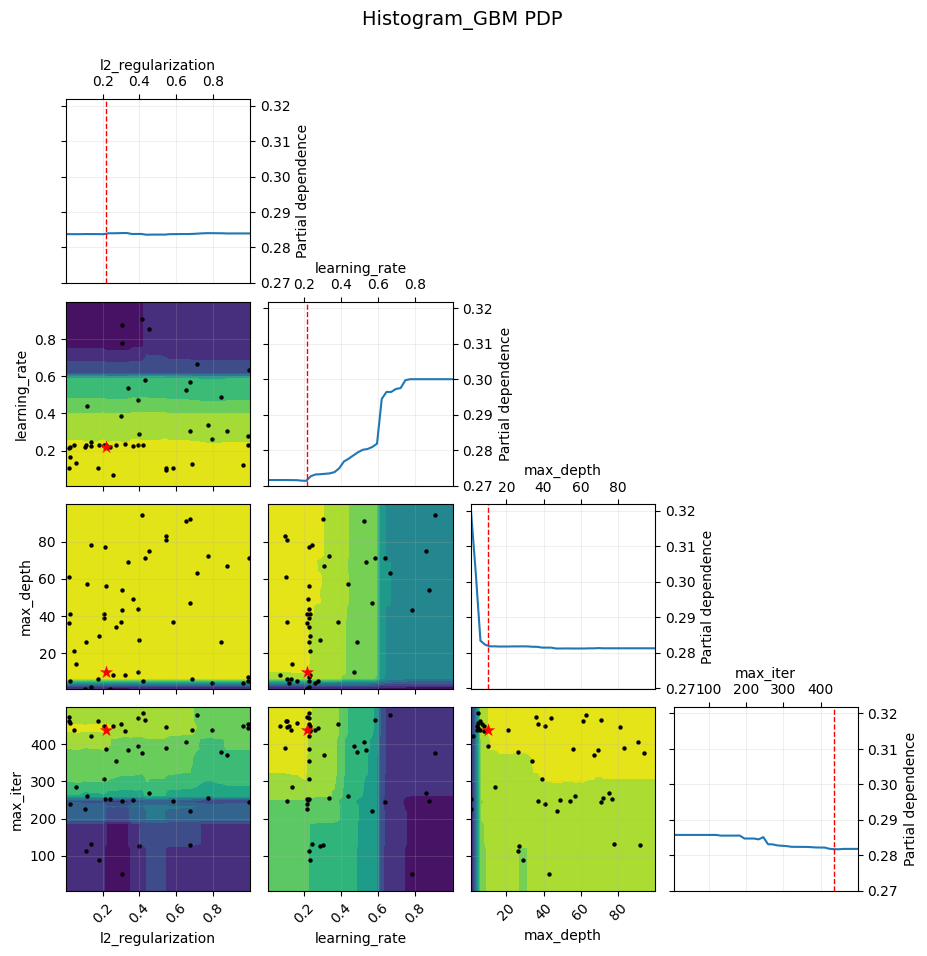

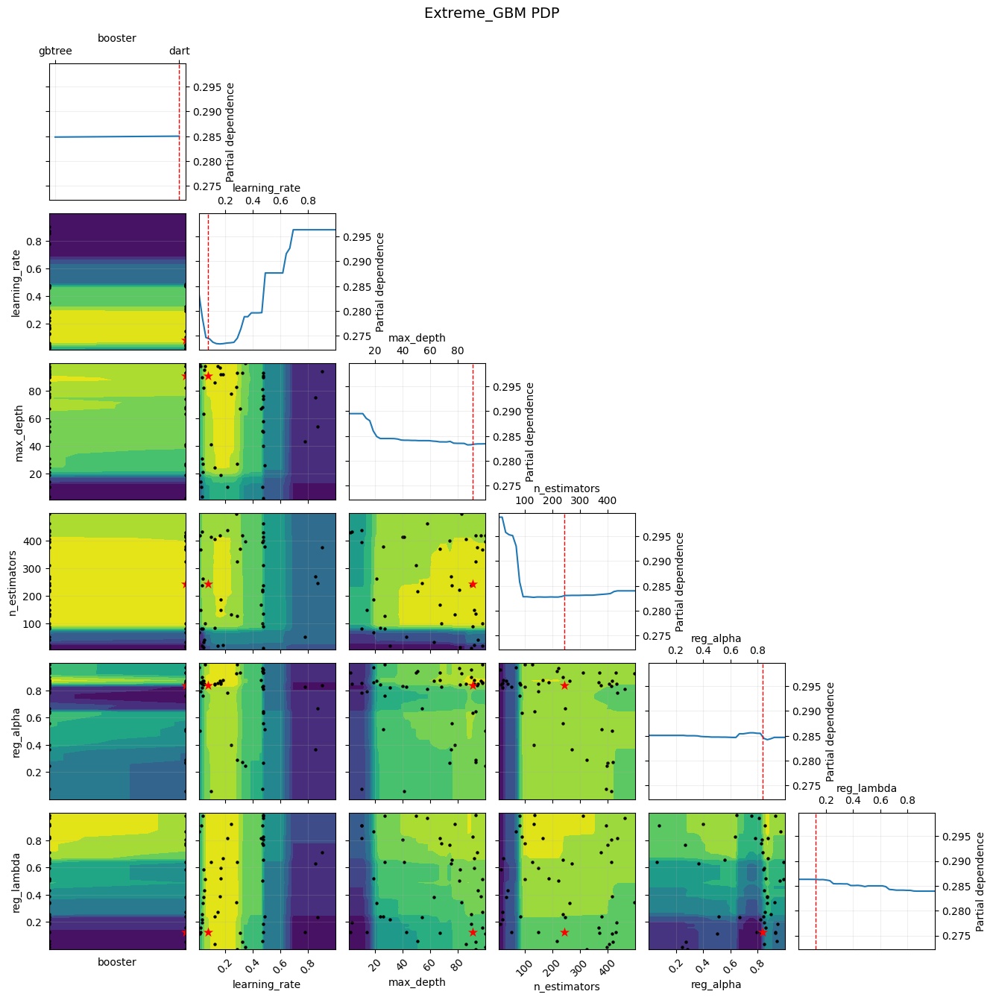

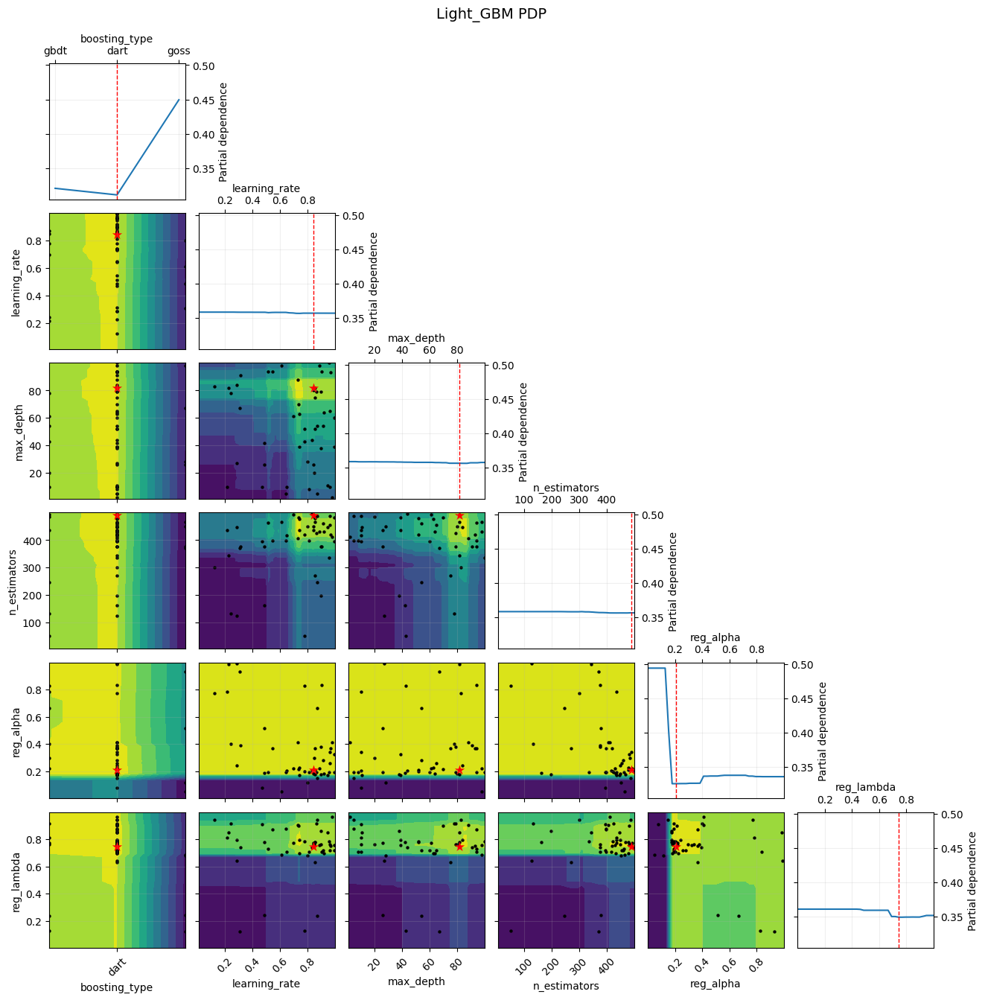

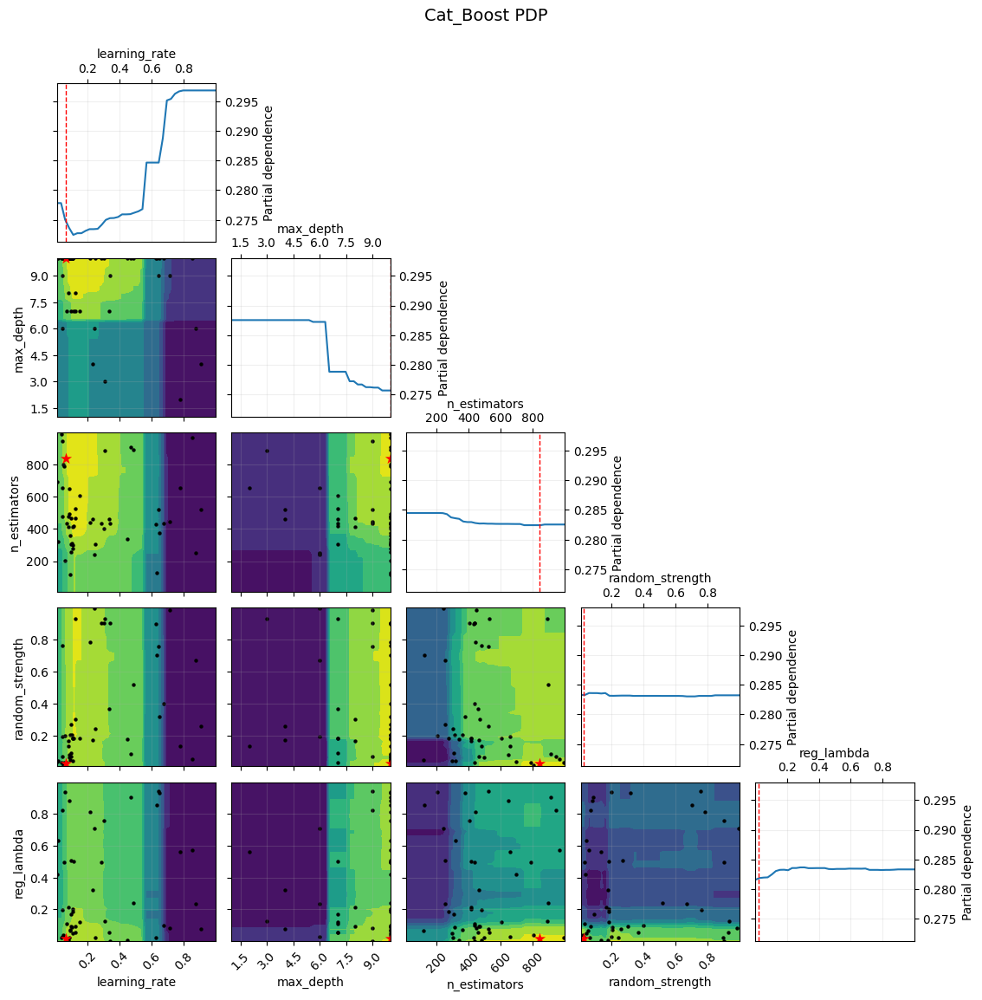

In [198]:
# partial dependence plot
partial_dependence_plot(cv_fit=cv_fit[2:], 
                        search_spaces=search_spaces, 
                        no_dims=no_dims, 
                        estimator_names=estimator_names[2:])

#### 6.1.4 Ensemble Learning

In [199]:
# create a function for plotting the ensemble metric scores
def emsemble_plot(scores, estimator_names, method):
    # scores: dataframe of all scores for the ensemble models
    # estimator_names: list of estimator names
    # method: name of the ensemble method (one of 'Voting' or 'Stacking')
    
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(13, 4))

    ax1, ax2 = fig.get_axes()
    ax1b, ax2b = ax1.twinx(), ax2.twinx()

    ax1.plot(scores.R2, label='R2', c='tab:blue', marker='o')
    ax2.plot(scores.RMSE, label='RMSE', c='tab:blue', marker='o')
    ax1b.plot(scores.R, label='R', c='tab:orange', marker='o')
    ax2b.plot(scores.MAE, label='MAE', c='tab:orange', marker='o')

    ax1.get_yaxis().set_major_formatter(FormatStrFormatter('%.3f'))
    ax2.get_yaxis().set_major_formatter(FormatStrFormatter('%.3f'))
    ax1b.get_yaxis().set_major_formatter(FormatStrFormatter('%.3f'))
    ax2b.get_yaxis().set_major_formatter(FormatStrFormatter('%.3f'))

    ax1.set_ylabel('R2 Score', size=12)
    ax2.set_ylabel('RMSE Score', size=12)
    ax1b.set_ylabel('R Score', rotation=-90, labelpad=18, size=12)
    ax2b.set_ylabel('MAE Score', rotation=-90, labelpad=18, size=12)

    ax1.set_xticklabels(estimator_names, rotation=90)
    ax2.set_xticklabels(estimator_names, rotation=90)

    ax1_yticks = np.linspace(ax1.get_ylim()[0], ax1.get_ylim()[1], 6)
    ax2_yticks = np.linspace(ax2.get_ylim()[0], ax2.get_ylim()[1], 6)
    ax1b_yticks = np.linspace(ax1b.get_ylim()[0], ax1b.get_ylim()[1], 6)
    ax2b_yticks = np.linspace(ax2b.get_ylim()[0], ax2b.get_ylim()[1], 6)

    ax1.set_yticks(ax1_yticks)
    ax2.set_yticks(ax2_yticks)
    ax1b.set_yticks(ax1b_yticks)
    ax2b.set_yticks(ax2b_yticks)

    ax1.grid(alpha=0.2)
    ax2.grid(alpha=0.2)

    ln1, lb1 = ax1.get_legend_handles_labels()
    ln2, lb2 = ax2.get_legend_handles_labels()
    ln1b, lb1b = ax1b.get_legend_handles_labels()
    ln2b, lb2b = ax2b.get_legend_handles_labels()

    ax1.legend(ln1+ln1b, lb1+lb1b)
    ax2.legend(ln2+ln2b, lb2+lb2b)

    plt.suptitle(method + ' Ensemble Scores', size=18)
    plt.tight_layout(w_pad=2)

##### 6.1.4.1 Voting Ensemble

In [200]:
# obtain the estimators for voting
vote_est = [[] for est in range(len(estimator_names))]
for i in range(len(estimator_names)):
    for j in range(i+1):
        vote_est[i].append(best_fit[int(cv_scrs_df.iloc[:, [-1]].reset_index().nsmallest(len(cv_scrs_df.index), 
                                                                                         ['test_score']).index[j])].steps[0])
vote_est

[[('kneighborsregressor',
   KNeighborsRegressor(n_neighbors=1, weights='distance'))],
 [('kneighborsregressor',
   KNeighborsRegressor(n_neighbors=1, weights='distance')),
  ('extratreesregressor',
   ExtraTreesRegressor(max_depth=39, max_features=0.10376730169631804,
                       n_estimators=464, random_state=1234))],
 [('kneighborsregressor',
   KNeighborsRegressor(n_neighbors=1, weights='distance')),
  ('extratreesregressor',
   ExtraTreesRegressor(max_depth=39, max_features=0.10376730169631804,
                       n_estimators=464, random_state=1234)),
  ('svr',
   SVR(C=9.872250858177594, epsilon=0.014957331503133714,
       gamma=0.25298855240849594))],
 [('kneighborsregressor',
   KNeighborsRegressor(n_neighbors=1, weights='distance')),
  ('extratreesregressor',
   ExtraTreesRegressor(max_depth=39, max_features=0.10376730169631804,
                       n_estimators=464, random_state=1234)),
  ('svr',
   SVR(C=9.872250858177594, epsilon=0.014957331503133714,
    

In [201]:
# specify the names of the voting estimators
vote_names = ['{}_Vote'.format(i+1) for i in range(len(estimator_names))]

In [202]:
# voting model training
vote_fit = []
for i, est in enumerate(vote_est):
    print()
    print('*******{} estimator voting ensemble******* \n'.format(i+1))
    start_time = time.time()
    
    vote_fit.append(VotingRegressor(estimators=est, 
                                    verbose=2).fit(X_train, y_train))
    
    end_time = time.time()
    print(f'Training time: {end_time - start_time} seconds')


*******1 estimator voting ensemble******* 

[Voting] ...... (1 of 1) Processing kneighborsregressor, total=   0.0s
Training time: 0.0 seconds

*******2 estimator voting ensemble******* 

[Voting] ...... (1 of 2) Processing kneighborsregressor, total=   0.0s
[Voting] ...... (2 of 2) Processing extratreesregressor, total=   6.3s
Training time: 6.316849946975708 seconds

*******3 estimator voting ensemble******* 

[Voting] ...... (1 of 3) Processing kneighborsregressor, total=   0.0s
[Voting] ...... (2 of 3) Processing extratreesregressor, total=   5.8s
[Voting] ...................... (3 of 3) Processing svr, total=  11.7s
Training time: 17.525801181793213 seconds

*******4 estimator voting ensemble******* 

[Voting] ...... (1 of 4) Processing kneighborsregressor, total=   0.0s
[Voting] ...... (2 of 4) Processing extratreesregressor, total=   6.3s
[Voting] ...................... (3 of 4) Processing svr, total=  10.5s
[Voting] ........ (4 of 4) Processing catboostregressor, total=  36.3s


In [203]:
# voting model predictions
y_pred_vote = model_pred(X_data=X_valid, 
                         est_fit=vote_fit, 
                         estimator_names=vote_names)


*******1_Vote Estimator Prediction*******
Predicting time: 0.04822373390197754 seconds

*******2_Vote Estimator Prediction*******
Predicting time: 0.4125936031341553 seconds

*******3_Vote Estimator Prediction*******
Predicting time: 2.222986936569214 seconds

*******4_Vote Estimator Prediction*******
Predicting time: 1.9475595951080322 seconds

*******5_Vote Estimator Prediction*******
Predicting time: 1.8624677658081055 seconds

*******6_Vote Estimator Prediction*******
Predicting time: 1.8904516696929932 seconds

*******7_Vote Estimator Prediction*******
Predicting time: 1.9092857837677002 seconds

*******8_Vote Estimator Prediction*******
Predicting time: 2.196869134902954 seconds

*******9_Vote Estimator Prediction*******
Predicting time: 2.4408249855041504 seconds

*******10_Vote Estimator Prediction*******
Predicting time: 2.3928511142730713 seconds

*******11_Vote Estimator Prediction*******
Predicting time: 3.1427347660064697 seconds

*******12_Vote Estimator Prediction******

In [204]:
y_pred_vote.head()

,1_Vote,2_Vote,3_Vote,4_Vote,5_Vote,6_Vote,7_Vote,8_Vote,9_Vote,10_Vote,11_Vote,12_Vote
SURV_DTE,,,,,,,,,,,,
2016-09-02,0.79,0.663901,0.681883,0.645936,0.625356,0.640119,0.664135,0.651501,0.628944,0.662883,0.637612,0.616588
2016-09-02,0.00,0.148541,0.217148,0.267283,0.278427,0.291678,0.275922,0.304456,0.300984,0.275485,0.282257,0.287591
2015-02-27,1.00,0.775605,0.812469,0.743254,0.687232,0.639789,0.634540,0.618553,0.601963,0.554403,0.523871,0.498083
2015-02-27,0.82,0.634246,0.639768,0.586663,0.590975,0.577708,0.589506,0.584496,0.566865,0.583724,0.556224,0.533201
2015-02-27,1.00,0.797943,0.919449,0.844326,0.789296,0.765014,0.739883,0.728949,0.697788,0.630759,0.598802,0.571875


In [205]:
# voting scores
vote_scrs_df = model_metric(y_true=y_valid, 
                            y_pred=y_pred_vote, 
                            estimator_names=vote_names)
vote_scrs_df.style.highlight_min(subset=['RMSE', 'MAE'], color='lightblue').highlight_max(subset=['R2', 'R'], color='pink')

,RMSE,MAE,R2,R
1_Vote,0.184879,0.071720,0.796214,0.904779
2_Vote,0.181371,0.102168,0.803876,0.897803
3_Vote,0.178206,0.099694,0.810660,0.894168
4_Vote,0.179477,0.105927,0.807949,0.894676
5_Vote,0.183357,0.113639,0.799557,0.891425
6_Vote,0.185338,0.118797,0.795201,0.891033
7_Vote,0.187924,0.122753,0.789446,0.888002
8_Vote,0.191085,0.127633,0.782303,0.886170
9_Vote,0.195202,0.133777,0.772821,0.884705
10_Vote,0.202541,0.141814,0.755418,0.878530


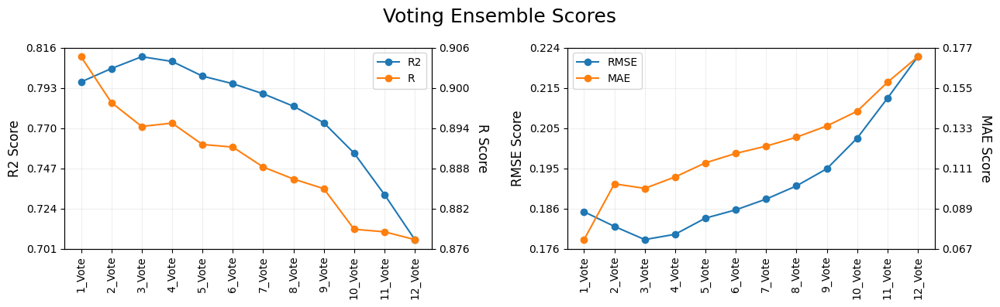

In [206]:
# voting scores plot
emsemble_plot(scores=vote_scrs_df, 
              estimator_names=vote_names, 
              method='Voting')

##### 6.1.4.2 Stacking Ensemble

In [207]:
# obtain the estimators for stacking
stack_est = [[] for est in range(len(estimator_names))]
for i in range(len(estimator_names)):
    for j in range(i+1):
        stack_est[i].append(best_fit[int(cv_scrs_df.iloc[:, [-1]].reset_index().nsmallest(len(cv_scrs_df.index), 
                                                                                          ['test_score']).index[j])].steps[0])
stack_est

[[('kneighborsregressor',
   KNeighborsRegressor(n_neighbors=1, weights='distance'))],
 [('kneighborsregressor',
   KNeighborsRegressor(n_neighbors=1, weights='distance')),
  ('extratreesregressor',
   ExtraTreesRegressor(max_depth=39, max_features=0.10376730169631804,
                       n_estimators=464, random_state=1234))],
 [('kneighborsregressor',
   KNeighborsRegressor(n_neighbors=1, weights='distance')),
  ('extratreesregressor',
   ExtraTreesRegressor(max_depth=39, max_features=0.10376730169631804,
                       n_estimators=464, random_state=1234)),
  ('svr',
   SVR(C=9.872250858177594, epsilon=0.014957331503133714,
       gamma=0.25298855240849594))],
 [('kneighborsregressor',
   KNeighborsRegressor(n_neighbors=1, weights='distance')),
  ('extratreesregressor',
   ExtraTreesRegressor(max_depth=39, max_features=0.10376730169631804,
                       n_estimators=464, random_state=1234)),
  ('svr',
   SVR(C=9.872250858177594, epsilon=0.014957331503133714,
    

In [208]:
# specify the names of the stacking estimators
stack_names = ['{}_Stack'.format(i+1) for i in range(len(estimator_names))]

In [209]:
# stacking model training
stack_final_est = RandomForestRegressor(random_state=1234)
stack_fit = []
for i, est in enumerate(stack_est):
    print()
    print('*******{} estimator stacking ensemble******* \n'.format(i+1))
    start_time = time.time()
    
    stack_fit.append(StackingRegressor(estimators=est, 
                                       final_estimator=stack_final_est, 
                                       cv='prefit', 
                                       passthrough=False, 
                                       verbose=2).fit(X_train, y_train))
    
    end_time = time.time()
    print(f'Training time: {end_time - start_time} seconds')


*******1 estimator stacking ensemble******* 

Training time: 0.9605622291564941 seconds

*******2 estimator stacking ensemble******* 

Training time: 2.7837650775909424 seconds

*******3 estimator stacking ensemble******* 

Training time: 14.50246262550354 seconds

*******4 estimator stacking ensemble******* 

Training time: 12.074959516525269 seconds

*******5 estimator stacking ensemble******* 

Training time: 12.375731945037842 seconds

*******6 estimator stacking ensemble******* 

Training time: 14.3445143699646 seconds

*******7 estimator stacking ensemble******* 

Training time: 13.454174757003784 seconds

*******8 estimator stacking ensemble******* 

Training time: 14.863146543502808 seconds

*******9 estimator stacking ensemble******* 

Training time: 18.72018265724182 seconds

*******10 estimator stacking ensemble******* 

Training time: 15.723743438720703 seconds

*******11 estimator stacking ensemble******* 

Training time: 17.454854488372803 seconds

*******12 estimator st

In [210]:
# stacking model predictions
y_pred_stack = model_pred(X_data=X_valid, 
                          est_fit=stack_fit, 
                          estimator_names=stack_names)


*******1_Stack Estimator Prediction*******
Predicting time: 0.06926226615905762 seconds

*******2_Stack Estimator Prediction*******
Predicting time: 0.38442015647888184 seconds

*******3_Stack Estimator Prediction*******
Predicting time: 1.812453269958496 seconds

*******4_Stack Estimator Prediction*******
Predicting time: 1.7581396102905273 seconds

*******5_Stack Estimator Prediction*******
Predicting time: 1.7666370868682861 seconds

*******6_Stack Estimator Prediction*******
Predicting time: 1.7624444961547852 seconds

*******7_Stack Estimator Prediction*******
Predicting time: 1.9001195430755615 seconds

*******8_Stack Estimator Prediction*******
Predicting time: 2.0531344413757324 seconds

*******9_Stack Estimator Prediction*******
Predicting time: 2.7484800815582275 seconds

*******10_Stack Estimator Prediction*******
Predicting time: 2.830173969268799 seconds

*******11_Stack Estimator Prediction*******
Predicting time: 3.102776050567627 seconds

*******12_Stack Estimator Pred

In [211]:
y_pred_stack.head()

,1_Stack,2_Stack,3_Stack,4_Stack,5_Stack,6_Stack,7_Stack,8_Stack,9_Stack,10_Stack,11_Stack,12_Stack
SURV_DTE,,,,,,,,,,,,
2016-09-02,0.79,0.7764,0.7725,0.7747,0.7740,0.7687,0.7785,0.7773,0.7703,0.7692,0.7786,0.7677
2016-09-02,0.00,0.0699,0.0518,0.0522,0.0356,0.0503,0.0413,0.0325,0.0321,0.0264,0.0288,0.0263
2015-02-27,1.00,0.9377,0.9336,0.9444,0.9459,0.9332,0.9499,0.9404,0.9379,0.9366,0.9415,0.9268
2015-02-27,0.82,0.8004,0.8020,0.8040,0.8052,0.7968,0.8053,0.8045,0.7950,0.7984,0.8051,0.7939
2015-02-27,1.00,0.9402,0.9395,0.9462,0.9483,0.9419,0.9547,0.9436,0.9436,0.9422,0.9415,0.9343


In [212]:
# stacking scores
stack_scrs_df = model_metric(y_true=y_valid, 
                             y_pred=y_pred_stack, 
                             estimator_names=stack_names)
stack_scrs_df.style.highlight_min(subset=['RMSE', 'MAE'], color='lightblue').highlight_max(subset=['R2', 'R'], color='pink')

,RMSE,MAE,R2,R
1_Stack,0.184879,0.071720,0.796214,0.904780
2_Stack,0.179225,0.080049,0.808489,0.900316
3_Stack,0.179965,0.080208,0.806905,0.900443
4_Stack,0.179986,0.079104,0.806860,0.900556
5_Stack,0.180564,0.078839,0.805617,0.900472
6_Stack,0.180202,0.079798,0.806395,0.900440
7_Stack,0.180566,0.078321,0.805613,0.900473
8_Stack,0.180983,0.078642,0.804713,0.900626
9_Stack,0.181084,0.078745,0.804494,0.900928
10_Stack,0.181176,0.079096,0.804296,0.900425


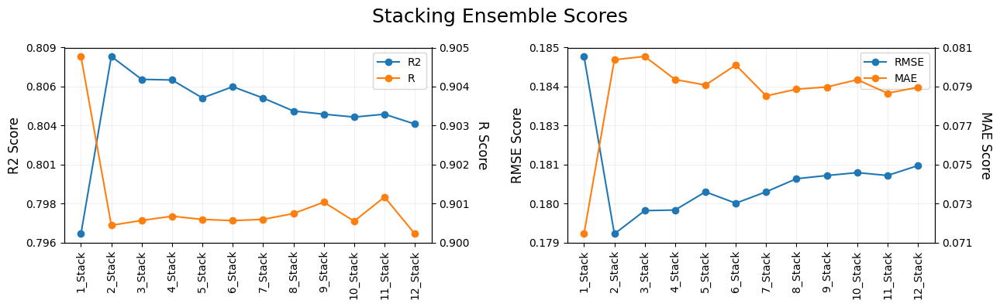

In [213]:
# stacking scores plot
emsemble_plot(scores=stack_scrs_df, 
              estimator_names=stack_names, 
              method='Stacking')

### 6.2 Model Inspection and Visualization

In [214]:
from sklearn.inspection import permutation_importance
from matplotlib.ticker import MaxNLocator

#### 6.2.1 Inspection Plots

##### 6.2.1.1 Density Plot

In [215]:
# plot the density plots to compare the distribution and trend of the predicted data to the true data
def density_plot(y_true, y_pred, estimator_names, method):
    # y_true: true target
    # y_pred: predicted target
    # estimator_names: list of estimator names
    # method: name of the ensemble method (one of 'Base', Voting' or 'Stacking')
    
    fig, axs = plt.subplots(figsize=(13, 7), nrows=3, ncols=4, sharex=True, sharey=True)

    for (i, ax), est in zip(enumerate(fig.axes), estimator_names):    
        sns.kdeplot(data=y_true, x=targ_cols[0], label='True', lw=2, ax=ax)
        sns.kdeplot(data=y_pred.iloc[:, [i]], x=est, label='Predicted', lw=2, ax=ax)

        #if i not in range(len(estimator_names)):
            #ax.set_axis_off()

        ax.set(xlabel=None)
        ax.set(ylabel='Density')
        ax.set_title(est, size=12)
        ax.grid(alpha=0.2)
        ax.legend(fontsize='small')
        max_y = ax.get_ylim()[-1]
        range_y = ax.get_ylim()[-1]-ax.get_ylim()[0]
        ax.set_ylim([0, max_y+range_y/50])

    #axs[2,3].set_axis_off()

    plt.suptitle(x=0.52, y=1.001, t=method + ' Density Plots', ha='center', size=18)
    plt.tight_layout()

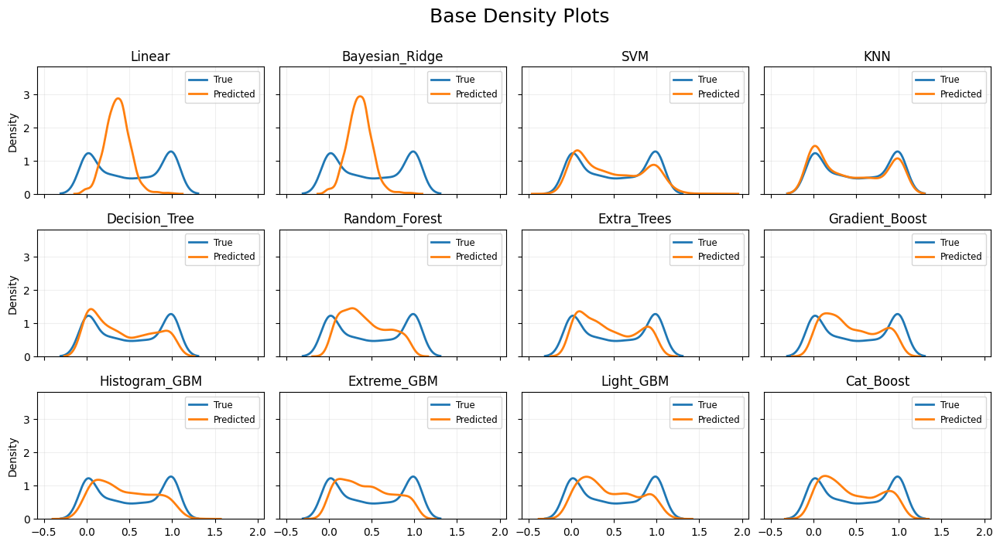

In [216]:
# base density plot
density_plot(y_true=y_valid, 
             y_pred=y_pred, 
             estimator_names=estimator_names, 
             method='Base')

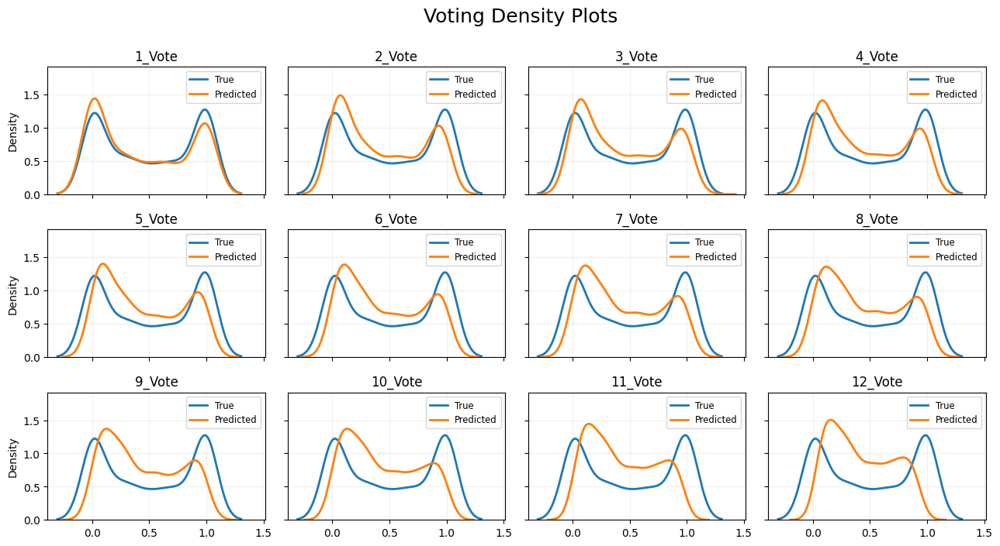

In [217]:
# voting density plot
density_plot(y_true=y_valid, 
             y_pred=y_pred_vote, 
             estimator_names=vote_names, 
             method='Voting')

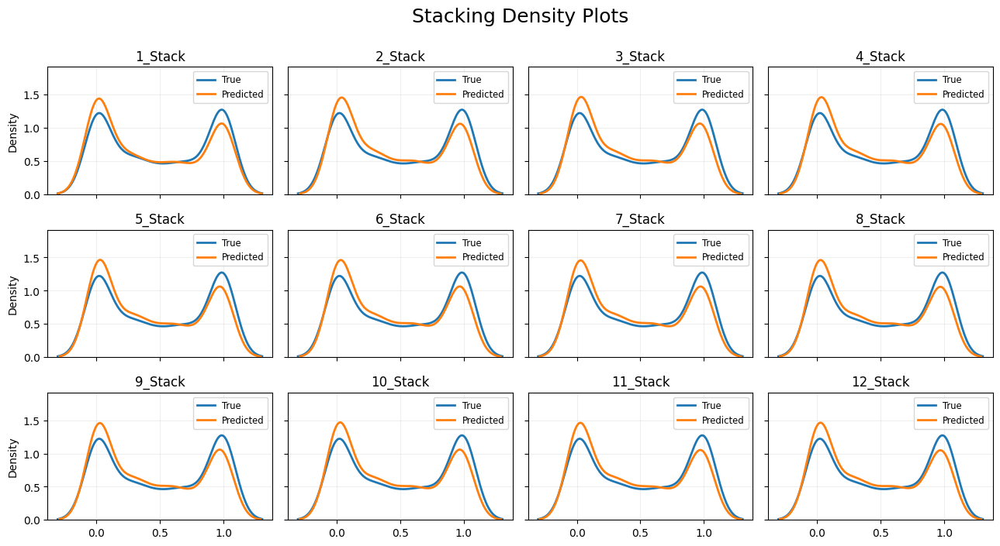

In [218]:
# stacking density plot
density_plot(y_true=y_valid, 
             y_pred=y_pred_stack, 
             estimator_names=stack_names, 
             method='Stacking')

##### 6.2.1.2 Correlation Plot

In [219]:
# plot the correlation plots to inspect the relationship and correlation between the predicted data and the true data
def correlation_plot(y_true, y_pred, estimator_names, method):
    # y_true: true target
    # y_pred: predicted target
    # estimator_names: list of estimator names
    # method: name of the ensemble method (one of 'Base', Voting' or 'Stacking')
    
    fig, axs = plt.subplots(figsize=(13, 10), nrows=3, ncols=4, sharex=True, sharey=True)

    for (i, ax), est in zip(enumerate(fig.axes), estimator_names):    
        sns.scatterplot(x=y_true[targ_cols[0]], y=y_pred.iloc[:, i], ax=ax)

        #if i not in range(len(estimator_names)):
            #ax.set_axis_off()

        ax.plot([0, 1], [0, 1], transform=ax.transAxes, c='k', lw=1.5)
        ax.set(xlabel='True')
        ax.set(ylabel='Pred')
        ax.set_title(est, size=12)
        ax.grid(alpha=0.2)
        max_axis = y_true.max().values
        min_axis = y_true.min().values
        range_axis = y_true.max().values-y_true.min().values
        ax.set_xlim([min_axis-range_axis/10, max_axis+range_axis/10])
        ax.set_ylim([min_axis-range_axis/10, max_axis+range_axis/10])
        ax.set_aspect(1.0 / ax.get_data_ratio(), adjustable='box')
        ax.xaxis.set_major_locator(MaxNLocator(5)) 
        ax.yaxis.set_major_locator(MaxNLocator(5)) 

    #axs[2,3].set_axis_off()

    plt.suptitle(x=0.52, y=1.001, t=method + ' Cross Plots', size=18)
    plt.tight_layout()

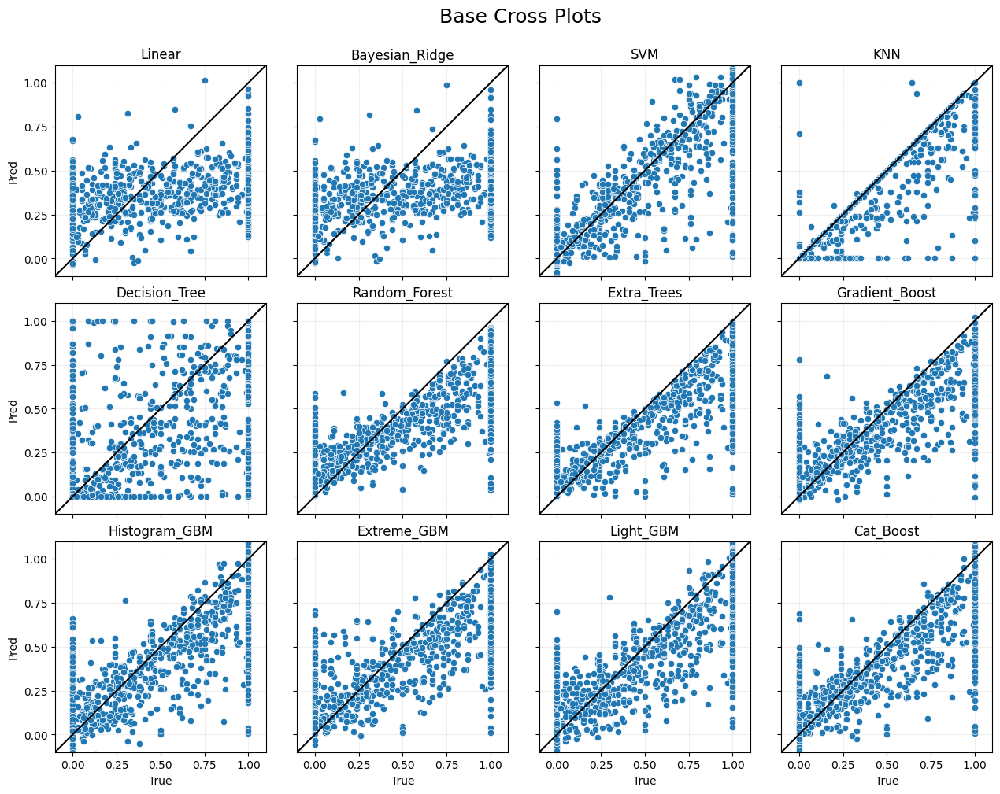

In [220]:
# base correlation plot
correlation_plot(y_true=y_valid, 
                 y_pred=y_pred, 
                 estimator_names=estimator_names, 
                 method='Base')

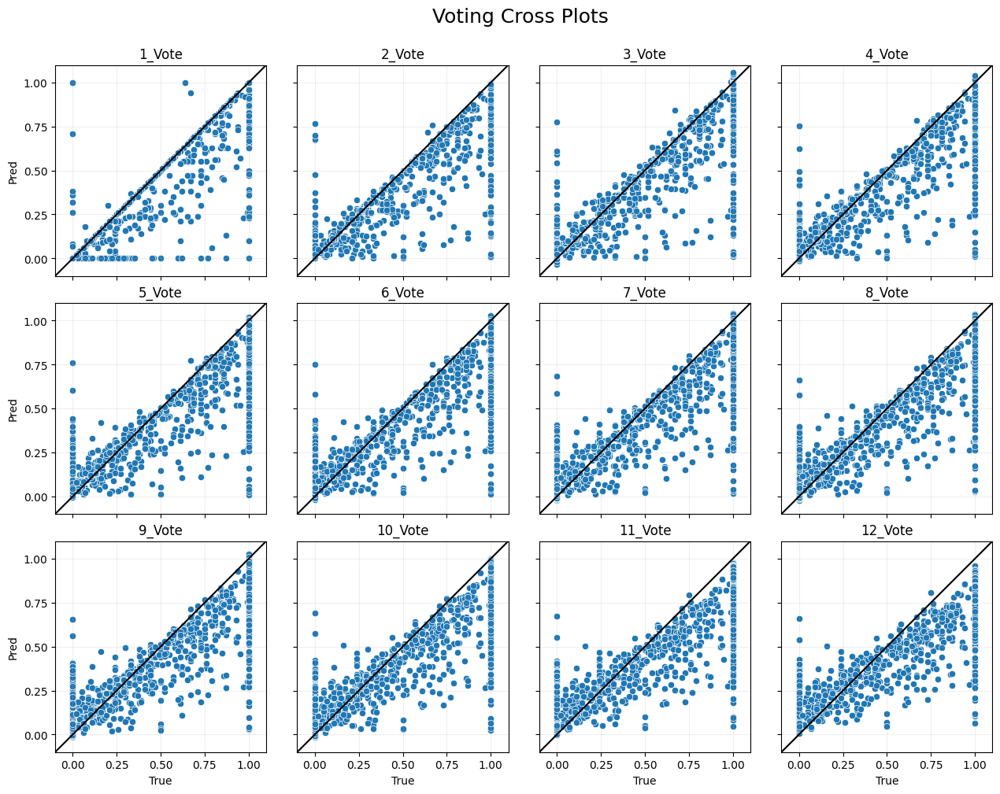

In [221]:
# voting correlation plot
correlation_plot(y_true=y_valid, 
                 y_pred=y_pred_vote, 
                 estimator_names=vote_names, 
                 method='Voting')

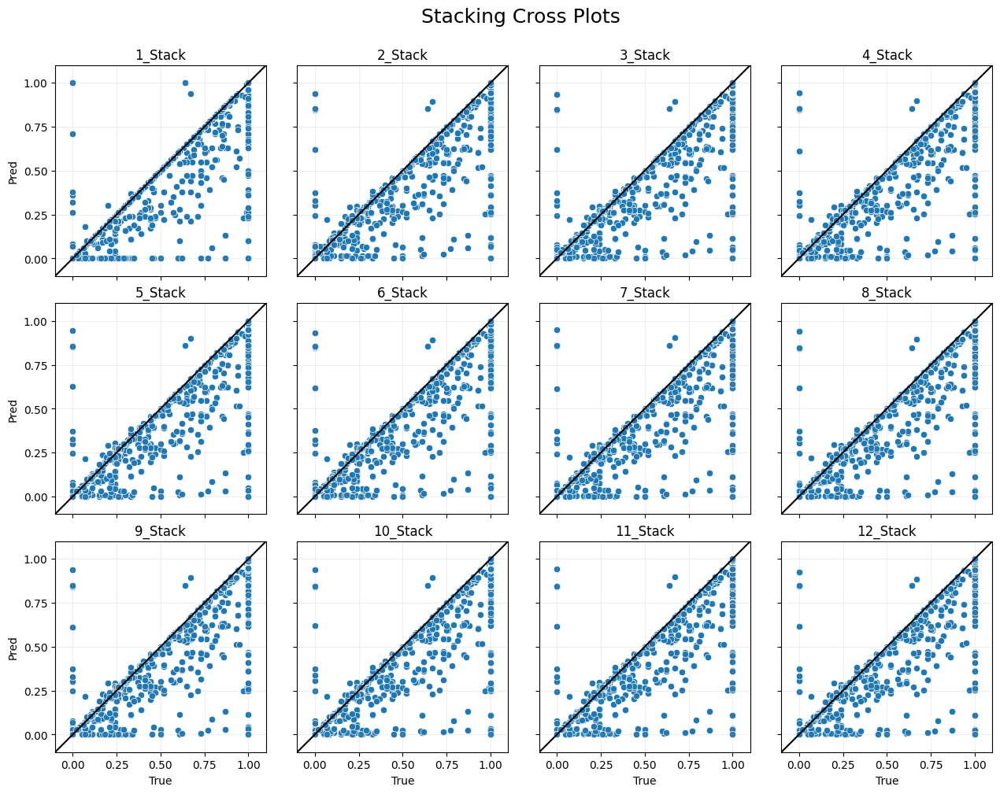

In [222]:
# stack correlation plot
correlation_plot(y_true=y_valid, 
                 y_pred=y_pred_stack, 
                 estimator_names=stack_names, 
                 method='Stacking')

##### 6.2.1.3 Residual Plot

In [223]:
# plot the residual plots to inspect the amount of deviation of the predicted data from the true data
def residual_plot(y_true, y_pred, estimator_names, method):
    # y_true: true target
    # y_pred: predicted target
    # estimator_names: list of estimator names
    # method: name of the ensemble method (one of 'Base', Voting' or 'Stacking')
    
    fig, axs = plt.subplots(figsize=(13, 25), nrows=y_pred.shape[1], sharex=False, sharey=True)

    y_res = y_pred.copy()
    y_res = y_res.reset_index(drop=True)
    for est in y_res.columns.unique():
        y_res[est] = y_res[est] - y_true.reset_index(drop=True)[targ_cols[0]]

    for (i, ax), est in zip(enumerate(fig.axes), estimator_names):    
        sns.scatterplot(data=y_res[est], x=y_res[est].index, y=y_res[est].values, 
                        color='red', edgecolors=None, label='Residual', ax=ax)

        ax.set(xlabel='Index')
        ax.set(ylabel=None)
        ax.set_title(est, size=12)
        ax.grid(alpha=0.2)
        ax.legend(fontsize='small', loc='upper left')
        max_y = y_true.max().values
        range_y = y_true.max().values-y_true.min().values
        ax.set_ylim([-max_y-range_y/10, max_y+range_y/10])
        ax.locator_params('x', integer=True)
        ax.axhline(0, c='k', lw=1)
    
    plt.suptitle(x=0.52, y=1.001, t=method + ' Residual Plots', ha='center', size=18)
    plt.tight_layout(h_pad=2.0)

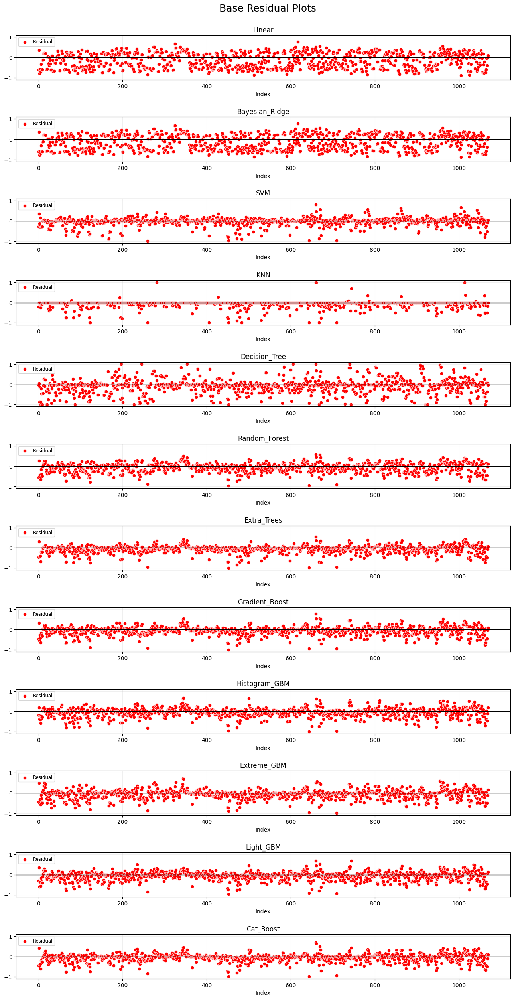

In [224]:
# base residual plot
residual_plot(y_true=y_valid, 
              y_pred=y_pred, 
              estimator_names=estimator_names, 
              method='Base')

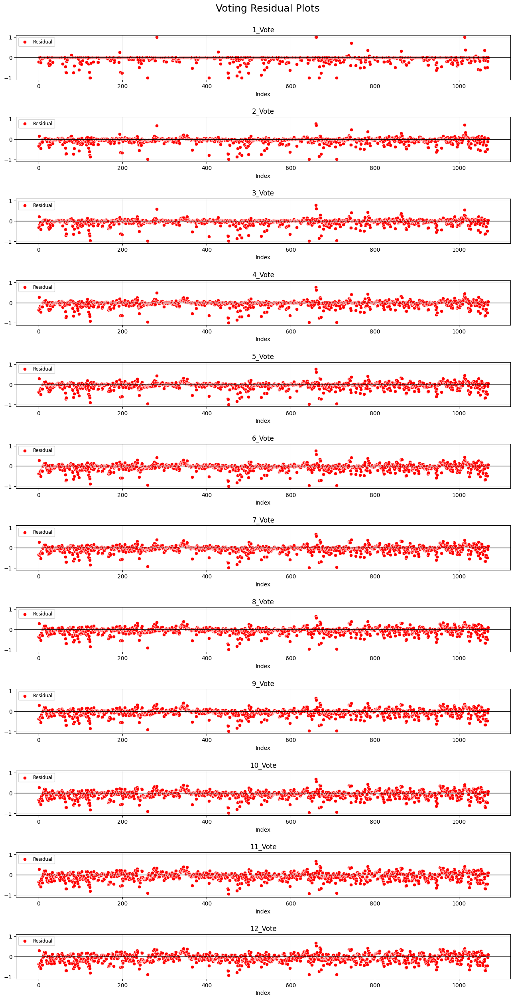

In [225]:
# voting residual plot
residual_plot(y_true=y_valid, 
              y_pred=y_pred_vote, 
              estimator_names=vote_names, 
              method='Voting')

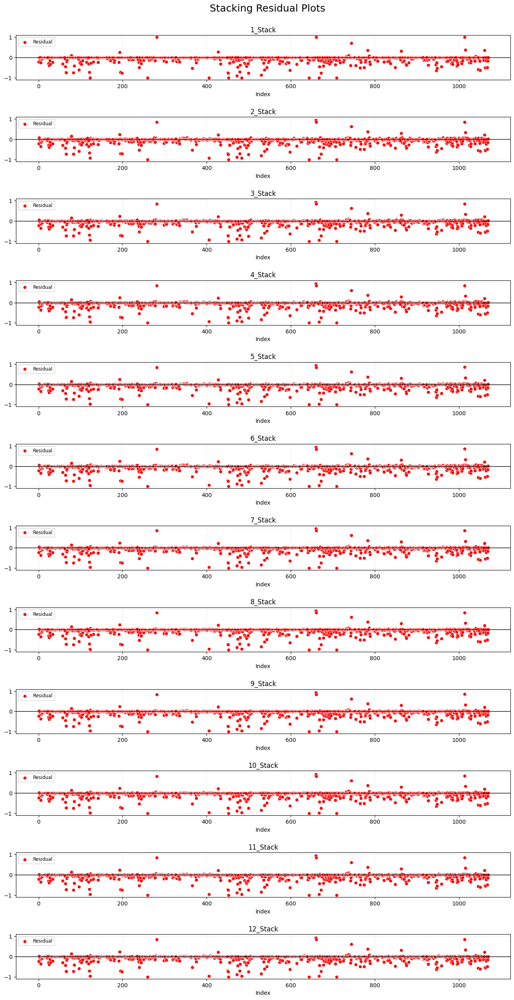

In [226]:
# stacking residual plot
residual_plot(y_true=y_valid, 
              y_pred=y_pred_stack, 
              estimator_names=stack_names, 
              method='Stacking')

##### 6.2.1.4 Gap Plot

In [227]:
# plot the gap plots to compare the predicted data and the true data
def gap_plot(y_true, y_pred, estimator_names, method, well_sand_idx, sand, well):
    # y_true: true target
    # y_pred: predicted target
    # estimator_names: list of estimator names
    # method: name of the ensemble method (one of 'Base', Voting' or 'Stacking')
    # well_sand_idx: well and sand indices of the dataframe
    # sand: choice of sand to inspect
    # well: choice of well to inspect
    
    y_true_n = pd.concat([well_sand_idx, y_true], axis=1)
    y_pred_n = pd.concat([well_sand_idx, y_pred], axis=1)
    y_true_n = y_true_n.reset_index(drop=True)
    y_pred_n = y_pred_n.reset_index(drop=True)
    if sand != None:
        y_true_n = y_true_n.set_index('SAND').loc[np.ravel(sand)]
        y_pred_n = y_pred_n.set_index('SAND').loc[np.ravel(sand)]
    elif well != None:
        y_true_n = y_true_n.set_index('CMPL_FAC_ID').loc[np.ravel(well)]
        y_pred_n = y_pred_n.set_index('CMPL_FAC_ID').loc[np.ravel(well)]
    y_true_n = y_true_n.reset_index(drop=True)
    y_pred_n = y_pred_n.reset_index(drop=True)
    
    colors = cm.get_cmap('tab10').colors + cm.get_cmap('Dark2').colors
    
    fig, axs = plt.subplots(figsize=(13, 25), nrows=y_pred.shape[1], sharex=False, sharey=True)

    for (i, ax), est in zip(enumerate(fig.axes), estimator_names): 
        sns.lineplot(data=y_true_n, ax=ax, 
                     x=y_true_n.index, y=y_true_n[targ_cols[0]], 
                     label='True', 
                     ls=' ', 
                     color='k', 
                     marker='o', 
                     markersize=7, 
                     markerfacecolor='k')
        sns.lineplot(data=y_pred_n, ax=ax, 
                     x=y_pred_n.index, y=est, 
                     label='Predicted', 
                     ls=' ', 
                     marker='o', 
                     markersize=7)
        ax.fill_between(x=y_true_n.index, 
                        y1=y_true_n[targ_cols[0]], 
                        y2=y_pred_n[est], 
                        label='Gap', 
                        color='red', 
                        alpha=0.2)

        ax.set(xlabel='Index')
        ax.set(ylabel=None)
        ax.set_title(est, size=12)
        ax.grid(alpha=0.2)
        ax.legend(loc=(1.005, 0.0))
        max_y = ax.get_ylim()[-1]
        min_y = ax.get_ylim()[0]
        range_y = ax.get_ylim()[-1]-ax.get_ylim()[0]
        ax.set_ylim([min_y-range_y/200, max_y+range_y/200])
        ax.locator_params('x', integer=True)

    if sand != None:    
        plt.suptitle(x=0.5, y=1.001, t=method + ' Gap Plots: {} Sand'.format(sand), ha='center', size=18)
    elif well != None:    
        plt.suptitle(x=0.5, y=1.001, t=method + ' Gap Plots: {} Well'.format(well), ha='center', size=18)
    plt.tight_layout(h_pad=2.0)

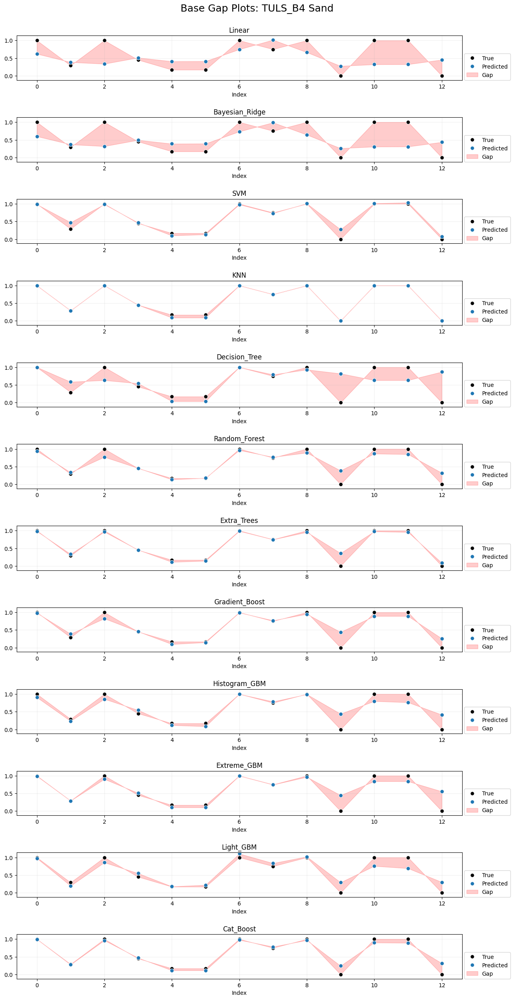

In [228]:
# base gap plot
gap_plot(y_true=y_valid, 
         y_pred=y_pred, 
         estimator_names=estimator_names, 
         method='Base', 
         well_sand_idx=X_steam_imputed_valid[['CMPL_FAC_ID', 'SAND']], 
         sand=np.unique(X_steam_imputed_valid.SAND)[3], 
         well=None)

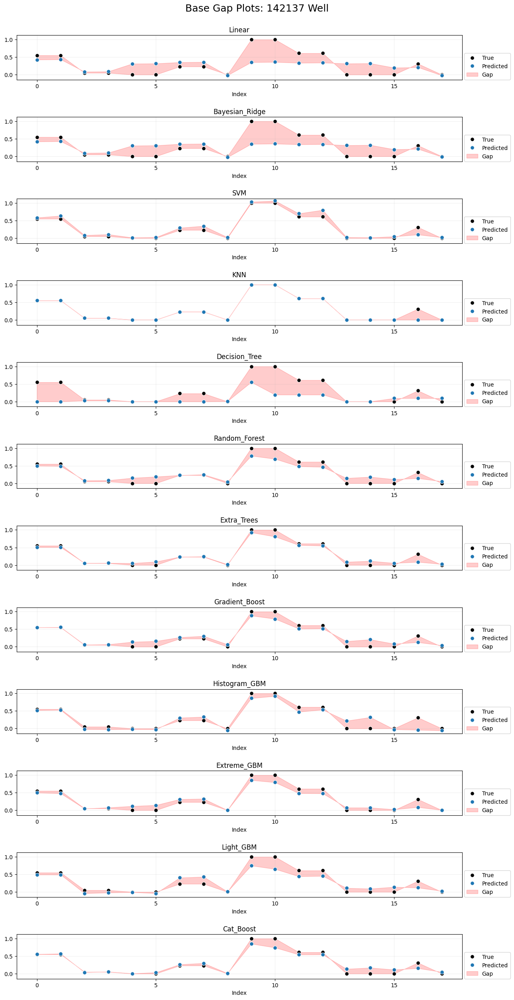

In [229]:
# base gap plot
gap_plot(y_true=y_valid, 
         y_pred=y_pred, 
         estimator_names=estimator_names, 
         method='Base', 
         well_sand_idx=X_steam_imputed_valid[['CMPL_FAC_ID', 'SAND']], 
         sand=None, 
         well=np.unique(X_steam_imputed_valid.CMPL_FAC_ID)[3])

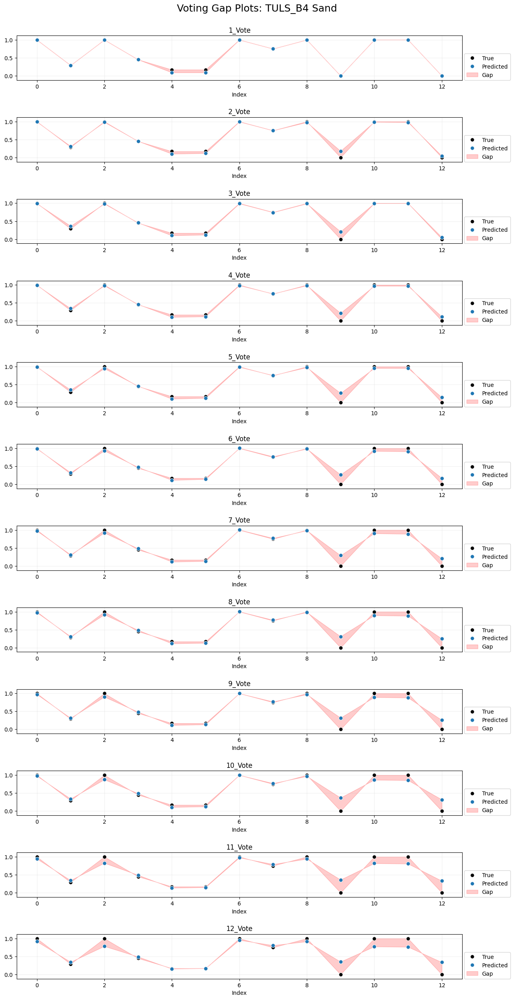

In [230]:
# voting gap plot
gap_plot(y_true=y_valid, 
         y_pred=y_pred_vote, 
         estimator_names=vote_names, 
         method='Voting', 
         well_sand_idx=X_steam_imputed_valid[['CMPL_FAC_ID', 'SAND']], 
         sand=np.unique(X_steam_imputed_valid.SAND)[3], 
         well=None)

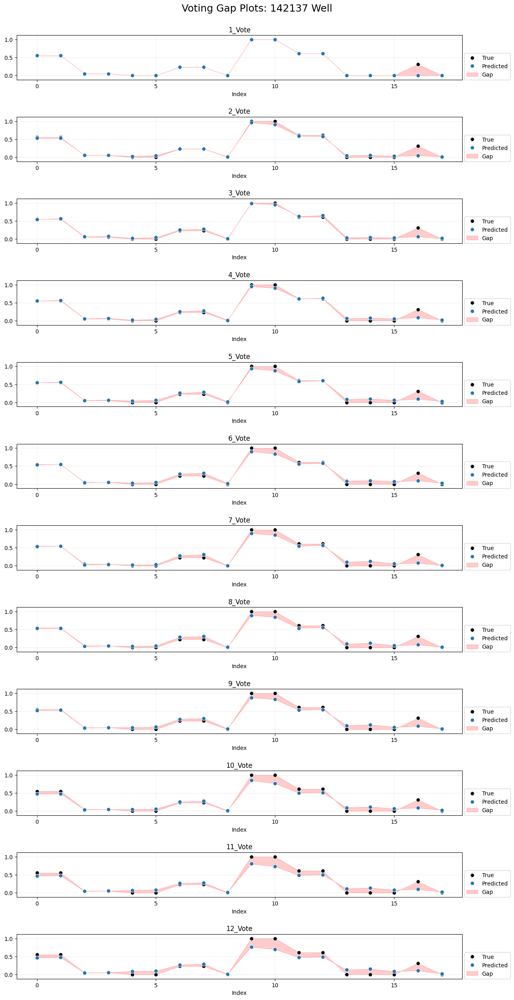

In [231]:
# voting gap plot
gap_plot(y_true=y_valid, 
         y_pred=y_pred_vote, 
         estimator_names=vote_names, 
         method='Voting', 
         well_sand_idx=X_steam_imputed_valid[['CMPL_FAC_ID', 'SAND']], 
         sand=None, 
         well=np.unique(X_steam_imputed_valid.CMPL_FAC_ID)[3])

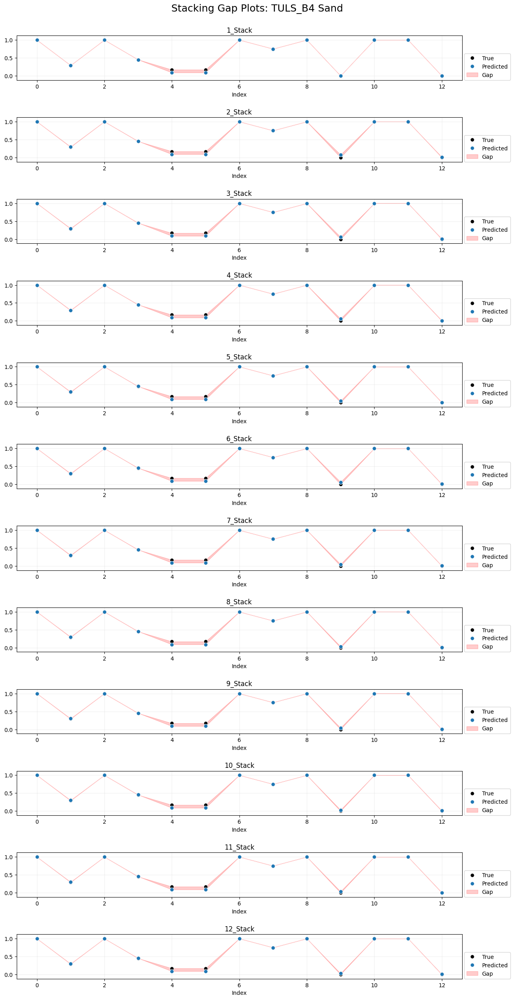

In [232]:
# stacking gap plot
gap_plot(y_true=y_valid, 
         y_pred=y_pred_stack, 
         estimator_names=stack_names, 
         method='Stacking', 
         well_sand_idx=X_steam_imputed_valid[['CMPL_FAC_ID', 'SAND']], 
         sand=np.unique(X_steam_imputed_valid.SAND)[3], 
         well=None)

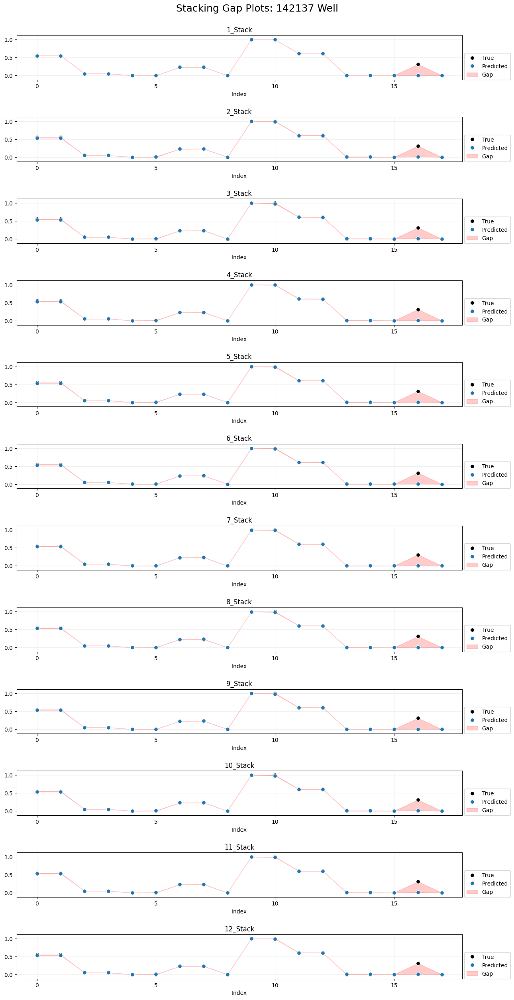

In [233]:
# stacking gap plot
gap_plot(y_true=y_valid, 
         y_pred=y_pred_stack, 
         estimator_names=stack_names, 
         method='Stacking', 
         well_sand_idx=X_steam_imputed_valid[['CMPL_FAC_ID', 'SAND']], 
         sand=None, 
         well=np.unique(X_steam_imputed_valid.CMPL_FAC_ID)[3])

#### 6.2.2 Feature Importance

##### 6.2.2.1 Permutation Feature Importance (PFI)

Permutation Feature Imporatance (PFI) is a measure of the increase in predictive error of a model when a single feature is permuted (shuffled). That is the order of values in a single feature column is randomly re-ordered while keeping all other feature columns and the target column intact. Randomly shuffling a feature breaks the relationship between the feature and the target which allows an estimation of feature dependency. A model is reliant on a feature if permuting the feature leads to a reduction in the model score or increase in error. The feature is unimportant to the model if permuting it leaves the model score unchanged or better. PFI can be applied to evaluate the importance of features to any fitted estimator, and so is flexible for model evaluation.

In [234]:
# create a function for obtaining the permutation feature importance scores for each method
def pfi_scores(est_fit, X_valid, y_valid, estimator_names):
    # est_fit: fitted estimators to be examined
    # X_valid: validation features
    # y_valid: validation target
    # estimator_names: list of estimator names
    
    model_pfi = [est for est in est_fit]

    for i, est in enumerate(estimator_names):
        print()
        print('*******{} estimator PFI******* \n'.format(estimator_names[i]))
        start_time = time.time()

        model_pfi[i] = permutation_importance(estimator=est_fit[i], X=X_valid, y=y_valid, 
                                              scoring='neg_root_mean_squared_error', n_repeats=5, 
                                              random_state=1234, max_samples=1.0)

        end_time = time.time()
        print(f'Training time: {end_time - start_time} seconds')
        
    pfi_sorted_idx = [est for est in est_fit]
    pfi_mean = [est for est in est_fit]
    pfi_std = [est for est in est_fit]
    pfi_score = [est for est in est_fit]

    pfi_mean_df_lst = []
    pfi_score_df_lst = []

    for i in range(len(model_pfi)):
        pfi_sorted_idx[i] = model_pfi[i].importances_mean.argsort()[::-1]
        pfi_mean[i] = model_pfi[i].importances_mean[pfi_sorted_idx[i]]
        pfi_std[i] = model_pfi[i].importances_std[pfi_sorted_idx[i]]
        pfi_score[i] = model_pfi[i].importances[pfi_sorted_idx[i]].T

        pfi_mean_df_lst.append(pd.DataFrame(pfi_mean[i], 
                                            index=X_valid.columns[pfi_sorted_idx[i]], 
                                            columns=[estimator_names[i]]).T)
        pfi_score_df_lst.append(pd.DataFrame(pfi_score[i], 
                                             columns=X_valid.columns[pfi_sorted_idx[i]]))
        
    return pfi_mean_df_lst, pfi_std, pfi_score_df_lst

In [235]:
# permutaion feature importance
pfi_mean, pfi_std, pfi_score = pfi_scores(est_fit=best_fit, 
                                          X_valid=X_valid, 
                                          y_valid=y_valid, 
                                          estimator_names=estimator_names)


*******Linear estimator PFI******* 

Training time: 0.967693567276001 seconds

*******Bayesian_Ridge estimator PFI******* 

Training time: 0.9956860542297363 seconds

*******SVM estimator PFI******* 

Training time: 259.629962682724 seconds

*******KNN estimator PFI******* 

Training time: 8.300787448883057 seconds

*******Decision_Tree estimator PFI******* 

Training time: 1.2211296558380127 seconds

*******Random_Forest estimator PFI******* 

Training time: 33.88524389266968 seconds

*******Extra_Trees estimator PFI******* 

Training time: 49.02244544029236 seconds

*******Gradient_Boost estimator PFI******* 

Training time: 9.714440107345581 seconds

*******Histogram_GBM estimator PFI******* 

Training time: 10.95954942703247 seconds

*******Extreme_GBM estimator PFI******* 

Training time: 38.02693223953247 seconds

*******Light_GBM estimator PFI******* 

Training time: 6.800947904586792 seconds

*******Cat_Boost estimator PFI******* 

Training time: 3.5731899738311768 seconds


In [236]:
# create a function for plotting the barplots of the permutation feature importance scores for each method
def pfi_barplot(mean, std, estimator_names):
    # mean: list of dataframes of mean scores
    # std: standard deviations
    # estimator_names: list of estimator names
    
    # plot the barplot to compare the mean importance of the features
    fig, axs = plt.subplots(figsize=(13, 4*len(mean)), nrows=len(mean), sharey=False)
    
    colors = cm.get_cmap('tab10').colors + cm.get_cmap('Dark2').colors
    
    for (i, ax), est in zip(enumerate(fig.axes), estimator_names):
        sns.barplot(data=mean[i], yerr=std[i], orient='v', color=colors[1:][i], ax=ax)

        ax.set_xlabel('Feature', size=12)
        ax.set_ylabel('Mean Importance', size=12)
        ax.set_xticklabels(ax.get_xticklabels(), ha='center', rotation='90')
        #ax.set_yscale('log')
        ax.set_title(est, size=14)
        ax.grid(which='major', alpha=0.2)

    plt.suptitle(y=1.005, t='Permutation Feature Importance Barplots', size=18)
    plt.tight_layout(h_pad=3.0)

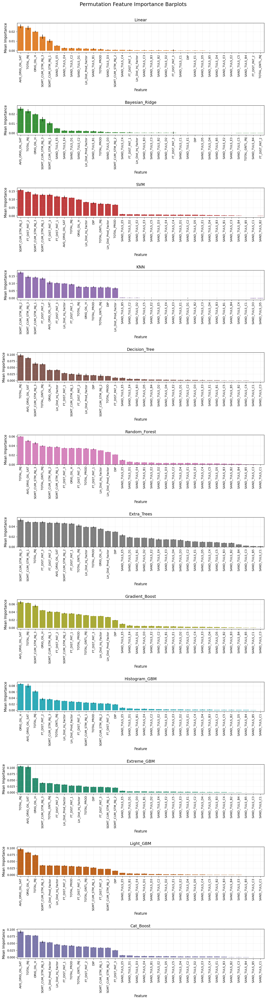

In [237]:
# pfi barplots
pfi_barplot(mean=pfi_mean, 
            std=pfi_std, 
            estimator_names=estimator_names)

In [238]:
# create a function for plotting the boxplots of the permutation feature importance scores for each method
def pfi_boxplot(score, estimator_names):
    # score: list of dataframes of all scores
    # estimator_names: list of estimator names

    # plot the boxplot to compare the spread and centers of the importance of the features
    fig, axs = plt.subplots(figsize=(13, 4*len(score)), nrows=len(score), sharey=False)
    
    colors = cm.get_cmap('tab10').colors + cm.get_cmap('Dark2').colors
    
    for (i, ax), est in zip(enumerate(fig.axes), estimator_names):
        sns.boxplot(data=score[i], orient='v', color=colors[1:][i], ax=ax)

        ax.set_xlabel('Feature', size=12)
        ax.set_ylabel('Importance', size=12)
        ax.set_xticklabels(ax.get_xticklabels(), ha='center', rotation='90')
        #ax.set_yscale('log')
        ax.set_title(est, size=14)
        ax.grid(which='major', alpha=0.2)

    plt.suptitle(y=1.005,  t='Permutation Feature Importance Boxplots', size=18)
    plt.tight_layout(h_pad=3.0)

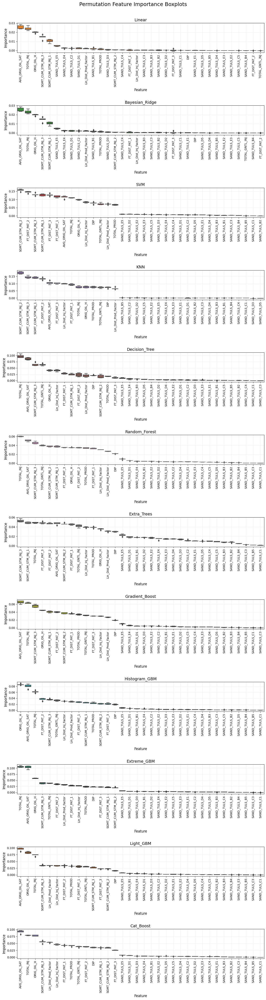

In [239]:
# pfi boxplots
pfi_boxplot(score=pfi_score, 
            estimator_names=estimator_names)

## 7. Test Submission

### 7.1 Model Prediction

In [240]:
# merge all models
all_fit = best_fit + vote_fit + stack_fit

# merge all model names
all_names = estimator_names + vote_names + stack_names

# merge all model scores
all_scrs_df = pd.concat([base_scrs_df, vote_scrs_df, stack_scrs_df], axis=0)
all_scrs_df.head()

,RMSE,MAE,R2,R
Linear,0.394715,0.337346,0.071110,0.464136
Bayesian_Ridge,0.395414,0.338386,0.067818,0.462934
SVM,0.203382,0.120908,0.753383,0.864391
KNN,0.184879,0.071720,0.796214,0.904779
Decision_Tree,0.366590,0.249386,0.198769,0.570772


In [241]:
# obtain the best model
best_fit, best_name = all_fit[np.argmin(all_scrs_df.RMSE)], all_names[np.argmin(all_scrs_df.RMSE)]
best_fit

VotingRegressor(estimators=[('kneighborsregressor',
                             KNeighborsRegressor(n_neighbors=1,
                                                 weights='distance')),
                            ('extratreesregressor',
                             ExtraTreesRegressor(max_depth=39,
                                                 max_features=0.10376730169631804,
                                                 n_estimators=464,
                                                 random_state=1234)),
                            ('svr',
                             SVR(C=9.872250858177594,
                                 epsilon=0.014957331503133714,
                                 gamma=0.25298855240849594))],
                verbose=2)

In [242]:
# best model prediction
y_pred_test = model_pred(X_data=X_test, 
                         est_fit=[best_fit], 
                         estimator_names=[best_name])


*******3_Vote Estimator Prediction*******
Predicting time: 2.235555410385132 seconds


In [243]:
y_pred_test.head()

,3_Vote
SURV_DTE,
1990-01-01,0.004733
1994-09-01,0.242252
1997-05-13,0.382726
1999-01-01,0.442633
2003-01-01,0.683039


### 7.2 Inpection Plots

#### 7.2.1 Production Plot

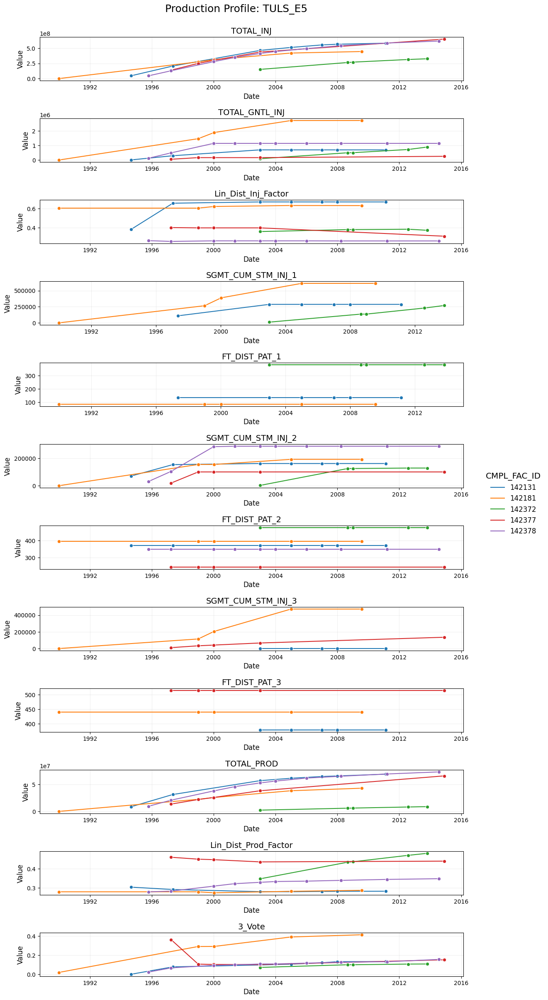

In [244]:
# plot the production profile of the test set
production_plot(data=pd.concat([steam_test, y_pred_test], axis=1), 
                sand=np.unique(steam_test.SAND)[-1], 
                n_wells=5)

## Conclusion

This notebook explored a case study on the application of machine learning to production optimization. The study aimed to forecast the percentage drop in oil saturation, a critical factor for optimizing the steam injected to support hydrocarbon production. In addition, interesting visualizations were developed to provide insight into the production data.

The machine learning models were developed and evaluated using data analytical techniques. This began with an in-depth data exploration to investigate the dataset's inherent properties. Following that, data preprocessing procedures were used to prepare the data for more advanced transformations through feature engineering. Among the feature transformations performed are quantile transformation, which was used to rectify feature scale imbalance and non-standard distribution, and categorical encoding, which was used to convert the categorical features in the dataset to machine-friendly numerical equivalents. Several statistical and datetime features were subsequently generated from the original features in order to take advantage of the ordered sequencing of the observations given the time series nature of the dataset. Furthermore, feature selection and feature extraction strategies were investigated for reducing the dimensionality of the extended feature space. Nonetheless, each feature category was pre-evaluated in order to determine the feature combinations with the highest predictive capability among the feature sets. Following that, employing cross-validation and hyperparameter optimization techniques on several generic and ensemble machine learning algorithms, a rigorous model development was achieved.

The base models were then thoroughly evaluated by assessing the obtained cross-validation and multi-metric scores. Performance indication or model validation charts, such as learning curves, convergence plots, and partial dependence plots, were used to support this. Furthermore, in voting and stacking ensembles, the individual strengths of the base models were pooled to evaluate the prospect of boosting the performance of the high performing base models. The models were then evaluated qualitatively using graphical plots and a measure of feature importance. Following that, the best-performing model, a voting ensemble of the top three performing base models, was deployed to generate predictions on the test dataset.

Overall, machine learning was employed to automate the prediction of the percentage drop in oil saturation, allowing for data-driven optimization of the steam injection program. This is helpful to subsurface engineers, who now have access to a quick and objective machine learning-supported production optimization workflow.